In [1]:
from pydrive2.auth import GoogleAuth
from pydrive2.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
import pandas as pd
import re
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
from math import ceil

In [2]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()

drive = GoogleDrive(gauth)

downloaded = drive.CreateFile({'id': '1j1mbXJtpkwhgvc9Ydlp9tjlLzNeIVlOD'})
downloaded.GetContentFile('data_forecast.zip')

In [3]:
!unzip data_forecast.zip

Archive:  data_forecast.zip
  inflating: alarms-daily-by-regions-240222-041124.csv  
  inflating: __MACOSX/._alarms-daily-by-regions-240222-041124.csv  
  inflating: alarms-daily-kyiv-240222-041124.csv  
  inflating: __MACOSX/._alarms-daily-kyiv-240222-041124.csv  
  inflating: events.csv              
  inflating: __MACOSX/._events.csv   
  inflating: exchange_rates.csv      
  inflating: __MACOSX/._exchange_rates.csv  
  inflating: fuel.csv                
  inflating: __MACOSX/._fuel.csv     
  inflating: sales.csv               
  inflating: __MACOSX/._sales.csv    
  inflating: shop_data.csv           
  inflating: __MACOSX/._shop_data.csv  


In [4]:
rates = pd.read_csv('exchange_rates.csv')
rates['Date'] = pd.to_datetime(rates['Date'], format='%d.%m.%Y')
rates = rates.rename(columns={'Official hrivnya exchange rates, UAH':'rate'})
rates['rate'] = rates['rate'] / rates['Unit']
rates.head()

,Date,Time,Digital code,Letter code,Unit,Currency name,rate
0,2018-01-01,0.0,978,EUR,100,NaN,33.495424
1,2018-01-02,0.0,978,EUR,100,NaN,33.495424
2,2018-01-03,0.0,978,EUR,100,NaN,33.495424
3,2018-01-04,0.0,978,EUR,100,NaN,33.532796
4,2018-01-05,0.0,978,EUR,100,NaN,33.798126


In [5]:
alarm_kyiv = pd.read_csv('alarms-daily-kyiv-240222-041124.csv', delimiter=';')
alarm_ukraine = pd.read_csv('alarms-daily-by-regions-240222-041124.csv', delimiter=';')
alarm_kyiv = alarm_kyiv.drop(columns=['reg_id', 'official_title_uk'])
alarm_ukraine = alarm_ukraine.drop(columns=['reg_id', 'official_title_uk'])
alarm_ukraine = alarm_ukraine.groupby('alarms_date').sum()
alarm_df = pd.merge(alarm_kyiv, alarm_ukraine, left_on='alarms_date', right_index=True)
alarm_df['alarms_quantity'] = alarm_df['alarms_quantity_x'] + alarm_df['alarms_quantity_y']
alarm_df = alarm_df.drop(columns=['alarms_quantity_x', 'alarms_quantity_y'])
alarm_df['alarms_date'] = pd.to_datetime(alarm_df['alarms_date'], format='%Y-%m-%d')
alarm_df = alarm_df.rename(columns={'alarms_date': 'Date'})
alarm_df.head()

,Date,alarms_quantity
0,2022-02-24,4
1,2022-02-25,22
2,2022-02-26,46
3,2022-02-27,65
4,2022-02-28,79


In [18]:
fuel = pd.read_csv('fuel.csv', delimiter=';')
fuel['Diesel'] = fuel['Diesel'].str.replace(',', '.').astype(float)
fuel['Date'] = pd.to_datetime(fuel['Date'], format='%d.%m.%Y')
fuel.head()

,Date,Diesel
0,2019-01-02,29.10
1,2019-01-03,29.08
2,2019-01-04,29.04
3,2019-01-08,28.59
4,2019-01-09,28.57


In [6]:
sales = pd.read_csv('sales.csv', delimiter=';')
sales_df = sales.loc[:, ~sales.columns.str.contains('^Unnamed')]
sales_df.loc[:, 'Sales'] = sales_df['Sales'].str.replace(' ', '').str.replace(',', '.').astype(float)
sales_df['Date'] = pd.to_datetime(sales_df['Date'], format='%d.%m.%Y')
sales_df = sales_df.sort_values(by='Date')
sales_df.tail()

<ipython-input-6-da481df19b79>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sales_df['Date'] = pd.to_datetime(sales_df['Date'], format='%d.%m.%Y')


,Shop,Date,Sales
29396,2,2023-10-31,22721.47
29395,1,2023-10-31,19389.67
29423,29,2023-10-31,19343.99
29408,14,2023-10-31,21738.44
29424,30,2023-10-31,24290.96


In [7]:
events = pd.read_csv('events.csv', delimiter=';')
events['Date_start'] = pd.to_datetime(events['Date_start'], format='%d.%m.%Y')
events['Date_end'] = pd.to_datetime(events['Date_end'], format='%d.%m.%Y')
events.head()

,Date_start,Date_end,Type,Event
0,2019-02-22,2019-02-23,Promotion,Promo1
1,2019-10-25,2019-10-25,Promotion,Halloween
2,2019-11-29,2019-12-01,Promotion,Black Friday
3,2020-02-21,2020-02-22,Promotion,Promo1
4,2020-03-16,2020-05-11,Lockdown,Hard lockdown


In [8]:
shops_df = pd.read_csv('shop_data.csv', delimiter=';')
shops_df['City'] = shops_df['City'].str.extract('(\d+)').astype(int)
shops_df['Region'] = shops_df['Region'].str.extract('(\d+)').astype(int)
shops_df = shops_df.rename(columns={'Shop': 'shop_key'})
shops_df['Trade_area'] = shops_df['Trade_area'].str.replace(',', '.').astype(float)
shops_df['Open_date'] = pd.to_datetime(shops_df['Open_date'], format='%d.%m.%Y')
shops_df.head()

,shop_key,Open_date,Change_type,Trade_area,City,Region,City area,Local_reference,Floor
0,1,2018-10-04,NaN,36.04,15,1,sleeping quarters,bazaar,1
1,1,2021-12-20,Extension,48.05,15,1,sleeping quarters,bazaar,1
2,2,2018-01-12,NaN,30.93,8,2,periphery,supermarket,1
3,3,2018-02-16,NaN,36.94,27,3,centre,administrative institution,1
4,4,2018-01-22,NaN,17.42,7,4,sleeping quarters,supermarket,1


In [ ]:
def hbar(ddct, y_title, x_title):
  cat_vals = {k: len(v) for k, v in ddct.items()}
  categories = list(cat_vals.keys())
  values = list(cat_vals.values())

  plt.barh(categories, values)


  plt.xlabel(f'{x_title}')
  plt.ylabel(f'{y_title}')
  plt.title(f'{x_title} x {y_title}')

  plt.show()

In [ ]:
def plot_hists():
  city = dict()
  region = dict()
  city_area = dict()
  local_reference = dict()
  for i in range(shops_df.shape[0]):
    row = shops_df.iloc[i]
    if row['City'] not in city.keys():
      city[row['City']] = {row['shop_key']}
    else:
      city[row['City']].add(row['shop_key'])

    if row['Region'] not in region.keys():
      region[row['Region']] = {row['shop_key']}
    else:
      region[row['Region']].add(row['shop_key'])

    if row['City area'] not in city_area.keys():
      city_area[row['City area']] = {row['shop_key']}
    else:
      city_area[row['City area']].add(row['shop_key'])

    if row['Local_reference'] not in local_reference.keys():
      local_reference[row['Local_reference']] = {row['shop_key']}
    else:
      local_reference[row['Local_reference']].add(row['shop_key'])

  hbar(city, 'City', 'Store Count')
  hbar(region, 'Region', 'Store Count')
  hbar(city_area, 'City Area', 'Store Count')
  hbar(local_reference, 'Local Reference', 'Store Count')

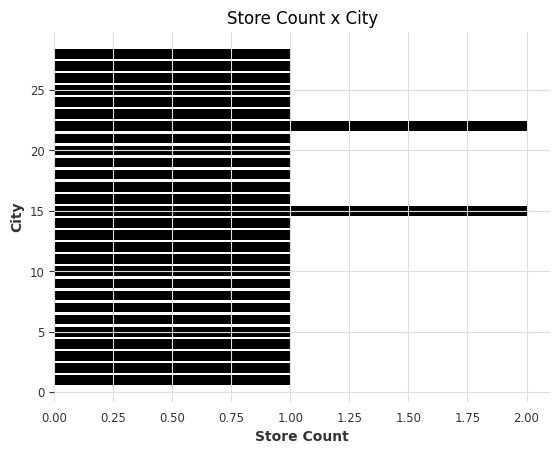

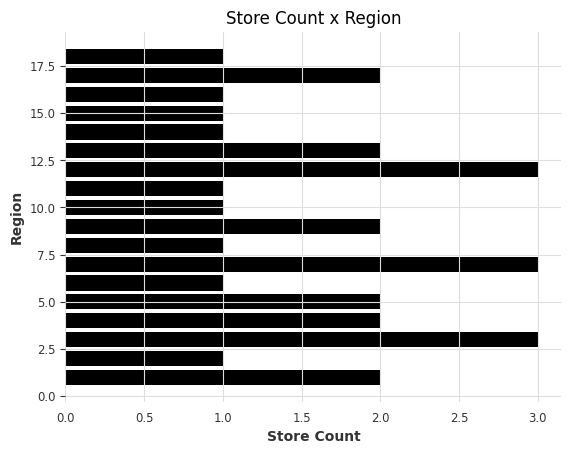

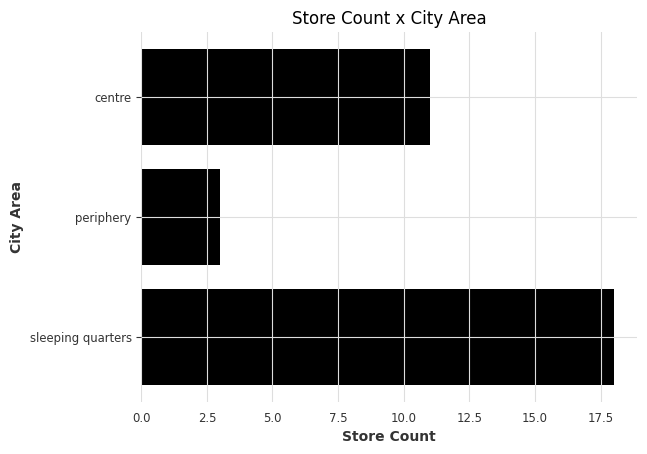

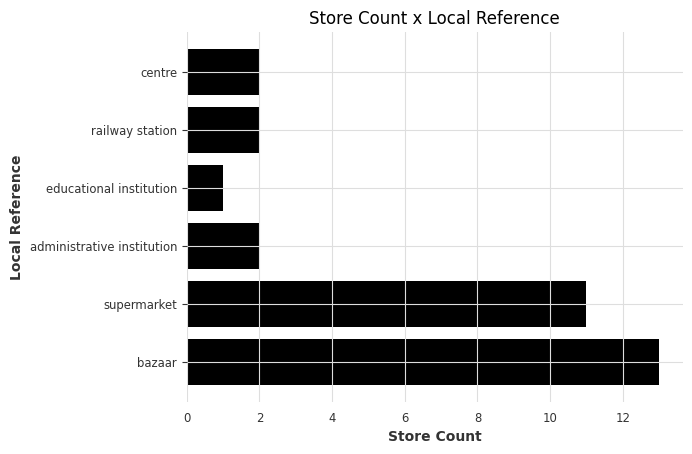

In [ ]:
plot_hists()

In [ ]:
# show how many stores are in different categories

In [9]:
def rmse_manual(y_true, y_pred):
  mse = np.mean((y_pred - y_true) ** 2)
  return np.sqrt(mse)

In [10]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor
from pprint import pprint

WINDOW_SIZE=30
def impute_missing(dfs):
  """
  The function to choose the best method for missing values imputation
  Imputation with the best method chosen
  """
  if type(dfs) is not dict:
    dfs = {'0': dfs}
  res = {}
  for k, df in dfs.items():
    rows_all_nan = df[df['Sales'].isna()==True]
    rows_all_nan = rows_all_nan.reset_index()

    # check if there are missing values
    if rows_all_nan.empty:
      res[k] = df
      continue

    # find the largest consecutive NaN group
    rows_all_nan['Consecutive_Group'] = (rows_all_nan['Date'].diff().dt.days != 1).cumsum()
    largest_group = rows_all_nan.groupby('Consecutive_Group').size().idxmax()
    largest_consecutive_series = rows_all_nan[rows_all_nan['Consecutive_Group'] == largest_group]
    # print('Largest missing values cluster is:', largest_consecutive_series.shape[0])
    # Get NaN group date range
    stop_date = largest_consecutive_series.iloc[0]['Date'] - pd.Timedelta(1)
    first_date = rows_all_nan[rows_all_nan['Date'] < stop_date]['Date'].max() + pd.Timedelta(1)
    if first_date is pd.NaT:
      first_date = df['Date'].min()
    # Get train dataframe
    df = df.reset_index()
    subset_between_dates = df[(df['Date'] >= first_date) & (df['Date'] <= stop_date)]

    # WINDOW_SIZE = largest_consecutive_series.shape[0]
    # Divide into Train Test
    test_df = subset_between_dates.copy()
    test_series = subset_between_dates[-largest_consecutive_series.shape[0]:]['Sales']
    test_df.iloc[-largest_consecutive_series.shape[0]:, test_df.columns.get_loc('Sales')] = np.nan

    # if the largest missing values group is so small, just don't care about backtesting
    if test_df.shape[0] < largest_consecutive_series.shape[0] + 10:
      rolling_mean = df['Sales'].rolling(window=WINDOW_SIZE, min_periods=1).mean()
      df['Sales'] = df['Sales'].fillna(rolling_mean).infer_objects(copy=False)
      res[k] = df
      continue

    # Choosing method
    rmse_compare = {}

    # Backward filling
    temp = test_df.copy().fillna(method='ffill')
    rmse_compare['backward'] = rmse_manual(test_series.values, temp[-largest_consecutive_series.shape[0]:].Sales.values)
    # Forward filling
    temp = test_df.copy().fillna(method='bfill')
    rmse_compare['forward'] = rmse_manual(test_series.values, temp[-largest_consecutive_series.shape[0]:].Sales.values)
    # Rolling Mean
    temp = subset_between_dates['Sales'].rolling(window=WINDOW_SIZE, center=True, min_periods=1).mean()
    rmse_compare['rolling_mean'] = rmse_manual(test_series.values, temp[-largest_consecutive_series.shape[0]:].values)

    # Rolling Median
    temp = subset_between_dates['Sales'].rolling(window=WINDOW_SIZE, center=True, min_periods=1).median()
    rmse_compare['rolling_median'] = rmse_manual(test_series.values, temp[-largest_consecutive_series.shape[0]:].values)

    # Multivariate imputation(Regularized Linear Regression)
    imputer = IterativeImputer()
    imputed_data = imputer.fit_transform(test_df['Sales'].values.reshape(-1, 1))
    rmse_compare['multivariate (Reg Lin Regr)'] = rmse_manual(test_series.values, imputed_data[-largest_consecutive_series.shape[0]:])

    # Multivariate imputation(Random Forest)
    imputer = IterativeImputer(estimator=RandomForestRegressor(), max_iter=10)
    imputed_data = imputer.fit_transform(test_df['Sales'].values.reshape(-1, 1))
    rmse_compare['multivariate (Random Forest)'] = rmse_manual(test_series.values, imputed_data[-largest_consecutive_series.shape[0]:])

    # Get lowest rmse
    min_key = min(rmse_compare, key=rmse_compare.get)
    min_value = rmse_compare[min_key]
    print(f'Best method for shop {int(k)} is {min_key} with RMSE: {min_value}')

    if 'mean' in min_key:
      while df['Sales'].isnull().any():
        df['Sales'] = df['Sales'].fillna(
          df['Sales'].rolling(window=WINDOW_SIZE, min_periods=1).mean()
        )

    if 'median' in min_key:
      while df['Sales'].isnull().any():
        df['Sales'] = df['Sales'].fillna(
          df['Sales'].rolling(window=WINDOW_SIZE, min_periods=1).median()
        )

    if 'Regr' in min_key:
      while df['Sales'].isnull().any():
        imputer = IterativeImputer()
        imputed_data = imputer.fit_transform(df[['Sales']])
        df['Sales'] = imputed_data.flatten()

    if 'Random' in min_key:
      while df['Sales'].isnull().any():
        imputer = IterativeImputer(
          estimator=RandomForestRegressor(), max_iter=10, random_state=0
        )
      imputed_data = imputer.fit_transform(df[['Sales']])
      df['Sales'] = imputed_data.flatten()

    if 'backward' in min_key:
      while df['Sales'].isnull().any():
        df['Sales'] = df['Sales'].fillna(method='bfill')

    if 'forward' in min_key:
      while df['Sales'].isnull().any():
        df['Sales'] = df['Sales'].fillna(method='ffill')

    res[k] = df
  return res

In [11]:
from datetime import datetime, timedelta
# form events per specific store
def form_events(df):
  """
  Creates events for a specific shop
  """
  res = {}
  event_types = events['Type'].unique()
  for event_type in event_types:
    inter_res = []
    for index, row in events[events['Type']==event_type].iterrows():
      start_date = row['Date_start']
      end_date = row['Date_end']
      for day in range((end_date - start_date).days + 1):
        inter_res.append((start_date + timedelta(days=day)).strftime('%Y-%m-%d'))
    res[event_type] = inter_res
  nan_sales_dates = df[df['Sales'].isna()]['Date'].values
  res['Out Of Office'] = [
    pd.Timestamp(ddate).strftime('%Y-%m-%d') for ddate in df[df['Sales'].isna()]['Date'].values
]
  return res

In [12]:
# construct dataset
def match_area_floor_lref(inter_df, shop_info):
  """
  Helper function to match Area, Floor, City Area and Local Reference
  Changed after renovation or extension
  """
  inter_df.loc[:, 'Area'] = 0.0
  inter_df.loc[:, 'Floor'] = 1
  inter_df.loc[:, 'Local_reference'] = ''
  inter_df.loc[:, 'City area'] = ''
  shop_info = shop_info.reset_index(drop=True)
  if shop_info.shape[0] > 1:
      pivot_date = shop_info.loc[1, 'Open_date']
      inter_df.loc[inter_df['Date'] >= pivot_date, 'Area'] = shop_info.loc[1, 'Trade_area']
      inter_df.loc[inter_df['Date'] < pivot_date, 'Area'] = shop_info.loc[0, 'Trade_area']
      inter_df.loc[inter_df['Date'] >= pivot_date, 'Floor'] = shop_info.loc[1, 'Floor']
      inter_df.loc[inter_df['Date'] < pivot_date, 'Floor'] = shop_info.loc[0, 'Floor']
      inter_df.loc[inter_df['Date'] >= pivot_date, 'Local_reference'] = shop_info.loc[1, 'Local_reference']
      inter_df.loc[inter_df['Date'] < pivot_date, 'Local_reference'] = shop_info.loc[0, 'Local_reference']
      inter_df.loc[inter_df['Date'] >= pivot_date, 'City area'] = shop_info.loc[1, 'City area']
      inter_df.loc[inter_df['Date'] < pivot_date, 'City area'] = shop_info.loc[0, 'City area']
  else:
      inter_df.loc[:, 'Area'] = shop_info['Trade_area'].iloc[0]
      inter_df.loc[:, 'Floor'] = shop_info['Floor'].iloc[0]
      inter_df.loc[:, 'Local_reference'] = shop_info['Local_reference'].iloc[0]
      inter_df.loc[:, 'City area'] = shop_info['City area'].iloc[0]
  return inter_df

def add_currency(inter_df):
  """
  Add currency rates to dataset
  """
  inter_df = pd.merge(
      inter_df,
      rates[rates['Letter code']=='EUR'][['Date', 'rate']],
      on='Date',
      how='left')
  inter_df = inter_df.rename(columns={'rate':'EUR'})
  inter_df['EUR'] = round(inter_df['EUR'],2)
  inter_df = pd.merge(
      inter_df,
      rates[rates['Letter code']=='USD'][['Date', 'rate']],
      on='Date',
      how='left')
  inter_df = inter_df.rename(columns={'rate':'USD'})
  inter_df['EUR'] = round(inter_df['USD'],2)
  return inter_df

def add_alerts(inter_df):
  """
  Add consolidated data about air alerts
  """
  inter_df = pd.merge(
      inter_df,
      alarm_df,
      on='Date',
      how='left')
  inter_df['alarms_quantity'] = inter_df['alarms_quantity'].fillna(0)
  inter_df['alarms_quantity'] = inter_df['alarms_quantity'].astype(int)
  inter_df = inter_df.sort_values(by='Date')
  return inter_df

SALES_LAGS = []
def get_filtered_df(shop=None,
                    city=None,
                    region=None,
                    city_area=None,
                    local_reference=None,
                    floor=None,
                    fill_zero=False,
                    WINDOW_SIZE=30):
  """
  Provide detailed filters to plot data. Filters are:
  shops as list of shop numbers ex. [1, 2, 3]
  city as list of city numbers ex. [1, 2, 3]
  region as list of region numbers ex. [1, 2, 3]
  city_area as list of city area ex. [center]
  local_reference as list of local_reference ex. [bazaar]
  floor as list of floor ex. [1]

  As a result, the dict of values will be returned were keys are shop numbers
  and values are datasets. The datasets contain full data
  """

  if shop is None:
      shop = shops_df['shop_key'].unique().tolist()
  if city is None:
      city = shops_df['City'].unique().tolist()
  if region is None:
      region = shops_df['Region'].unique().tolist()
  if city_area is None:
      city_area = shops_df['City area'].unique().tolist()
  if local_reference is None:
      local_reference = shops_df['Local_reference'].unique().tolist()
  if floor is None:
      floor = shops_df['Floor'].unique().tolist()

  if (not set(shop).issubset(shops_df['shop_key'].unique())) or \
      (not set(city).issubset(shops_df['City'].unique())) or \
      (not set(region).issubset(shops_df['Region'].unique())) or \
      (not set(city_area).issubset(shops_df['City area'].unique())) or \
      (not set(local_reference).issubset(shops_df['Local_reference'].unique())) or \
      (not set(floor).issubset(shops_df['Floor'].unique())):
      return 'Check your input'

  res_dfs = []

  filtering_dct = {
      'shop_key': shop,
      'City': city,
      'Region': region,
      'City area': city_area,
      'Local_reference': local_reference,
      'Floor': floor
  }

  filtered_df = shops_df.copy()
  for key, var in filtering_dct.items():
    filtered_df = filtered_df[filtered_df[key].isin(var)]

  filtered_df = filtered_df.drop_duplicates(subset='shop_key')

  filtered_df = filtered_df[['shop_key', 'City', 'Region', 'City area', 'Local_reference', 'Floor']]

  merged_df = pd.merge(sales_df, filtered_df, left_on='Shop', right_on='shop_key', how='inner')
  merged_df.drop(columns=['shop_key'], inplace=True)

  merged_df['Date'] = pd.to_datetime(merged_df['Date'], format='%d.%m.%Y')
  shops = merged_df['Shop'].unique().tolist()
  print('Shops in such category:', *shops)
  for i in range(len(shops)):
    shop_num = int(shops[i])
    inter_df = merged_df[merged_df['Shop'] == shop_num].copy()
    shop_info = shops_df[shops_df['shop_key'] == shop_num]
    inter_df = inter_df.set_index('Date').asfreq('D')
    inter_df = inter_df.reset_index().rename(columns={'index': 'Date'})

    # ensure Area and Floor changes
    inter_df = match_area_floor_lref(inter_df, shop_info)

    # Add fuel data
    inter_df = pd.merge(inter_df, fuel, on='Date', how='left')
    # Add exchange rates data
    inter_df = add_currency(inter_df)
    # Add air alerts data
    inter_df = add_alerts(inter_df)
    # Add lagged values
    for lag in SALES_LAGS:
      inter_df['Sales_{0}'.format(lag)] = inter_df['Sales'].shift(lag)
    # Add information related to date
    inter_df['day'] = inter_df['Date'].dt.day
    inter_df['week'] = inter_df['Date'].dt.isocalendar().week
    inter_df['year'] = inter_df['Date'].dt.year

    inter_df = inter_df.set_index('Date')
    inter_df = inter_df.asfreq('D')
    inter_df = inter_df.reset_index()

    # Filling zeros
    if fill_zero:
      inter_df = impute_missing(inter_df, WINDOW_SIZE=WINDOW_SIZE)['0']
      inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
      inter_df['Sales'] = inter_df['Sales'].fillna(method='bfill')

    # Ensuring missing categories
    for col in inter_df.columns:
      if col != 'Sales':
          inter_df[col] = inter_df[col].fillna(method='ffill')
          inter_df[col] = inter_df[col].fillna(method='bfill')

    for key, var in filtering_dct.items():
      if key == 'shop_key':
        key = 'Shop'
      inter_df = inter_df[inter_df[key].isin(var)]

    events = form_events(inter_df)
    res_dfs.append((inter_df, events))
  return dict(zip(shops, res_dfs))

In [ ]:
# plot ts
def plot_filtered_ts(shop=None,
                    city=None,
                    region=None,
                    city_area=None,
                    local_reference=None,
                    floor=None,
                    daily=False,
                    weekly=False,
                    monthly=False,
                    fill_zero=False,
                    WINDOW_SIZE=30):
  """
  Provide detailed filters to plot data. Filters are:
  shops as list of shop numbers ex. [1, 2, 3]
  city as list of city numbers ex. [1, 2, 3]
  region as list of region numbers ex. [1, 2, 3]
  city_area as list of city area ex. [center]
  local_reference as list of local_reference ex. [bazaar]
  floor as list of floor ex. [1]

  There is also possibility to choose period for ts like daily, weekly, monthly
  by providing Bool values as an appropriate argument

  As a result, the plots on daily, weekly, yearly data will be provided as output
  for each shop in this group
  """
  dfs = get_filtered_df(shop, city, region, city_area, local_reference, floor, fill_zero)

  for shop_index, df in dfs.items():
    df_to_use = df[0].copy()
    df_to_use = df_to_use[['Date', 'Sales']]

    if daily:
      # Daily Data

      df_to_use.plot(x='Date', y='Sales')
      plt.xlabel('Day')
      plt.ylabel('Total Sales')
      plt.title(f'Total Sales by Day SHOP{shop_index}')
      plt.xticks(rotation=45)
      plt.tight_layout()

      plt.show()

    if weekly:
      # Weekly data

      weekly_sales = df.groupby(pd.Grouper(key='Date', freq='1W'))['Sales'].sum()
      weekly_sales.plot(x='Date', y='Sales')

      plt.xlabel('Week')
      plt.ylabel('Total Sales')
      plt.title(f'Total Weekly Sales SHOP{shop_index}')
      plt.xticks(rotation=45)
      plt.tight_layout()

      plt.show()

    if monthly:
      # Monthly data

      monthly_sales = df.groupby(pd.Grouper(key='Date', freq='1M'))['Sales'].sum()
      monthly_sales.plot(x='Date', y='Sales')

      plt.xlabel('Month')
      plt.ylabel('Total Sales')
      plt.title(f'Total Monthly Sales SHOP{shop_index}')
      plt.xticks(rotation=45)
      plt.tight_layout()

      plt.show()


Shops in such category: 20
Best method for shop 0 is backward with RMSE: 45.340000000000146


<ipython-input-11-3d69423384f8>:51: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:51: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='bfill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-

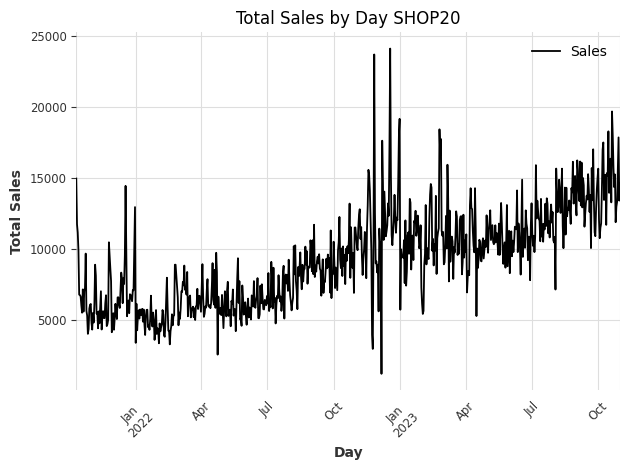

Shops in such category: 21
Best method for shop 0 is backward with RMSE: 1970.869999999999


<ipython-input-11-3d69423384f8>:51: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:51: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='bfill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-

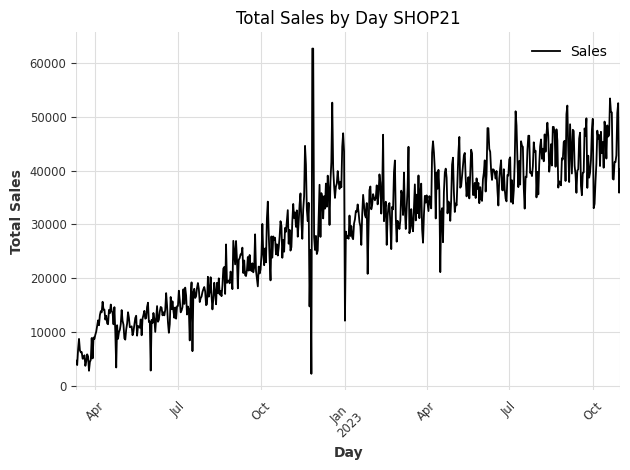

Shops in such category: 22


<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:183: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='bfill')
<ipython-input-13-8fa0d4602cf3>:188: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


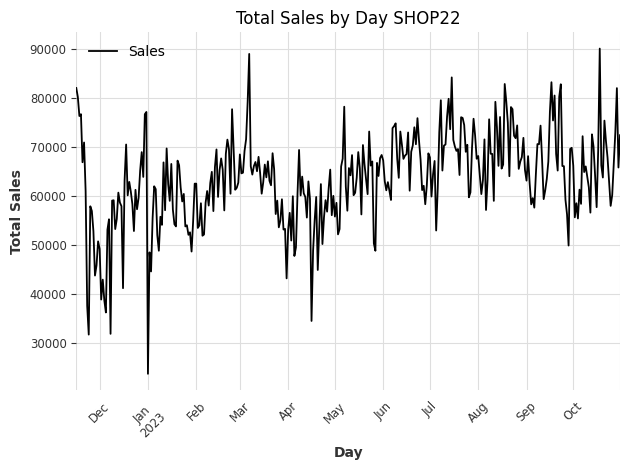

Shops in such category: 23
Best method for shop 0 is rolling_median with RMSE: 219.0550000000003


<ipython-input-11-3d69423384f8>:51: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:51: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='bfill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-

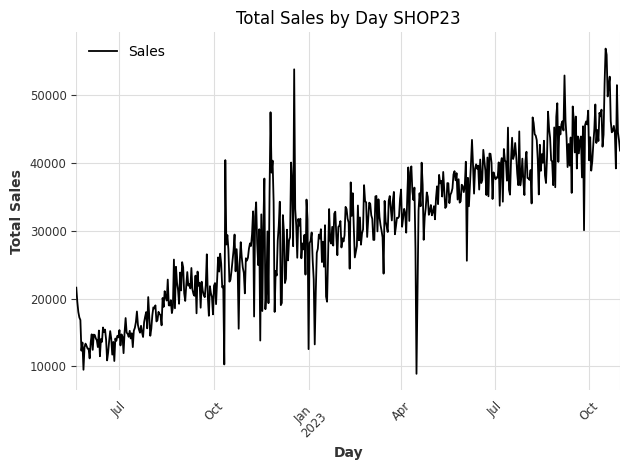

Shops in such category: 24
Best method for shop 0 is backward with RMSE: 1420.9599999999991


<ipython-input-11-3d69423384f8>:51: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:51: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='bfill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-

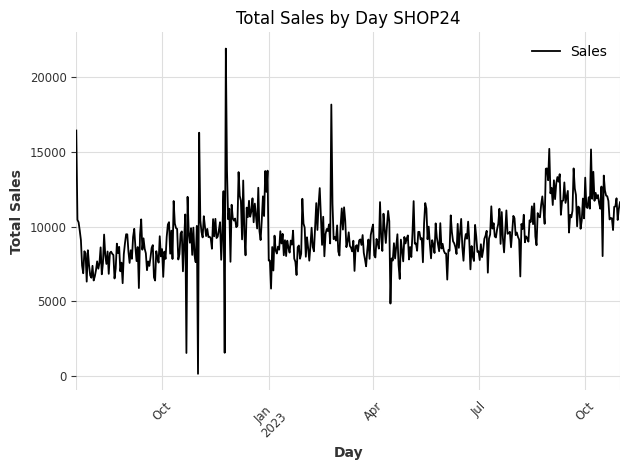

Shops in such category: 25


<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:183: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='bfill')
<ipython-input-13-8fa0d4602cf3>:188: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


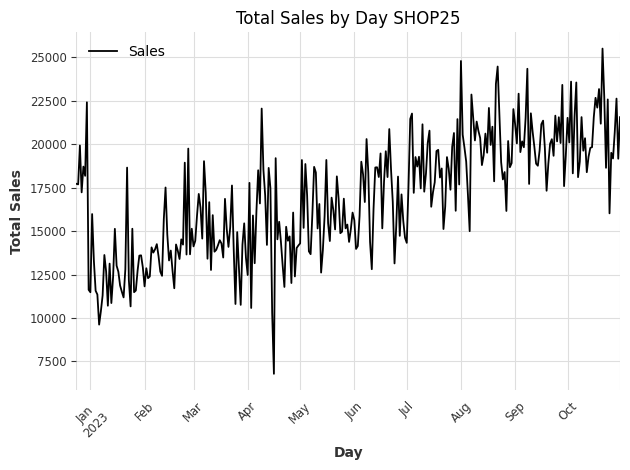

Shops in such category: 26
Best method for shop 0 is rolling_mean with RMSE: 1821.8647598736836


<ipython-input-11-3d69423384f8>:51: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:51: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='bfill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-

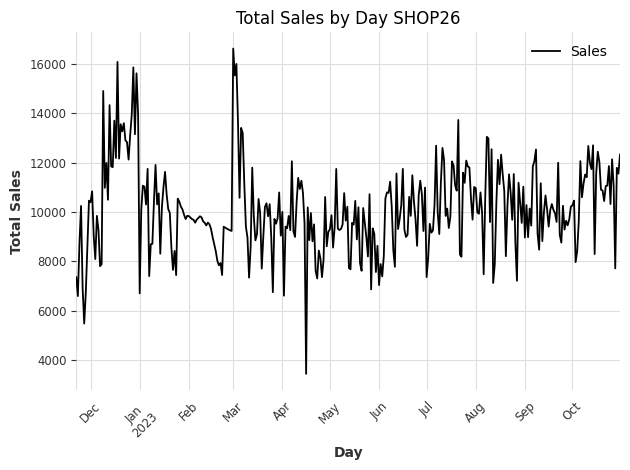

Shops in such category: 27


<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:183: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='bfill')
<ipython-input-13-8fa0d4602cf3>:188: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


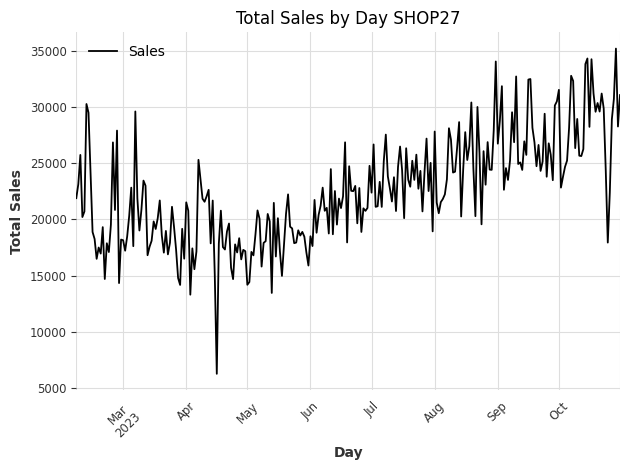

Shops in such category: 28


<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:183: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='bfill')
<ipython-input-13-8fa0d4602cf3>:188: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


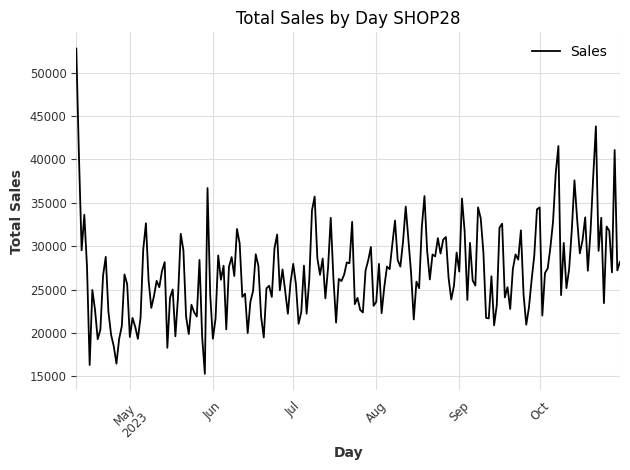

Shops in such category: 29


<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:183: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='bfill')
<ipython-input-13-8fa0d4602cf3>:188: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


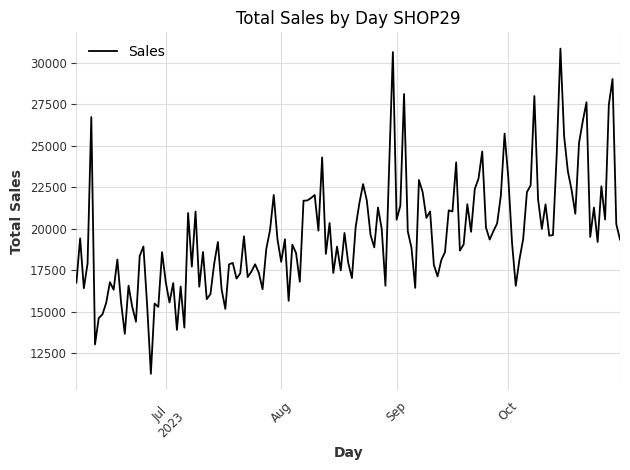

Shops in such category: 30


<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:183: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='bfill')
<ipython-input-13-8fa0d4602cf3>:188: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


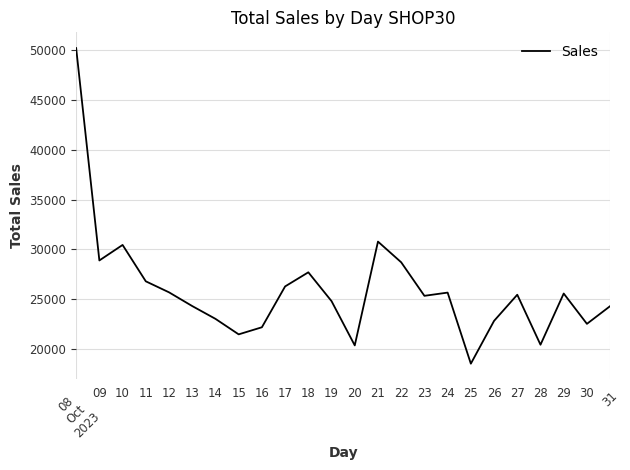

In [ ]:
# Plot last 10 shops
for i in range(20, len(sales['Shop'].unique()) + 1):
  plot_filtered_ts(shop=[i], daily=True, fill_zero=True)

In [ ]:
# Global Models

In [ ]:
# Nbeats among categories

In [14]:
!pip install darts

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.0/52.0 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.8/165.8 kB 7.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 934.2/934.2 kB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 57.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 36.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 319.1/319.1 kB 22.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.6/275.6 kB 20.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.2/278.2 kB 18.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 45.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 3.0 MB/s eta 0:00:0

In [15]:
from darts.dataprocessing.transformers import Scaler
from darts import TimeSeries
from darts.models import NBEATSModel
from darts.metrics.metrics import rmse

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [16]:
from darts.utils.statistics import check_seasonality
from darts.metrics import mape
import numpy as np
from pytorch_lightning.callbacks.early_stopping import EarlyStopping

#exog_vars = ['Floor', 'EUR', 'USD', 'Diesel', 'day', 'week', 'year', 'alarms_quantity', 'Area']

def transform_df(shop=None,
                 city=None,
                 region=None,
                 city_area=None,
                 local_reference=None,
                 floor=None,
                 fill_zero=True,
                 only_year=True,
                 exog_vars=None):
  """
  Function to convert each dataset into darts TimeSeries
  And add exogenous factors if asked

  only-year: bool variable standing for shops with data over than 300 data points
  """
  dfs = get_filtered_df(shop,
                        city,
                        region,
                        city_area,
                        local_reference,
                        floor,
                        fill_zero)
  res = {}
  for key, tup in dfs.items():
    if only_year:
      if tup[0].shape[0] >= 300:
        res[key] = TimeSeries.from_dataframe(tup[0][['Date', 'Sales']], time_col='Date', value_cols='Sales')
    else:
      res[key] = TimeSeries.from_dataframe(tup[0][['Date', 'Sales']], time_col='Date', value_cols='Sales')

  if exog_vars is not None:
    exog = {}
    for key, tup in dfs.items():
      if only_year:
        if tup[0].shape[0] >= 300:
          exog[key] = TimeSeries.from_dataframe(tup[0][['Date']+exog_vars], time_col='Date', value_cols=exog_vars)
      else:
        exog[key] = TimeSeries.from_dataframe(tup[0][['Date']+exog_vars], time_col='Date', value_cols=exog_vars)
    return res, exog
  return res

def scale_dfs(dfs):
  """
  Applies [0; 1] scaling and returns scaled dataframes and scalers
  """
  scalers = {}
  scaled_dfs = {}
  for key, df in dfs.items():
    scaler = Scaler()
    scaled_dfs[key] = scaler.fit_transform(df)
    scalers[key] = scaler
  return scaled_dfs, scalers

def get_train_test(dfs, test_pivot):
  """
  Divides dataset into train and test sets
  """
  train, test = {key: df[:df.shape[0]-test_pivot] for key, df in dfs.items()}, {key: df[df.shape[0]-test_pivot:] for key, df in dfs.items()}
  return train, test

def check_daily_seasonality(dfs):
  """
  Checks for existing seasonality in dataset
  """
  for key, df in dfs.items():
    print(f'Shop = {key}')
    is_daily_seasonal, daily_period = check_seasonality(df, m=7, max_lag=400, alpha=0.05)
    print(f'Daily seasonality: {is_daily_seasonal} - period = {daily_period}')

def validation(model, train, test, scalers, test_pivot, k, plot_folds=False, exogs=None):
  """
  Function to run k-fold validation
  plot_folds = Bool stands for option to plot graph on each fold
  """
  print('Running validation...')
  mean_mape_test = []
  for key in train.keys():
    mape_validation = []
    print(f'Shop = {key}')
    # Validation
    for i in range(k):
      print(f'K-Fold Round = {i+1}')
      train_val = train[key][:train[key].shape[0]-test_pivot*(i+1)]
      test_val = train[key][train[key].shape[0]-test_pivot*(i+1):train[key].shape[0]-test_pivot*i]
      if exogs is None:
        pred = model.predict(n=test_pivot, series=train_val, show_warnings=False, verbose=False)
      else:
        pred = model.predict(n=test_pivot, series=train_val, past_covariates=exogs[key], show_warnings=False, verbose=False)
      train_val = scalers[key].inverse_transform(train_val)
      test_val = scalers[key].inverse_transform(test_val)
      pred = scalers[key].inverse_transform(pred)
      if plot_folds:
        train_val.plot(label='Train Actual')
        test_val.plot(label='Test Actual')
        pred.plot(label='forecast')
        plt.show()
      print('MAPE = {:.2f}%'.format(mape(test_val, pred)))
      mape_validation.append(mape(test_val, pred))
    # Test
    tr = scalers[key].inverse_transform(train[key])
    ts = scalers[key].inverse_transform(test[key])
    tr.plot(label='Train Actual')
    ts.plot(label='Test Actual')
    if exogs is None:
      pred = model.predict(n=test_pivot, series=train[key], show_warnings=False, verbose=False)
    else:
      pred = model.predict(n=test_pivot, series=train[key], past_covariates=exogs[key], show_warnings=False, verbose=False)
    pred = scalers[key].inverse_transform(pred)
    pred.plot(label='forecast')
    plt.legend()
    plt.show()

    ts.plot(label='Test Actual')
    pred.plot(label='forecast')
    plt.legend()
    plt.show()

    print('MEAN Validation MAPE = {:.2f}%'.format(np.mean(mape_validation)))
    print('TEST MAPE = {:.2f}%'.format(mape(ts, pred)))
    mean_mape_test.append(mape(ts, pred))
  # Mean over Test
  print('Mean TEST MAPE = {:.2f}%'.format(np.mean(mean_mape_test)))

In [ ]:
dfs = transform_df(local_reference=['bazaar'], city_area=['sleeping quarters'])
# check_daily_seasonality(dfs)
scaled_dfs, scalers = scale_dfs(dfs)
train, test = get_train_test(scaled_dfs, 30)

In [ ]:
# Basic model without exogeneous factors
model = NBEATSModel(input_chunk_length=28,
                    output_chunk_length=7,
                    n_epochs=15,
                    random_state=42)

In [ ]:
model.fit([df for df in train.values()], verbose=True)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 6.2 M  | train
------------------

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.


NBEATSModel(output_chunk_shift=0, generic_architecture=True, num_stacks=30, num_blocks=1, num_layers=4, layer_widths=256, expansion_coefficient_dim=5, trend_polynomial_degree=2, dropout=0.0, activation=ReLU, input_chunk_length=28, output_chunk_length=7, n_epochs=15, random_state=42)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Shop = 1
K-Fold Round = 1
MAPE = 11.39%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.07%
K-Fold Round = 3
MAPE = 12.24%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.26%


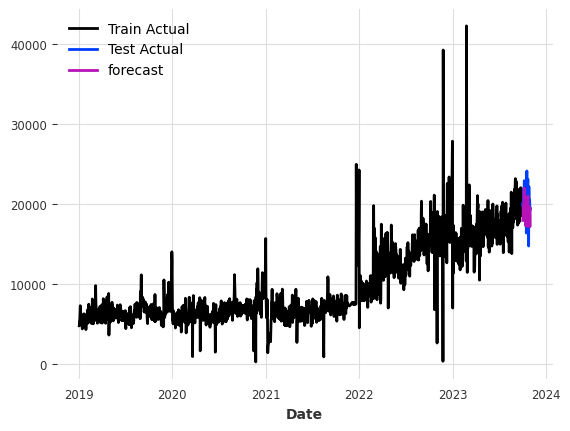

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 11.49%
TEST MAPE = 9.26%
Shop = 6
K-Fold Round = 1
MAPE = 7.97%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


MAPE = 12.27%
K-Fold Round = 3
MAPE = 10.89%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.21%


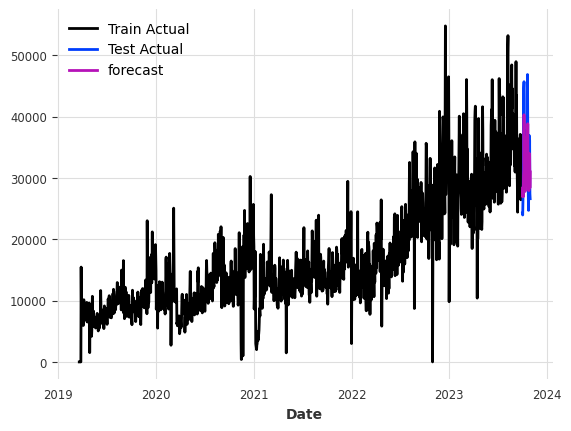

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 11.08%
TEST MAPE = 10.21%
Shop = 10
K-Fold Round = 1
MAPE = 6.54%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.00%
K-Fold Round = 3
MAPE = 9.45%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 18.12%


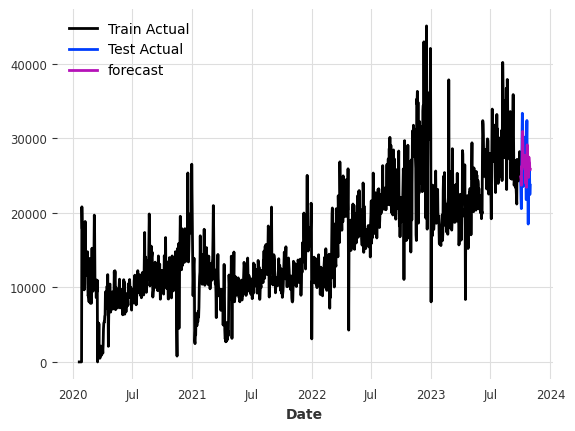

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 11.28%
TEST MAPE = 10.94%
Shop = 11
K-Fold Round = 1
MAPE = 9.47%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.45%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 15.49%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 14.36%


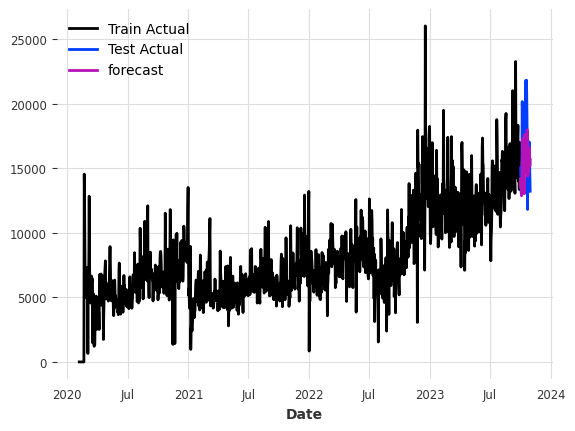

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 12.94%
TEST MAPE = 11.21%
Shop = 13
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 7.83%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.49%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.92%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 8.69%


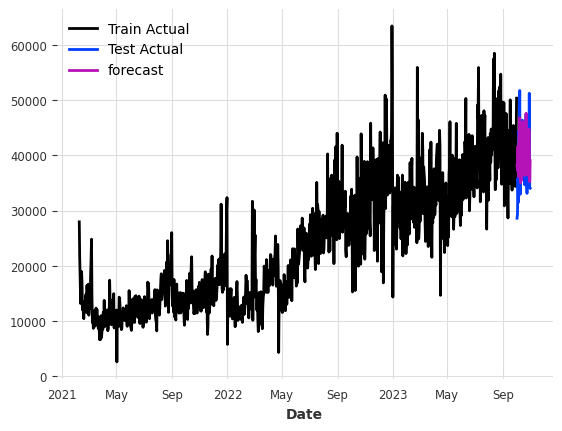

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 9.24%
TEST MAPE = 9.79%
Shop = 15
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.68%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.74%
K-Fold Round = 3
MAPE = 8.07%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.60%


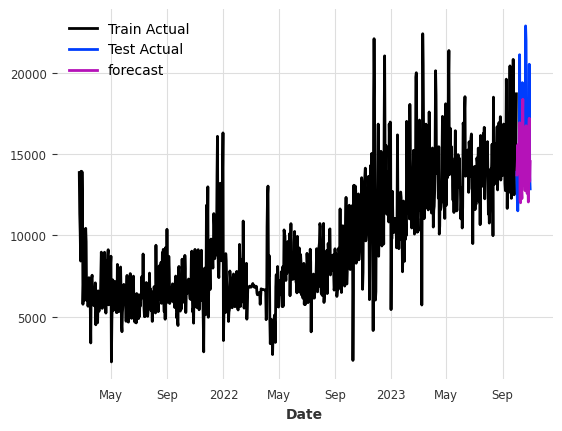

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 9.52%
TEST MAPE = 16.11%
Shop = 18
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.32%
K-Fold Round = 2
MAPE = 10.09%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 21.88%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 23.14%


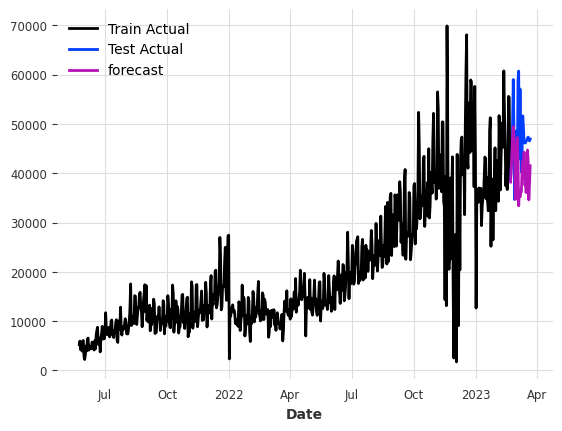

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 16.61%
TEST MAPE = 15.47%
Shop = 20
K-Fold Round = 1
MAPE = 10.73%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 16.62%
K-Fold Round = 3
MAPE = 9.26%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.82%


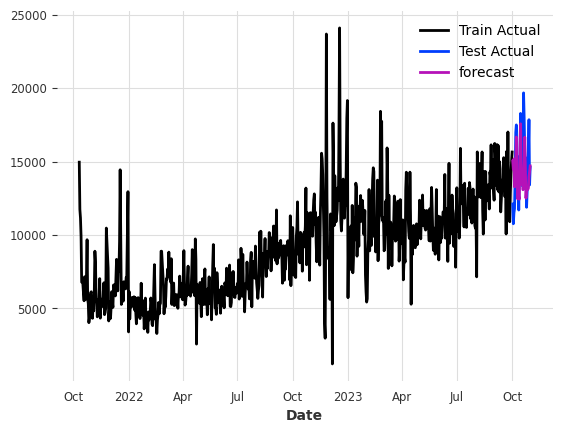

MEAN Validation MAPE = 11.86%
TEST MAPE = 12.15%
Mean TEST MAPE = 11.89%


In [ ]:
validation(model, train, test, scalers, 30, 4)

In [ ]:
# Model with all possible exogs
model_exog_extended = NBEATSModel(input_chunk_length=28,
                    output_chunk_length=7,
                    n_epochs=15,
                    random_state=42)

In [ ]:
exog_vars = ['Floor', 'EUR', 'USD', 'Diesel', 'day', 'week', 'year', 'alarms_quantity', 'Area']
dfs, exogs = transform_df(local_reference=['bazaar'], city_area=['sleeping quarters'], exog_vars=exog_vars)
# check_daily_seasonality(dfs)
scaled_dfs, scalers = scale_dfs(dfs)
train, test = get_train_test(scaled_dfs, 30)

In [ ]:
model_exog_extended.fit(series=[df for df in train.values()], past_covariates=[ex for ex in exogs.values()], verbose=True)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 8.2 M  | train
-------------------------------------------------------------
8.2 M     Trainable params
3.0 K     Non-trainable params
8.2 M     Total params
32.878    Total estimated model params size (MB)
396       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.


NBEATSModel(output_chunk_shift=0, generic_architecture=True, num_stacks=30, num_blocks=1, num_layers=4, layer_widths=256, expansion_coefficient_dim=5, trend_polynomial_degree=2, dropout=0.0, activation=ReLU, input_chunk_length=28, output_chunk_length=7, n_epochs=15, random_state=42)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Shop = 1
K-Fold Round = 1
MAPE = 20.03%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False


MAPE = 17.90%
K-Fold Round = 3
MAPE = 13.88%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 14.57%


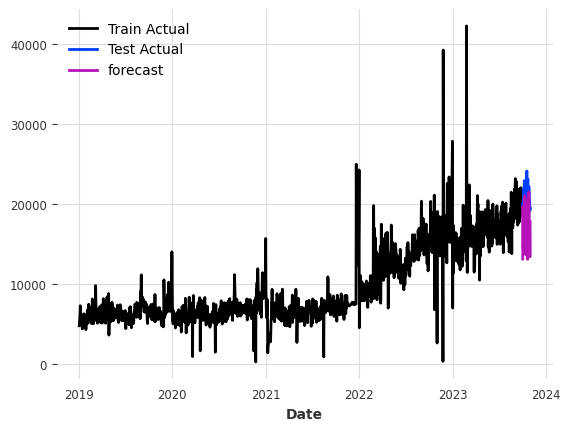

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False


MEAN Validation MAPE = 16.60%
TEST MAPE = 18.30%
Shop = 6
K-Fold Round = 1
MAPE = 28.89%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 40.39%
K-Fold Round = 3
MAPE = 27.77%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 27.80%


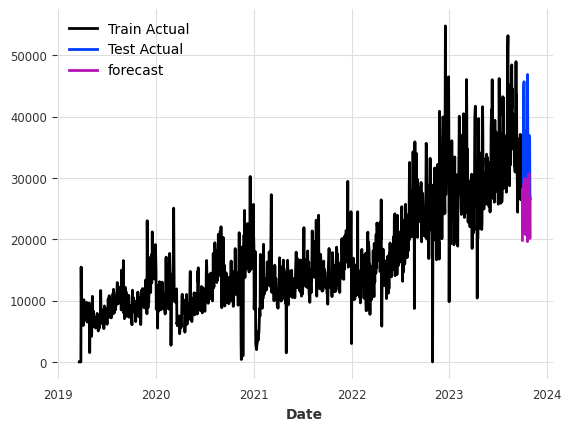

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 31.21%
TEST MAPE = 25.82%
Shop = 10
K-Fold Round = 1
MAPE = 24.55%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 37.10%
K-Fold Round = 3
MAPE = 28.85%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 25.16%


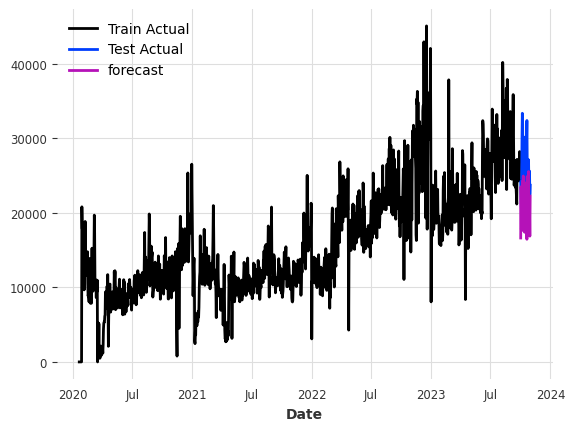

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 28.91%
TEST MAPE = 20.50%
Shop = 11
K-Fold Round = 1
MAPE = 29.04%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 26.14%
K-Fold Round = 3
MAPE = 19.40%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 19.24%


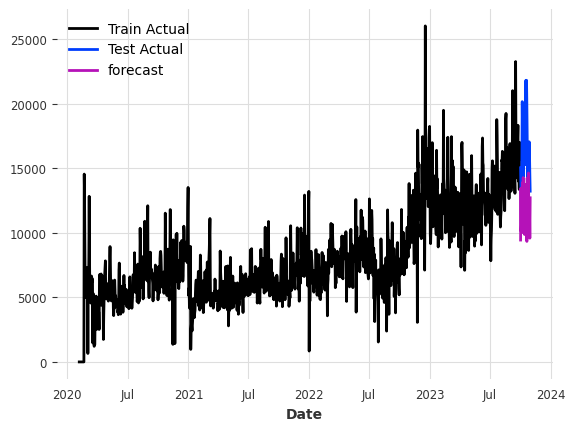

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 23.46%
TEST MAPE = 26.61%
Shop = 13
K-Fold Round = 1
MAPE = 33.67%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 42.60%
K-Fold Round = 3
MAPE = 32.43%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 29.27%


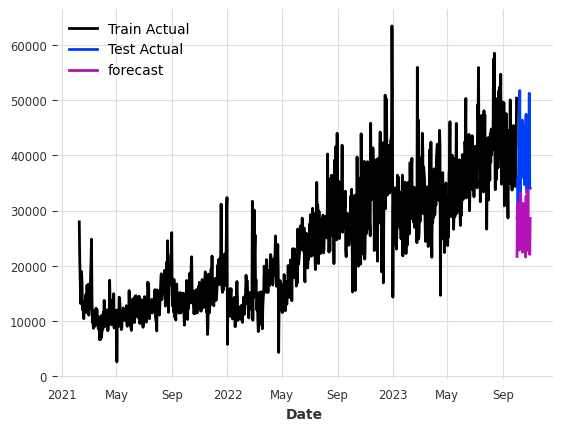

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 34.49%
TEST MAPE = 31.14%
Shop = 15
K-Fold Round = 1
MAPE = 32.68%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False


MAPE = 32.70%
K-Fold Round = 3
MAPE = 26.71%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 29.28%


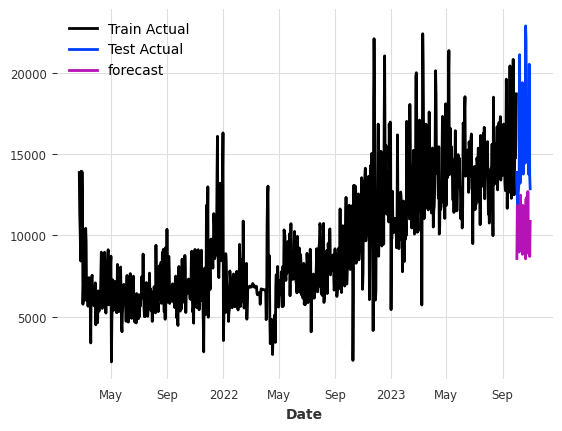

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 30.34%
TEST MAPE = 32.92%
Shop = 18
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 35.99%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 30.90%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 129.65%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 34.50%


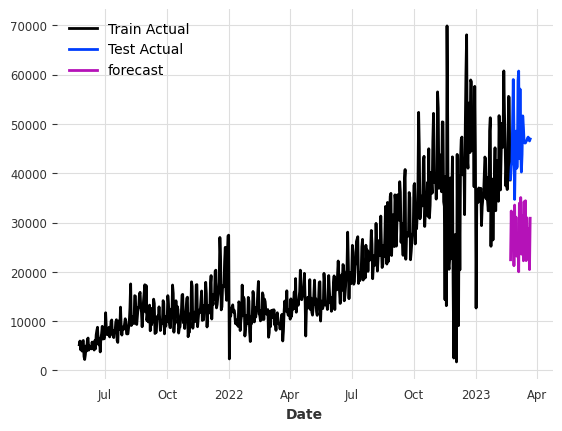

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 57.76%
TEST MAPE = 40.11%
Shop = 20
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 29.60%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 28.52%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 19.16%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 16.01%


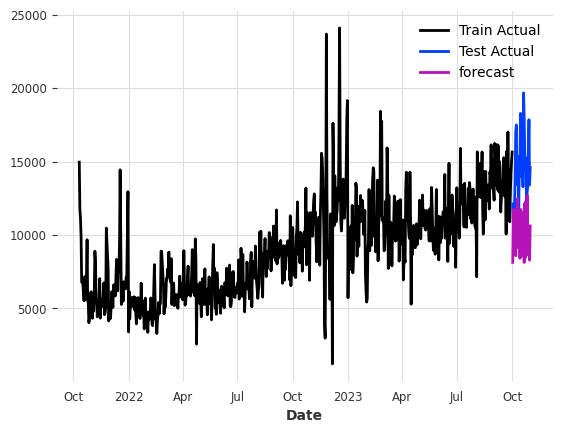

MEAN Validation MAPE = 23.32%
TEST MAPE = 30.73%
Mean TEST MAPE = 28.27%


In [ ]:
validation(model_exog_extended, train, test, scalers, 30, 4, exogs=exogs)

In [ ]:
# Model with exogs provided by Aurora only and EUR currency included
model_exog_base = NBEATSModel(input_chunk_length=28,
                    output_chunk_length=7,
                    n_epochs=15,
                    random_state=42)

In [ ]:
exog_vars = ['Floor', 'EUR', 'Area']
dfs, exogs = transform_df(local_reference=['bazaar'], city_area=['sleeping quarters'], exog_vars=exog_vars)
# check_daily_seasonality(dfs)
scaled_dfs, scalers = scale_dfs(dfs)
train, test = get_train_test(scaled_dfs, 30)

In [ ]:
model_exog_base.fit(series=[df for df in train.values()], past_covariates=[ex for ex in exogs.values()], verbose=True)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 6.9 M  | train
-------------------------------------------------------------
6.9 M     Trainable params
2.0 K     Non-trainable params
6.9 M     Total params
27.566    Total estimated model params size (MB)
396       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.


NBEATSModel(output_chunk_shift=0, generic_architecture=True, num_stacks=30, num_blocks=1, num_layers=4, layer_widths=256, expansion_coefficient_dim=5, trend_polynomial_degree=2, dropout=0.0, activation=ReLU, input_chunk_length=28, output_chunk_length=7, n_epochs=15, random_state=42)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Shop = 1
K-Fold Round = 1
MAPE = 10.51%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.07%
K-Fold Round = 3
MAPE = 13.40%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.19%


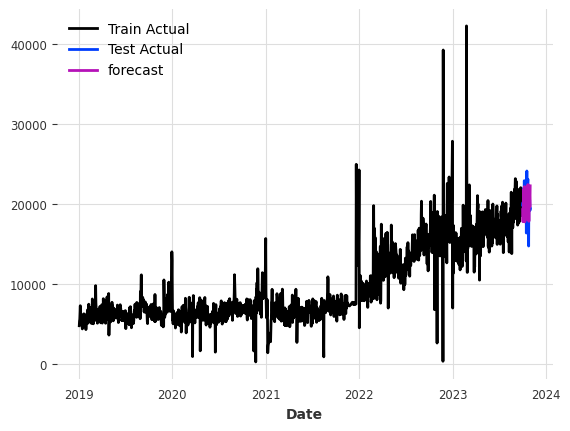

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 11.54%
TEST MAPE = 8.72%
Shop = 6
K-Fold Round = 1
MAPE = 16.74%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.70%
K-Fold Round = 3
MAPE = 15.75%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.47%


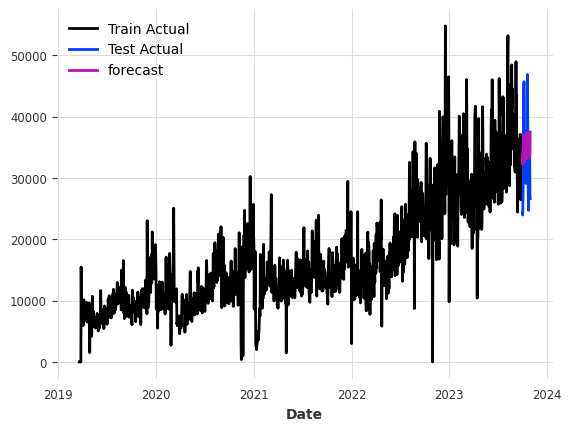

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 14.41%
TEST MAPE = 16.63%
Shop = 10
K-Fold Round = 1
MAPE = 15.94%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.09%
K-Fold Round = 3
MAPE = 9.99%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.38%


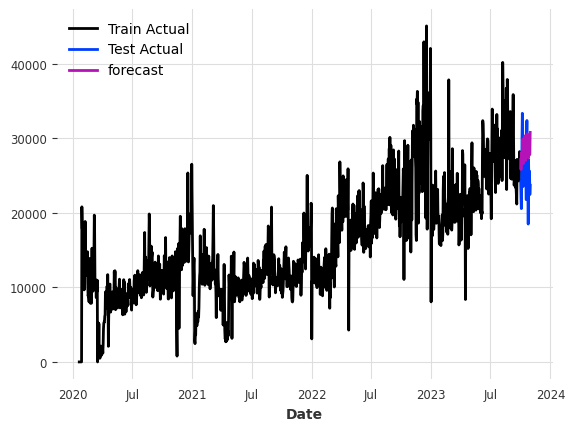

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


MEAN Validation MAPE = 12.10%
TEST MAPE = 15.54%
Shop = 11
K-Fold Round = 1
MAPE = 11.66%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.40%
K-Fold Round = 3
MAPE = 14.27%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.36%


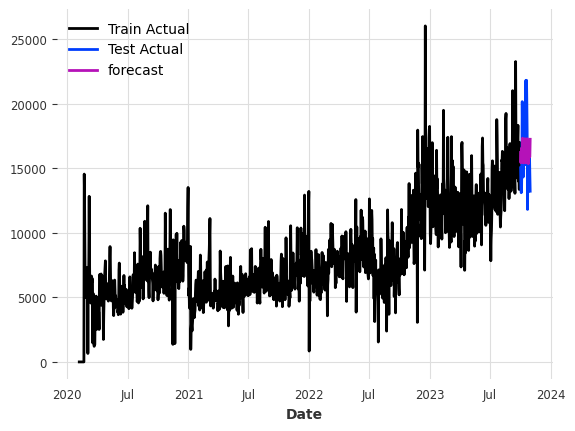

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 12.67%
TEST MAPE = 11.53%
Shop = 13
K-Fold Round = 1
MAPE = 12.30%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 14.21%
K-Fold Round = 3
MAPE = 13.15%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.84%


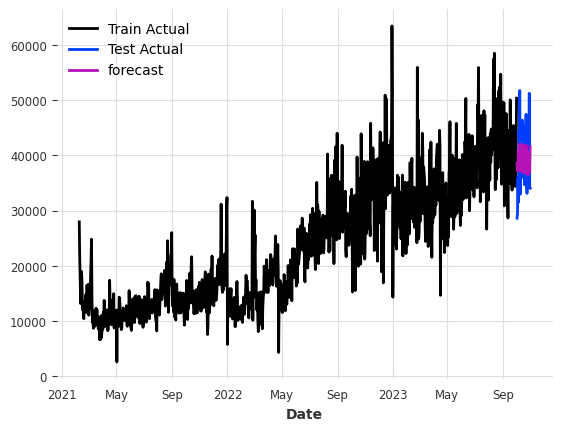

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 12.38%
TEST MAPE = 13.65%
Shop = 15
K-Fold Round = 1
MAPE = 11.88%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.85%
K-Fold Round = 3
MAPE = 9.40%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.77%


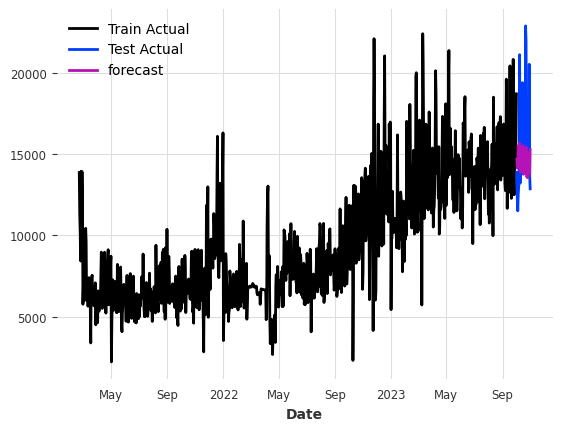

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 10.48%
TEST MAPE = 14.24%
Shop = 18
K-Fold Round = 1
MAPE = 15.67%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 25.25%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 169.52%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 29.05%


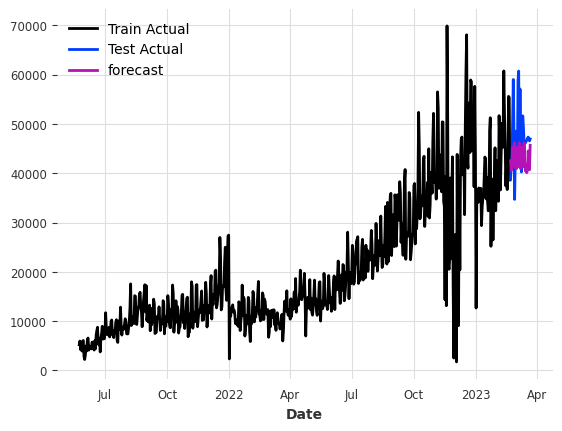

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 59.87%
TEST MAPE = 11.82%
Shop = 20
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.21%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 14.37%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.90%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.87%


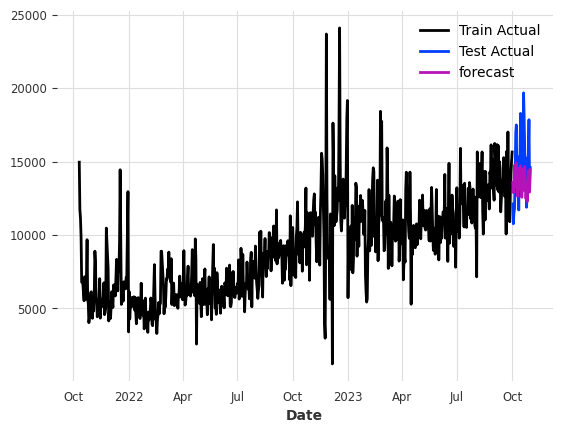

MEAN Validation MAPE = 11.59%
TEST MAPE = 13.27%
Mean TEST MAPE = 13.17%


In [ ]:
validation(model_exog_base, train, test, scalers, 30, 4, exogs=exogs)

In [ ]:
# Extended previous model with calendar exogs
model_exog_base_dates = NBEATSModel(input_chunk_length=28,
                    output_chunk_length=7,
                    n_epochs=15,
                    random_state=42)

In [ ]:
exog_vars = ['Floor', 'EUR', 'Area', 'day', 'week', 'year']
dfs, exogs = transform_df(local_reference=['bazaar'], city_area=['sleeping quarters'], exog_vars=exog_vars)
# check_daily_seasonality(dfs)
scaled_dfs, scalers = scale_dfs(dfs)
train, test = get_train_test(scaled_dfs, 30)

In [ ]:
model_exog_base_dates.fit(series=[df for df in train.values()], past_covariates=[ex for ex in exogs.values()], verbose=True)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 7.6 M  | train
-------------------------------------------------------------
7.6 M     Trainable params
2.5 K     Non-trainable params
7.6 M     Total params
30.222    Total estimated model params size (MB)
396       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.


NBEATSModel(output_chunk_shift=0, generic_architecture=True, num_stacks=30, num_blocks=1, num_layers=4, layer_widths=256, expansion_coefficient_dim=5, trend_polynomial_degree=2, dropout=0.0, activation=ReLU, input_chunk_length=28, output_chunk_length=7, n_epochs=15, random_state=42)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Shop = 1
K-Fold Round = 1
MAPE = 29.78%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 25.55%
K-Fold Round = 3
MAPE = 23.98%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 22.90%


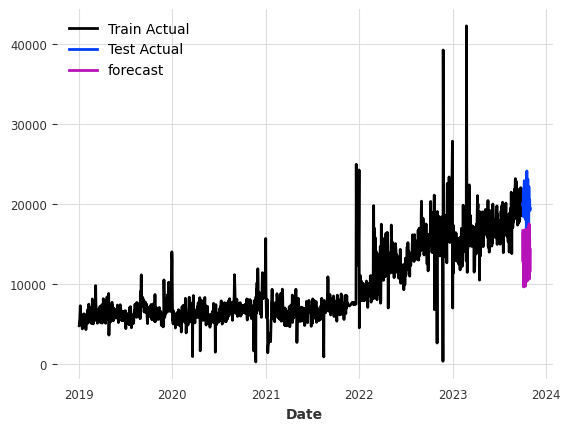

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 25.55%
TEST MAPE = 30.82%
Shop = 6
K-Fold Round = 1
MAPE = 47.11%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 54.92%
K-Fold Round = 3
MAPE = 47.52%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 48.35%


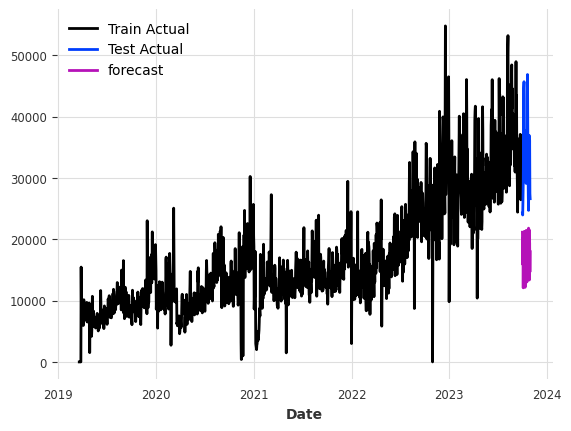

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 49.47%
TEST MAPE = 44.98%
Shop = 10
K-Fold Round = 1
MAPE = 45.41%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


MAPE = 53.85%
K-Fold Round = 3
MAPE = 49.29%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 46.45%


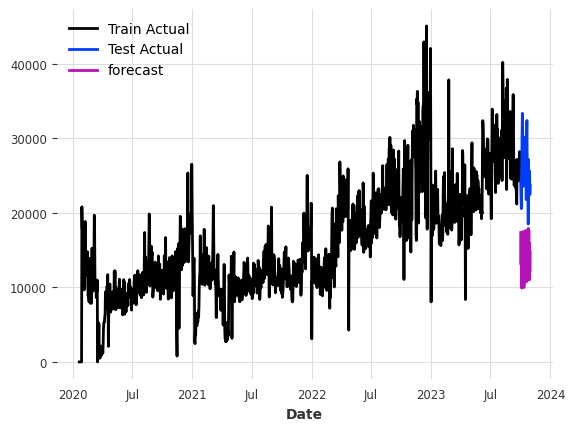

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 48.75%
TEST MAPE = 42.75%
Shop = 11
K-Fold Round = 1
MAPE = 47.63%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 43.51%
K-Fold Round = 3
MAPE = 38.82%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 37.11%


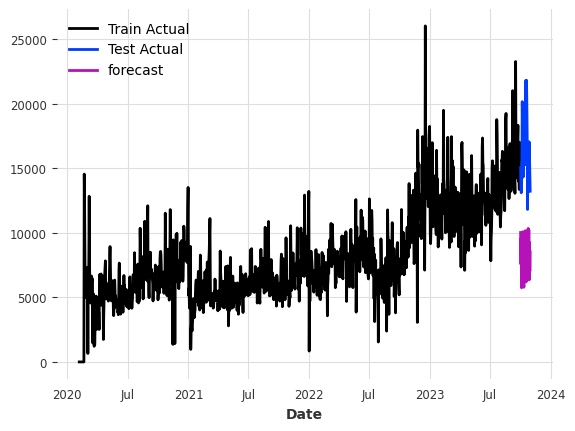

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 41.77%
TEST MAPE = 46.64%
Shop = 13
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 43.06%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 48.94%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 43.45%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 42.48%


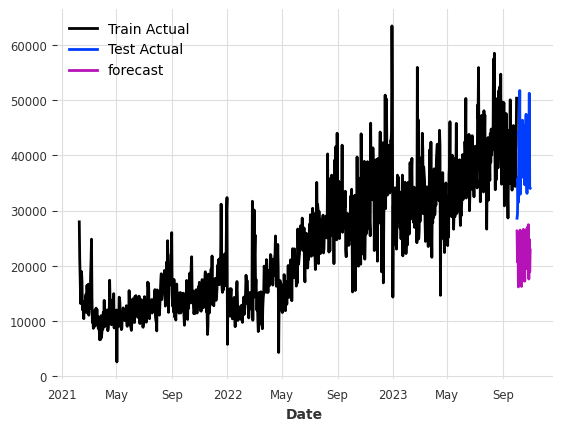

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 44.48%
TEST MAPE = 41.82%
Shop = 15
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 40.04%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 37.84%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 37.22%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 38.22%


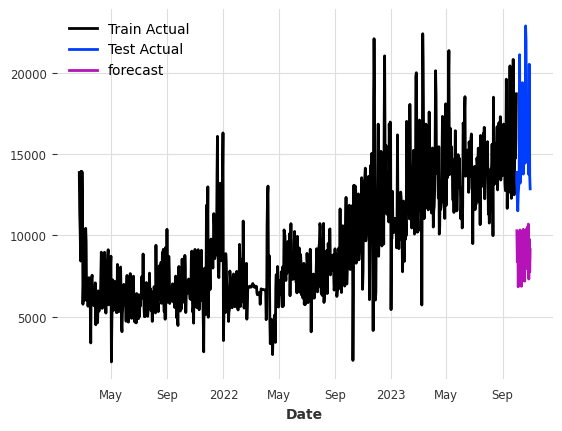

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 38.33%
TEST MAPE = 41.25%
Shop = 18
K-Fold Round = 1
MAPE = 47.28%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 43.11%
K-Fold Round = 3
MAPE = 101.72%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 43.70%


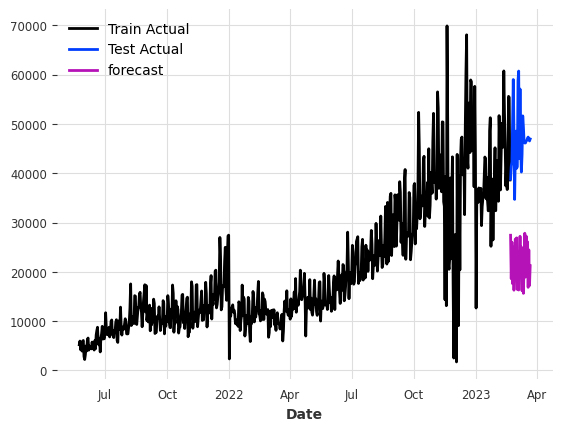

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 58.95%
TEST MAPE = 52.93%
Shop = 20
K-Fold Round = 1
MAPE = 37.18%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 35.68%
K-Fold Round = 3
MAPE = 28.34%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 25.31%


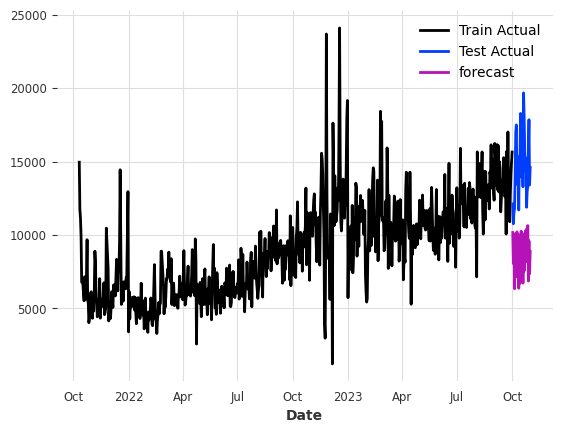

MEAN Validation MAPE = 31.63%
TEST MAPE = 39.24%
Mean TEST MAPE = 42.55%


In [ ]:
validation(model_exog_base_dates, train, test, scalers, 30, 4, exogs=exogs)

In [ ]:
# Extending previous model with USD currency
model_exog_base_dates_USD = NBEATSModel(input_chunk_length=28,
                    output_chunk_length=7,
                    n_epochs=15,
                    random_state=42)

In [ ]:
exog_vars = ['Floor', 'EUR', 'USD', 'Area', 'day', 'week', 'year']
dfs, exogs = transform_df(local_reference=['bazaar'], city_area=['sleeping quarters'], exog_vars=exog_vars)
# check_daily_seasonality(dfs)
scaled_dfs, scalers = scale_dfs(dfs)
train, test = get_train_test(scaled_dfs, 30)

In [ ]:
model_exog_base_dates_USD.fit(series=[df for df in train.values()], past_covariates=[ex for ex in exogs.values()], verbose=True)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 7.8 M  | train
-------------------------------------------------------------
7.8 M     Trainable params
2.6 K     Non-trainable params
7.8 M     Total params
31.107    Total estimated model params size (MB)
396       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=15` reached.


NBEATSModel(output_chunk_shift=0, generic_architecture=True, num_stacks=30, num_blocks=1, num_layers=4, layer_widths=256, expansion_coefficient_dim=5, trend_polynomial_degree=2, dropout=0.0, activation=ReLU, input_chunk_length=28, output_chunk_length=7, n_epochs=15, random_state=42)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Shop = 1
K-Fold Round = 1
MAPE = 13.18%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 18.75%
K-Fold Round = 3
MAPE = 19.86%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 17.39%


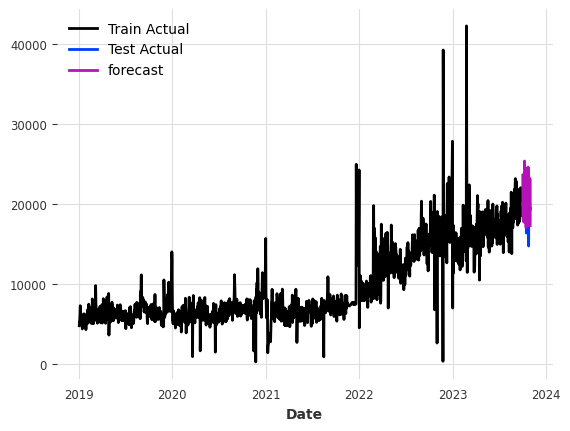

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 17.29%
TEST MAPE = 17.40%
Shop = 6
K-Fold Round = 1
MAPE = 18.15%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 27.66%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 19.41%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 16.52%


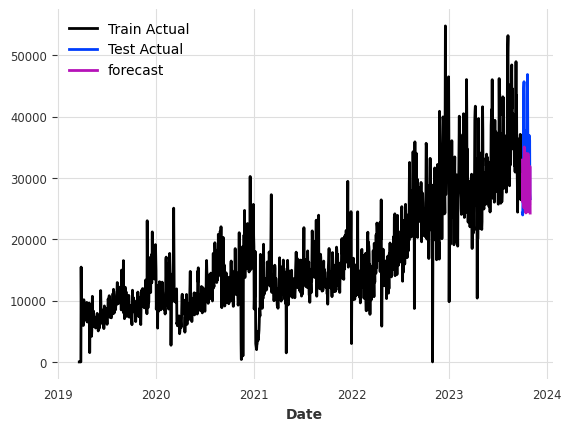

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 20.44%
TEST MAPE = 19.42%
Shop = 10
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.62%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 24.40%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 19.85%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 16.61%


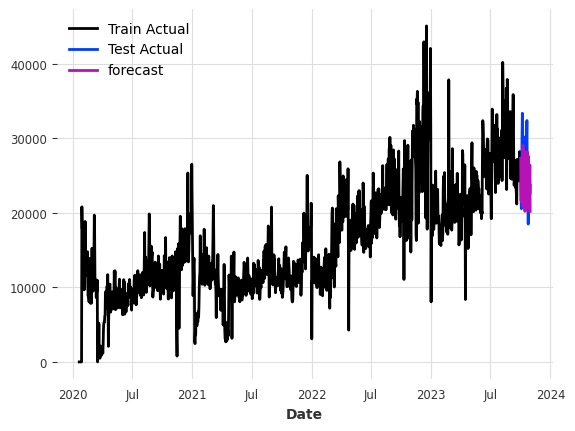

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 18.62%
TEST MAPE = 17.02%
Shop = 11
K-Fold Round = 1
MAPE = 15.76%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 14.68%
K-Fold Round = 3
MAPE = 18.53%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.87%


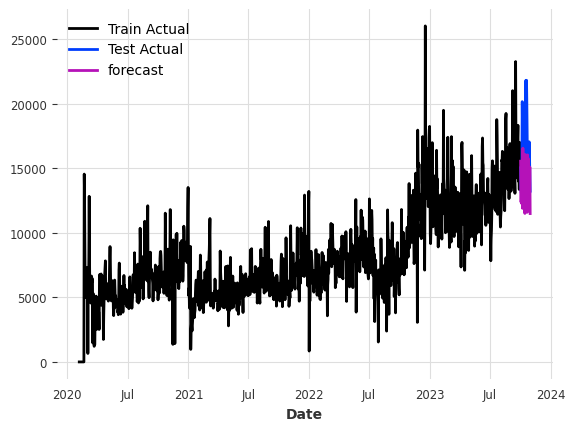

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False


MEAN Validation MAPE = 15.71%
TEST MAPE = 17.28%
Shop = 13
K-Fold Round = 1
MAPE = 19.48%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 26.75%
K-Fold Round = 3
MAPE = 22.63%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 17.14%


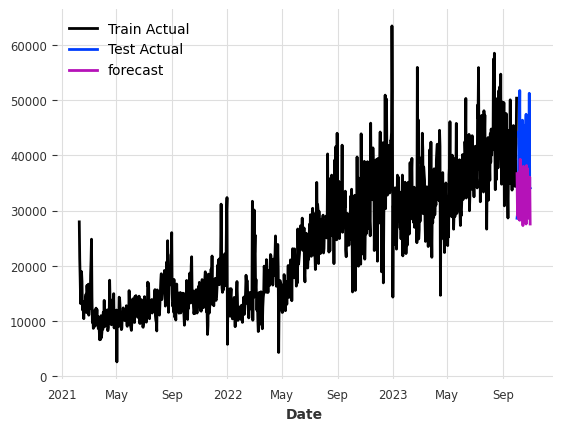

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 21.50%
TEST MAPE = 21.09%
Shop = 15
K-Fold Round = 1
MAPE = 18.96%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 18.03%
K-Fold Round = 3
MAPE = 17.08%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 17.53%


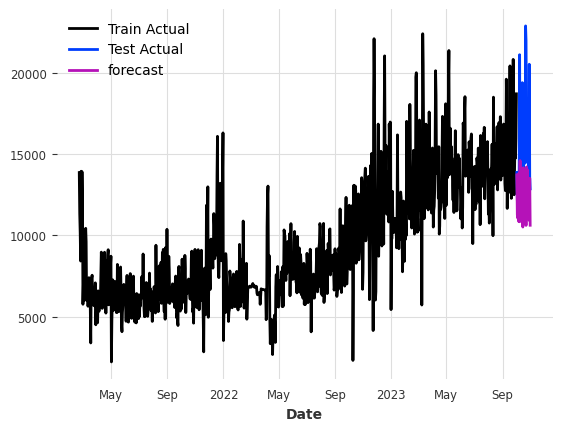

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 17.90%
TEST MAPE = 21.04%
Shop = 18
K-Fold Round = 1
MAPE = 23.29%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 23.37%
K-Fold Round = 3
MAPE = 150.47%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 33.98%


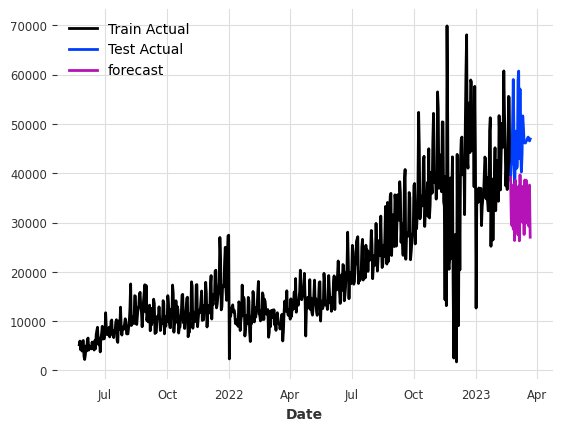

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False


MEAN Validation MAPE = 57.78%
TEST MAPE = 29.28%
Shop = 20
K-Fold Round = 1
MAPE = 17.72%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


MAPE = 19.02%
K-Fold Round = 3
MAPE = 11.06%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 14.87%


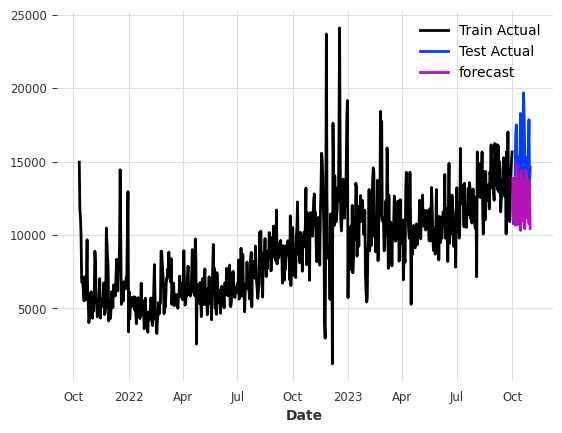

MEAN Validation MAPE = 15.67%
TEST MAPE = 19.79%
Mean TEST MAPE = 20.29%


In [ ]:
validation(model_exog_base_dates_USD, train, test, scalers, 30, 4, exogs=exogs)

In [ ]:
dfs = get_filtered_df(shop=[i for i in range(1, 31)], fill_zero=True)

In [19]:
# find dataframes that have less than a year of data
from pprint import pprint
small_dfs = {}
unique_crossing = {}
for key, tup in dfs.items():
  if tup[0].shape[0] < 300:
    small_dfs[key] = tup
    label = f"{tup[0]['Local_reference'].unique()[0]}-{tup[0]['City area'].unique()[0]}"
    if label not in unique_crossing.keys():
      unique_crossing[label] = []
    unique_crossing[label].append(key)
print('Shops with lack of data')
print(list(small_dfs.keys()))
print('Crossing categories of shops with lack op data')
pprint(unique_crossing)

Shops with lack of data
[22, 26, 25, 27, 28, 29, 30]
Crossing categories of shops with lack op data
{'bazaar-sleeping quarters': [27],
 'centre-centre': [26, 25],
 'supermarket-periphery': [28],
 'supermarket-sleeping quarters': [22, 29, 30]}


In [66]:
def forecast_small_shops_nbeats(small_shops: dict, prediction_steps):
  """
  Forecasting with base model timeseries that having lacking data
  returns trained models
  """
  models = {}
  for key, val in small_shops.items():
    print(f'Forecasting for {val} shops')
    lf, ca = key.split('-')
    print('Local refernce is:', lf)
    print('City area is:', ca)

    # Generating datasets
    dfs = transform_df(local_reference=[lf], city_area=[ca])
    scaled_dfs, scalers = scale_dfs(dfs)
    train, test = get_train_test(scaled_dfs, 30)

    # Defining model
    model = NBEATSModel(input_chunk_length=21,
                        output_chunk_length=7,
                        n_epochs=10,
                        random_state=42)

    # Fitting model
    model.fit(series=[x for x in train.values()], verbose=True)

    # Validation
    validation(model, train, test, scalers, test_pivot=30, k=4)

    # Small data shops prediction
    for shop in val:
      print(f'Predicting shop № {shop}')
      df = transform_df(shop=[shop], only_year=False)
      scaled_df, scaler = scale_dfs(df)
      prediction = model.predict(n=prediction_steps, series=scaled_df[shop],
                                 show_warnings=False, verbose=False)

      # Plotting results
      df[shop].plot(label='Actual')
      pred_inversed = scaler[shop].inverse_transform(prediction)
      pred_inversed.plot(label='30-days Prediciton')
      plt.show()

      df[shop][-30:].plot(label='Actual')
      pred_inversed = scaler[shop].inverse_transform(prediction)
      pred_inversed.plot(label='30-days Prediciton')
      plt.show()

    del df
    del lf
    del ca

    # Saving model
    models[key] = model
  return models

Forecasting for [22, 29, 30] shops
Local refernce is: supermarket
City area is: sleeping quarters
Shops in such category: 4 8 16 23 24 22 29 30
Best method for shop 0 is rolling_median with RMSE: 2204.1952131843946


<ipython-input-11-3d69423384f8>:43: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['Sales'] = df['Sales'].fillna(rolling_mean).infer_objects(copy=False)
<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:183: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='bfill')
<ipython-input-13-8fa0d4602cf3>:188: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill(

Best method for shop 0 is backward with RMSE: 2453.84
Best method for shop 0 is rolling_median with RMSE: 219.0550000000003
Best method for shop 0 is backward with RMSE: 1420.9599999999991


<ipython-input-11-3d69423384f8>:51: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:51: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='bfill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Running validation...
Shop = 4
K-Fold Round = 1
MAPE = 14.22%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.38%
K-Fold Round = 3
MAPE = 18.83%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.18%


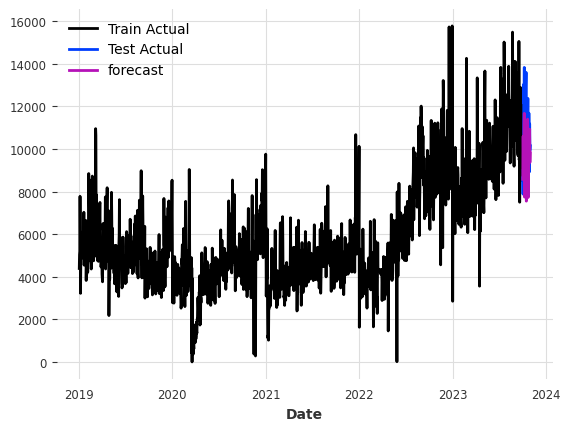

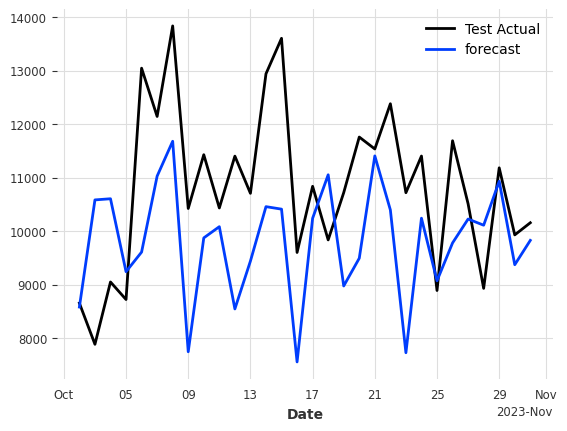

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 14.65%
TEST MAPE = 13.57%
Shop = 8
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 8.81%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 8.97%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.80%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.05%


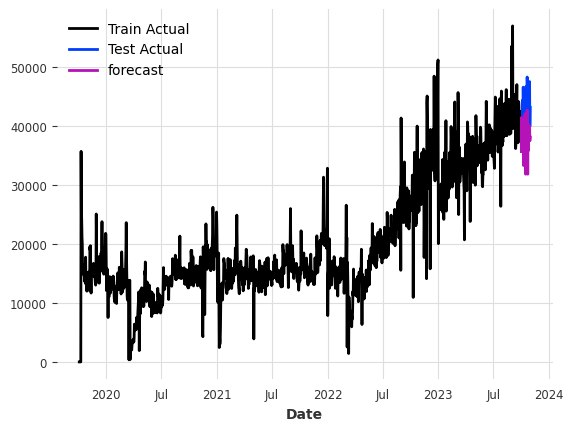

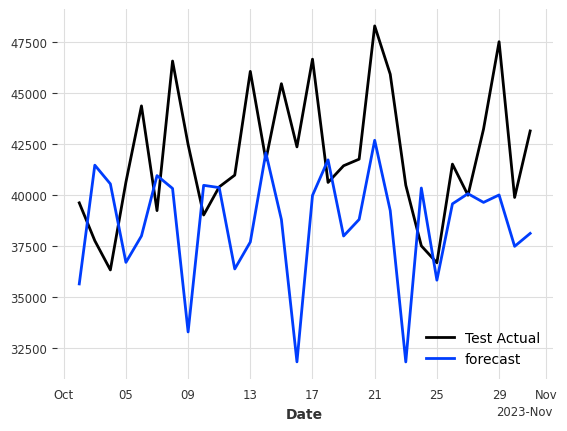

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 9.41%
TEST MAPE = 10.16%
Shop = 16
K-Fold Round = 1
MAPE = 10.53%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


MAPE = 12.44%
K-Fold Round = 3
MAPE = 16.18%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.67%


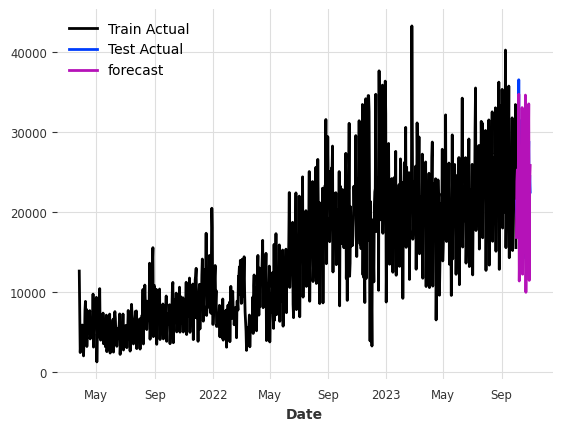

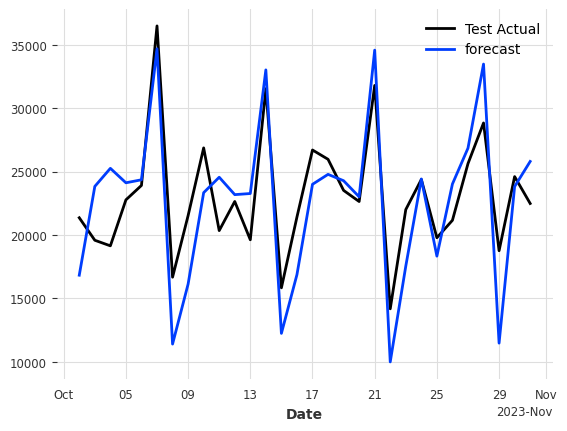

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 12.95%
TEST MAPE = 14.16%
Shop = 23
K-Fold Round = 1
MAPE = 10.83%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False


MAPE = 10.36%
K-Fold Round = 3
MAPE = 8.85%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.72%


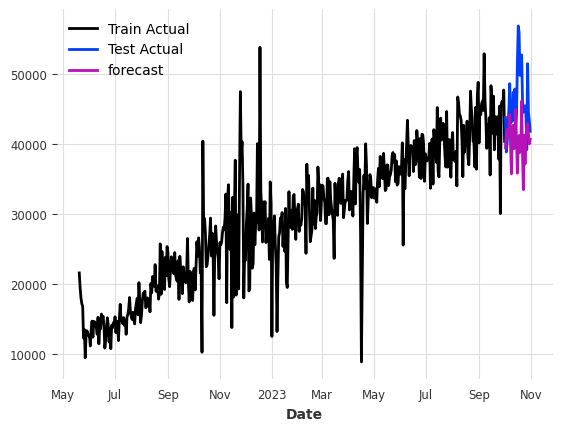

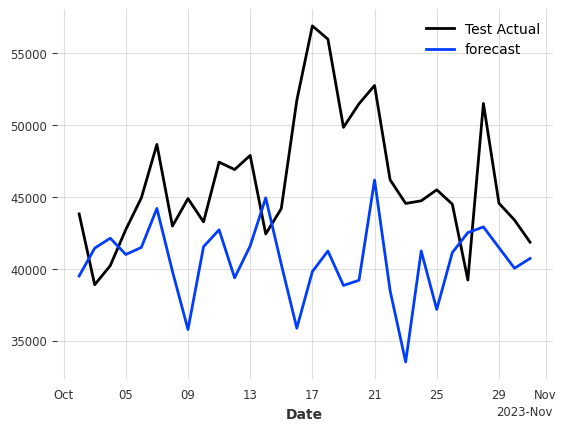

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 9.94%
TEST MAPE = 13.03%
Shop = 24
K-Fold Round = 1
MAPE = 12.45%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 15.63%
K-Fold Round = 3
MAPE = 13.61%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.07%


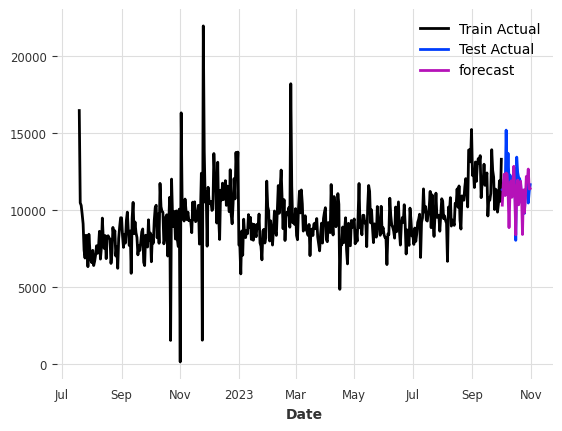

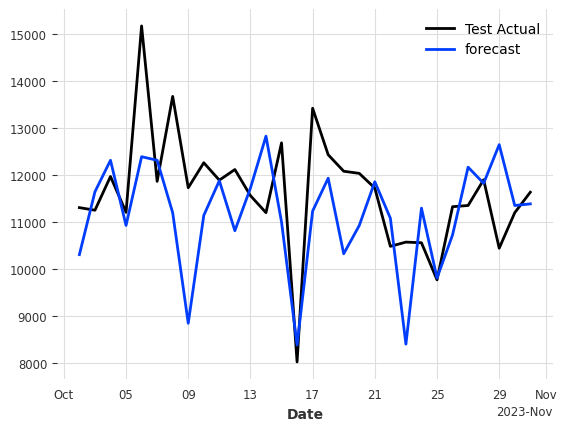

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 12.69%
TEST MAPE = 8.43%
Shop = 22
K-Fold Round = 1
MAPE = 11.58%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 7.09%
K-Fold Round = 3
MAPE = 9.05%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 7.11%


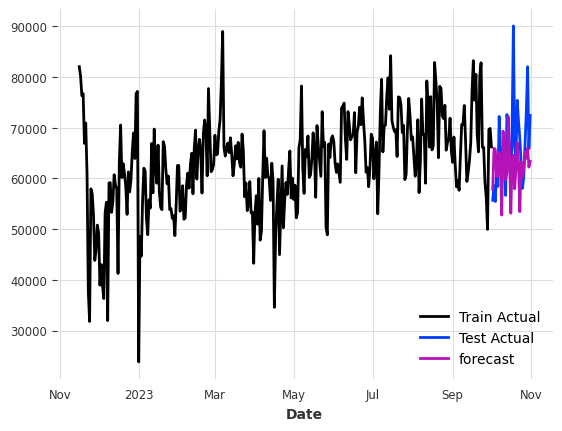

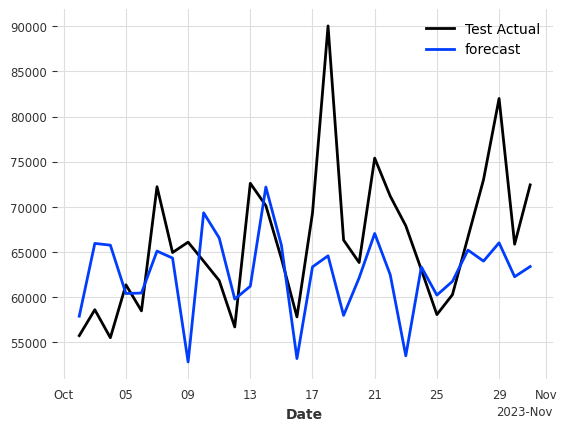

<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:183: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='bfill')
<ipython-input-13-8fa0d4602cf3>:188: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


MEAN Validation MAPE = 8.71%
TEST MAPE = 9.23%
Mean TEST MAPE = 11.43%
Predicting shop № 22
Shops in such category: 22


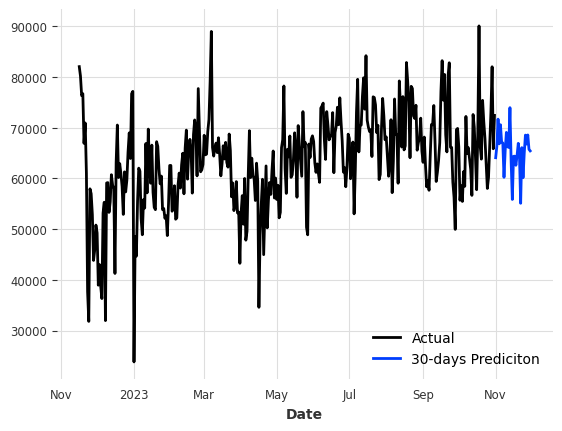

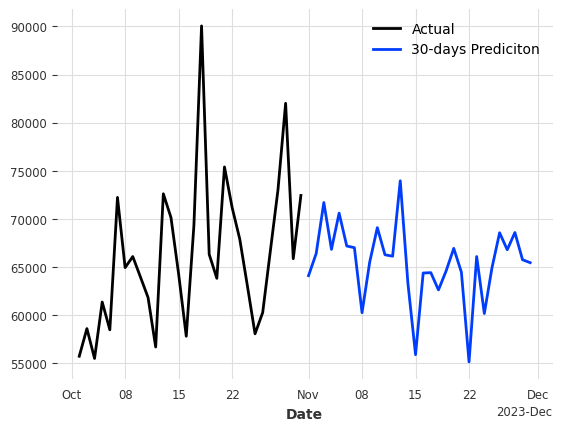

<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:183: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='bfill')
<ipython-input-13-8fa0d4602cf3>:188: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


Predicting shop № 29
Shops in such category: 29


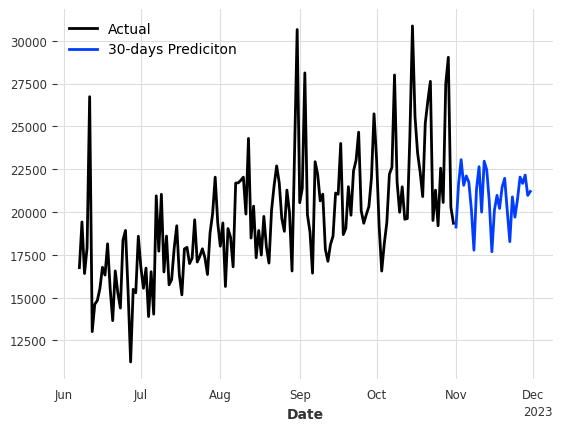

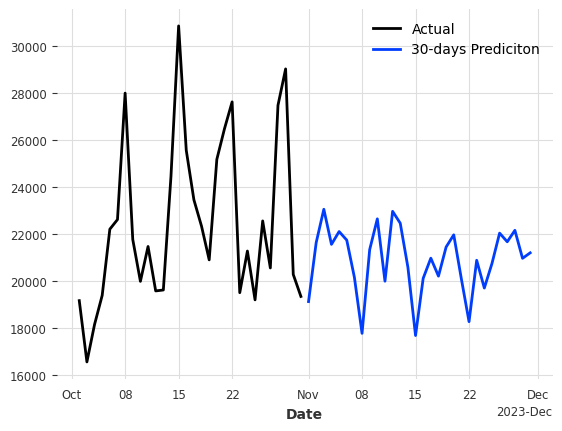

<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:183: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='bfill')
<ipython-input-13-8fa0d4602cf3>:188: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


Predicting shop № 30
Shops in such category: 30


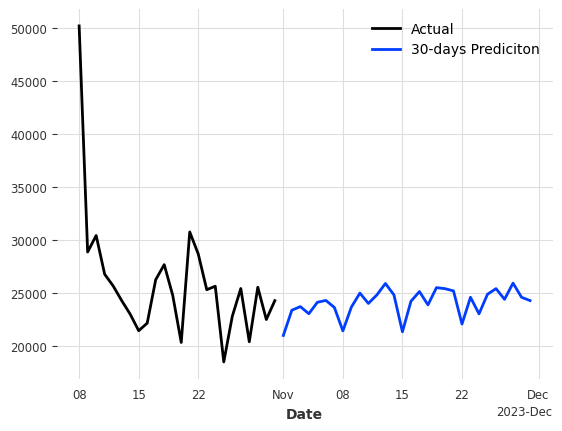

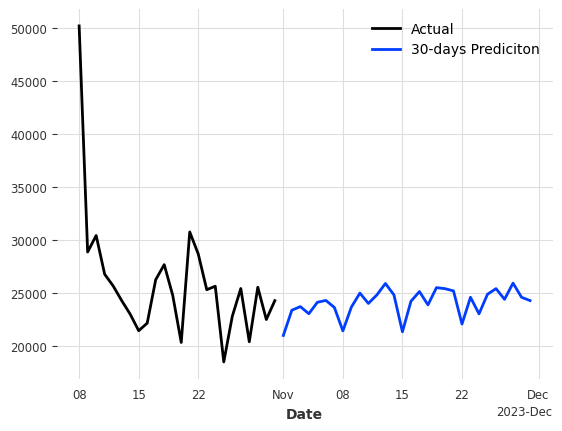

Forecasting for [26, 25] shops
Local refernce is: centre
City area is: centre
Shops in such category: 26 25
Best method for shop 0 is rolling_mean with RMSE: 1821.8647598736836


<ipython-input-11-3d69423384f8>:51: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:51: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='bfill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Running validation...
Shop = 26
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 8.92%
K-Fold Round = 2
MAPE = 14.04%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.24%
K-Fold Round = 4
MAPE = 10.73%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


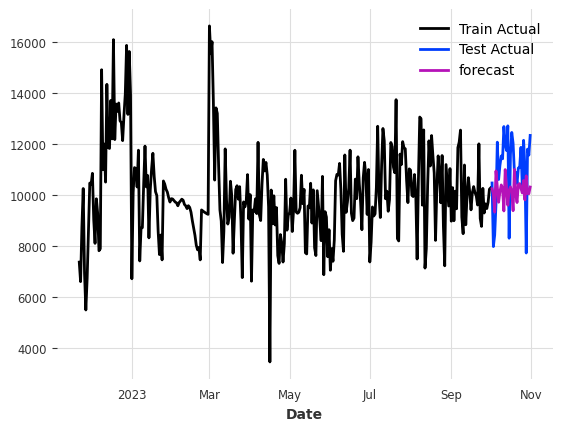

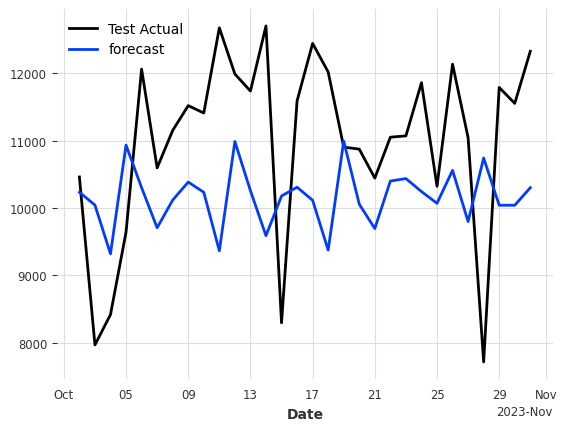

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 10.98%
TEST MAPE = 13.39%
Shop = 25
K-Fold Round = 1
MAPE = 8.08%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.98%
K-Fold Round = 3
MAPE = 10.80%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.79%


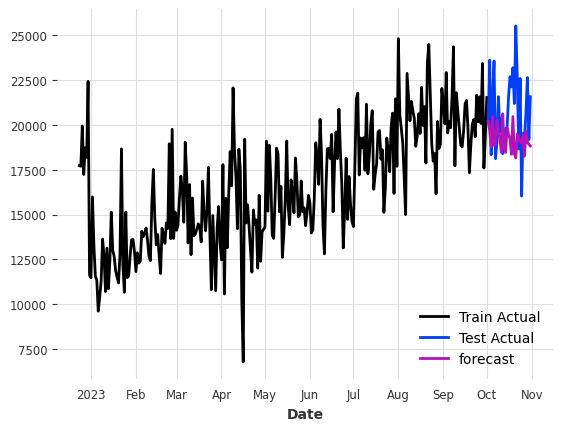

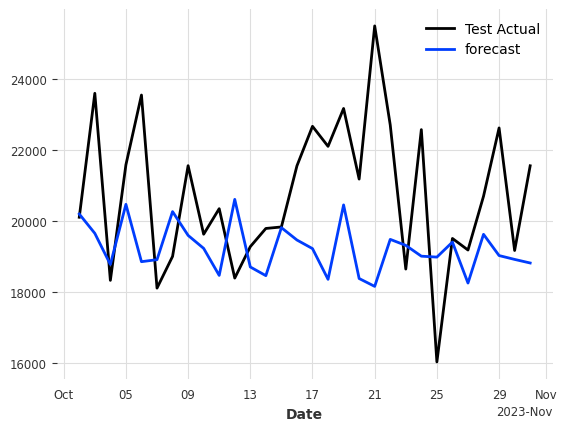

<ipython-input-11-3d69423384f8>:51: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:51: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='bfill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-

MEAN Validation MAPE = 10.41%
TEST MAPE = 9.55%
Mean TEST MAPE = 11.47%
Predicting shop № 26
Shops in such category: 26
Best method for shop 0 is rolling_mean with RMSE: 1821.8647598736836


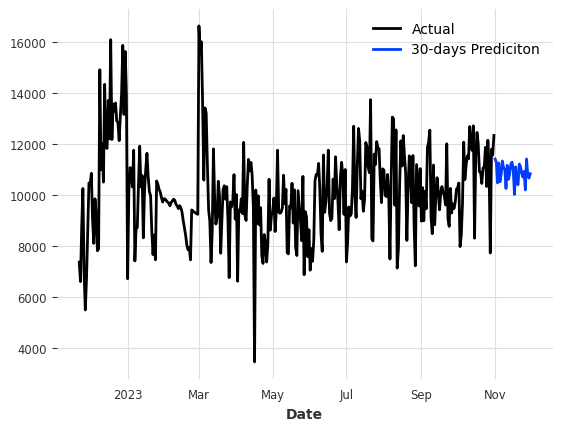

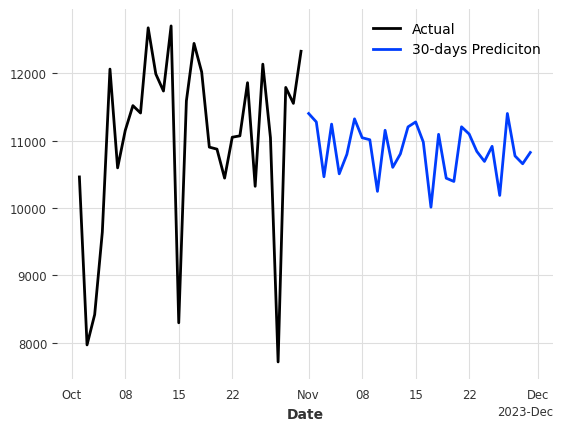

<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:183: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='bfill')
<ipython-input-13-8fa0d4602cf3>:188: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


Predicting shop № 25
Shops in such category: 25


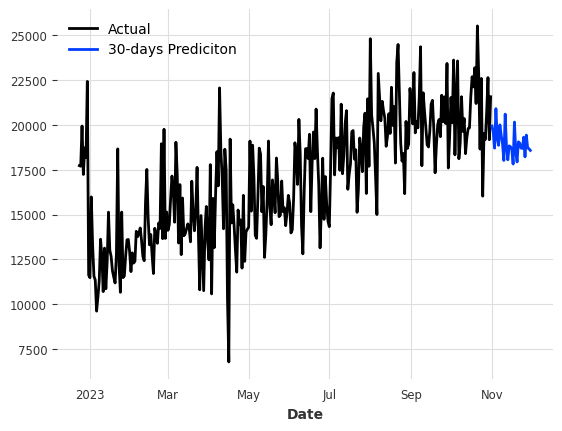

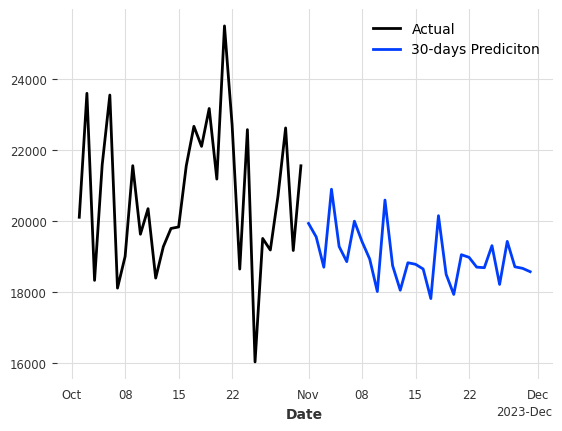

Forecasting for [27] shops
Local refernce is: bazaar
City area is: sleeping quarters
Shops in such category: 1 6 10 11 13 15 18 20 27
Best method for shop 0 is rolling_mean with RMSE: 815.7065143273542


<ipython-input-11-3d69423384f8>:51: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:51: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='bfill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-

Best method for shop 0 is rolling_mean with RMSE: 1188.3803960929902
Best method for shop 0 is rolling_mean with RMSE: 7476.735169669897


<ipython-input-11-3d69423384f8>:51: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:51: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='bfill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-

Best method for shop 0 is backward with RMSE: 45.340000000000146


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 6.2 M  | train
-------------------------------------------------------------
6.2 M     Trainable params
1.4 K     Non-trainable params
6.2 M     Total params
24.690    Total estimated model params size (MB)
396       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Running validation...
Shop = 1
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.68%
K-Fold Round = 2
MAPE = 12.91%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 8.98%
K-Fold Round = 4
MAPE = 9.23%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


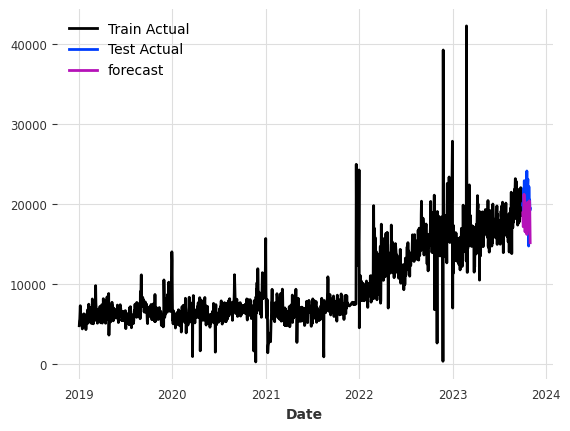

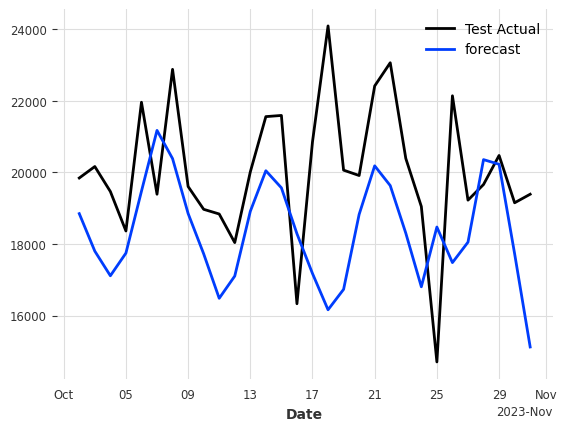

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 10.70%
TEST MAPE = 11.06%
Shop = 6
K-Fold Round = 1
MAPE = 10.77%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 25.06%
K-Fold Round = 3
MAPE = 12.15%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 16.27%


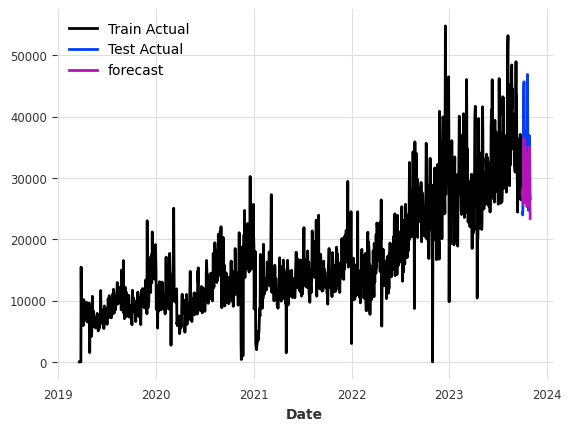

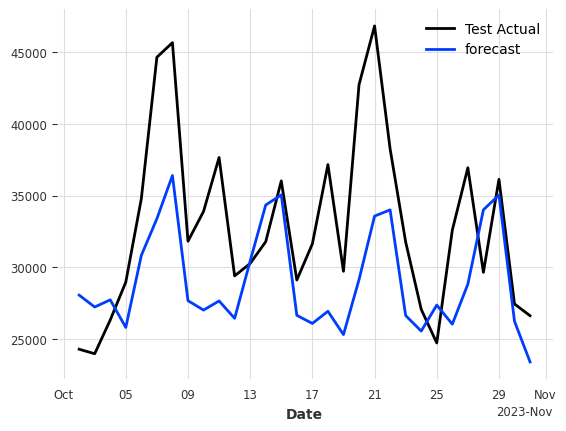

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 16.06%
TEST MAPE = 14.42%
Shop = 10
K-Fold Round = 1
MAPE = 8.19%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 19.08%
K-Fold Round = 3
MAPE = 13.52%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 21.14%


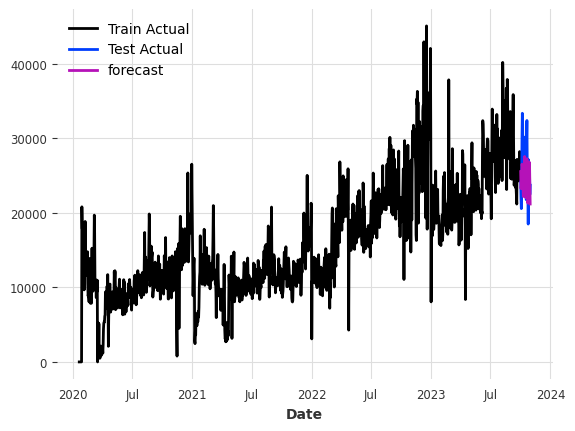

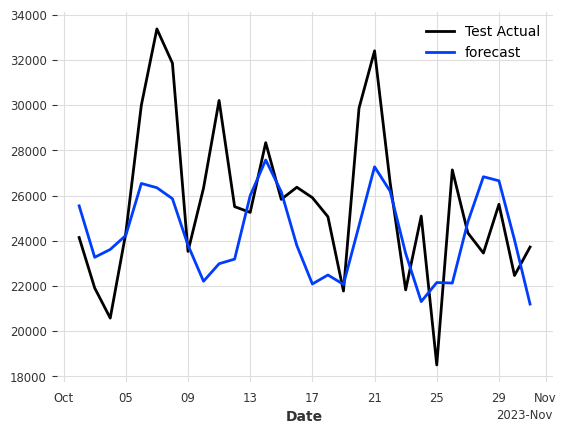

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 15.48%
TEST MAPE = 10.17%
Shop = 11
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 14.63%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 16.14%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 18.11%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.27%


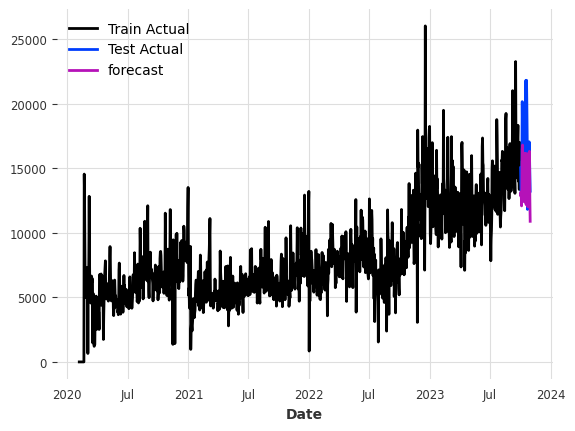

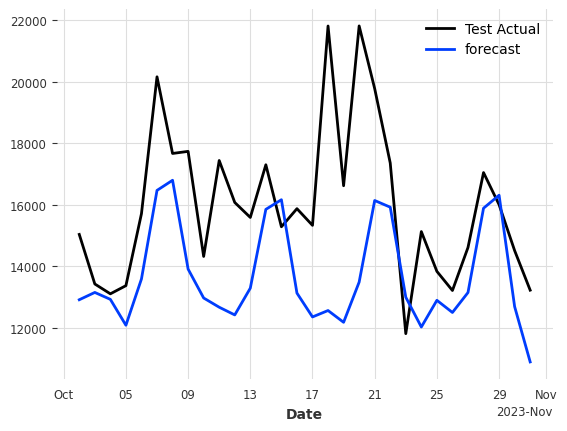

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 15.54%
TEST MAPE = 14.54%
Shop = 13
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.52%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 20.16%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.67%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 14.47%


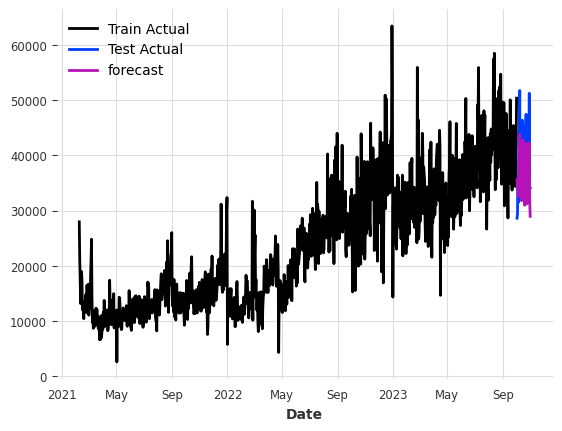

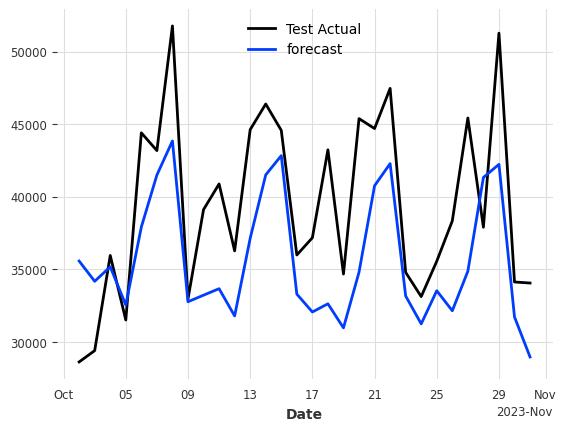

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 14.46%
TEST MAPE = 12.02%
Shop = 15
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.89%
K-Fold Round = 2
MAPE = 13.89%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.46%
K-Fold Round = 4
MAPE = 13.96%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


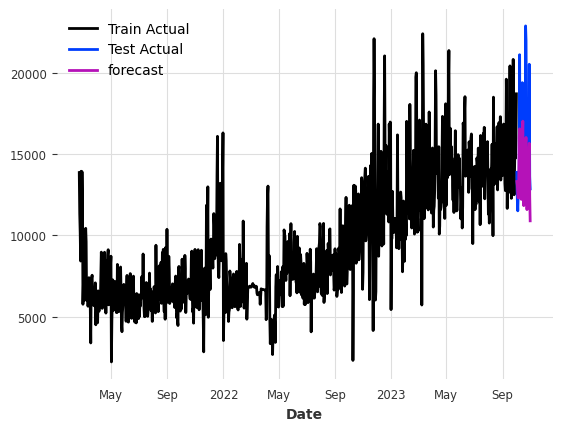

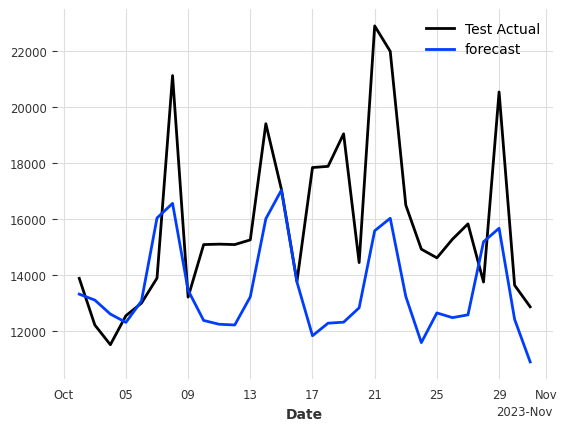

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 12.55%
TEST MAPE = 15.75%
Shop = 18
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 18.67%
K-Fold Round = 2
MAPE = 17.04%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 29.16%
K-Fold Round = 4
MAPE = 25.18%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


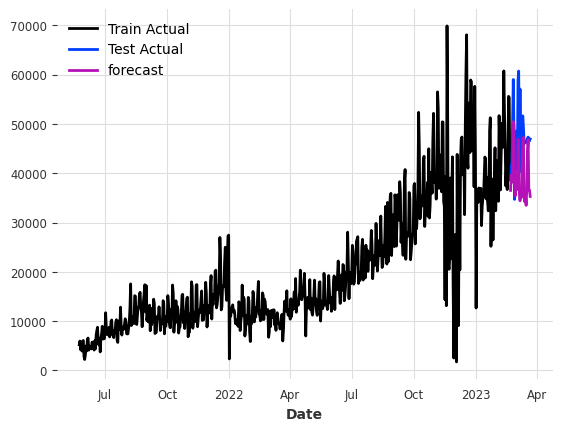

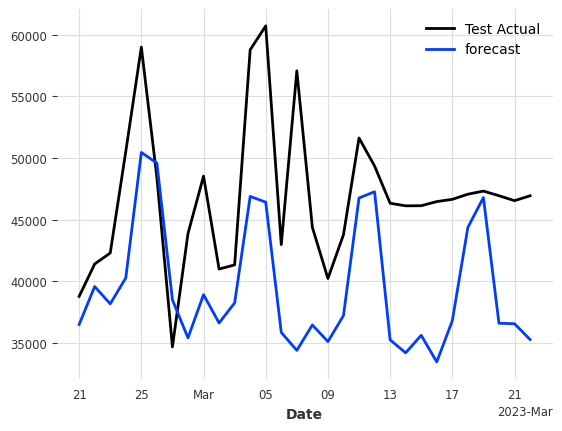

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 22.51%
TEST MAPE = 16.04%
Shop = 20
K-Fold Round = 1
MAPE = 13.05%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 20.61%
K-Fold Round = 3
MAPE = 11.07%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.00%


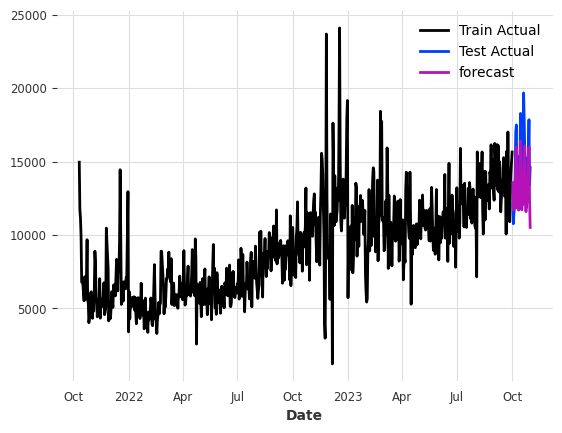

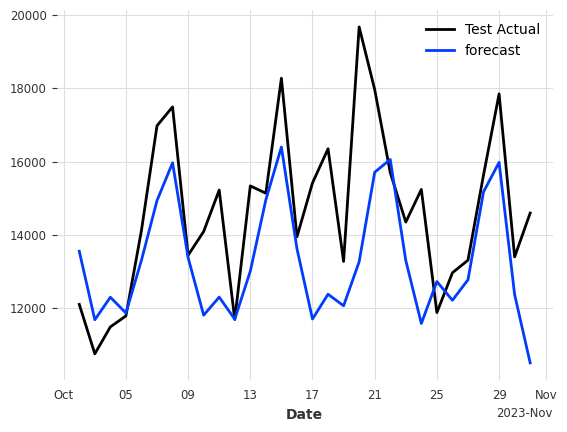

<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:183: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='bfill')
<ipython-input-13-8fa0d4602cf3>:188: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


MEAN Validation MAPE = 13.68%
TEST MAPE = 10.72%
Mean TEST MAPE = 13.09%
Predicting shop № 27
Shops in such category: 27


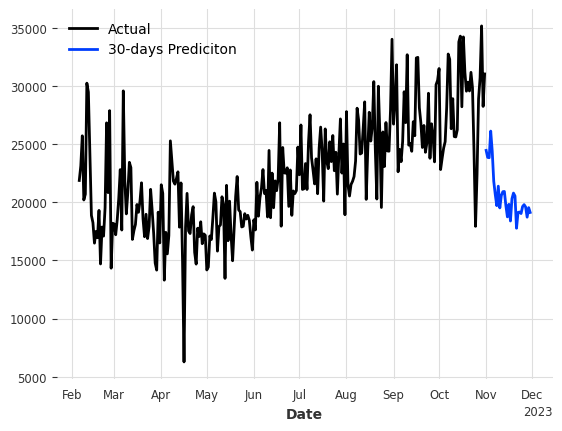

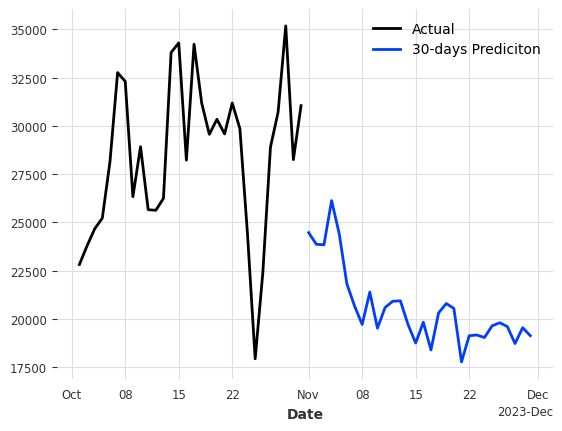

Forecasting for [28] shops
Local refernce is: supermarket
City area is: periphery
Shops in such category: 2 5 28
Best method for shop 0 is rolling_median with RMSE: 772.0161021528842


<ipython-input-11-3d69423384f8>:51: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:51: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  temp = test_df.copy().fillna(method='ffill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  temp = test_df.copy().fillna(method='bfill')
<ipython-input-11-3d69423384f8>:54: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Running validation...
Shop = 2
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 14.10%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.44%
K-Fold Round = 3
MAPE = 10.78%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 15.08%


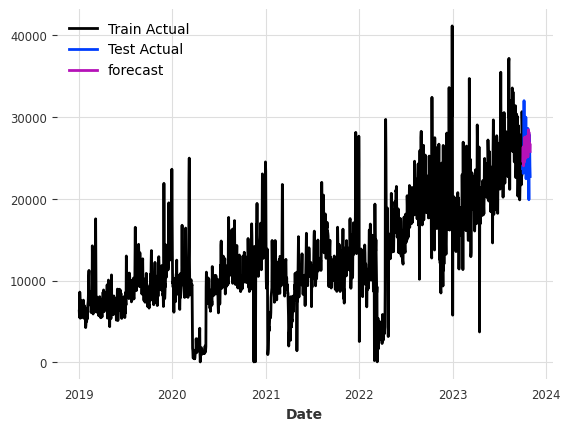

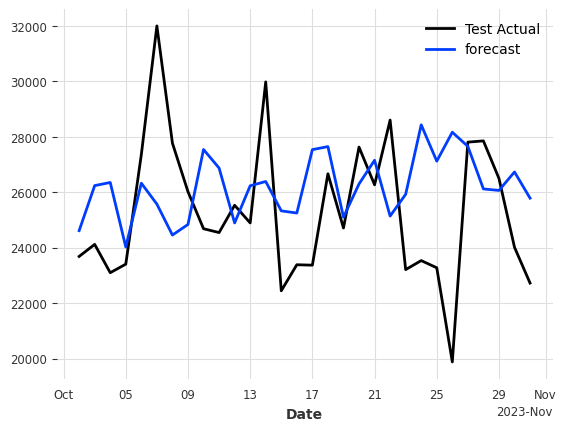

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 12.85%
TEST MAPE = 9.96%
Shop = 5
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 20.33%
K-Fold Round = 2
MAPE = 15.60%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.54%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.19%


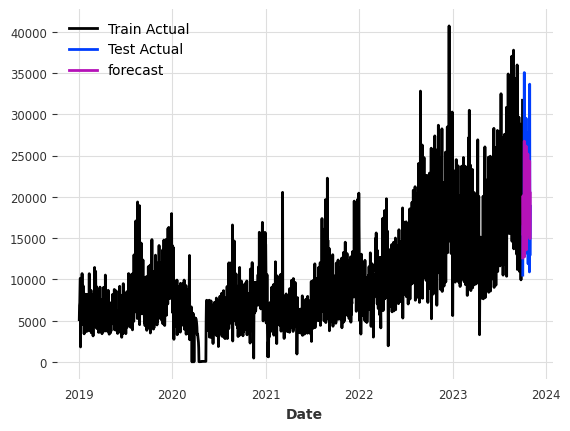

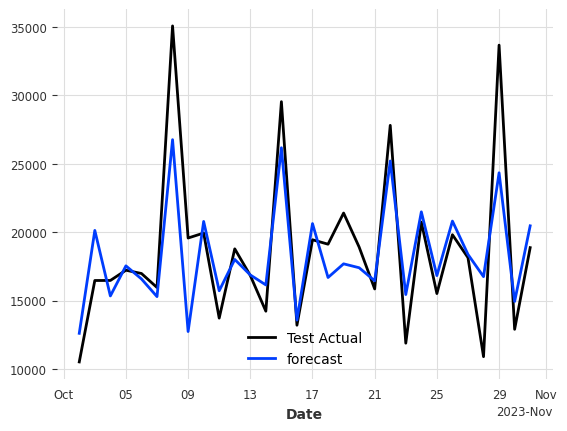

<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:182: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  inter_df['Sales'] = inter_df['Sales'].fillna(method='ffill')
<ipython-input-13-8fa0d4602cf3>:183: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  inter_df['Sales'] = inter_df['Sales'].fillna(method='bfill')
<ipython-input-13-8fa0d4602cf3>:188: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.


MEAN Validation MAPE = 15.42%
TEST MAPE = 12.60%
Mean TEST MAPE = 11.28%
Predicting shop № 28
Shops in such category: 28


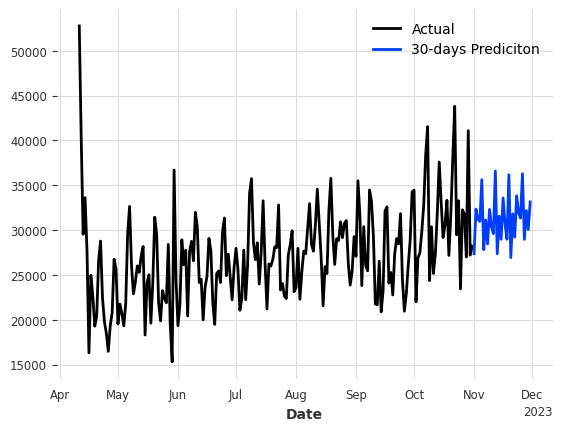

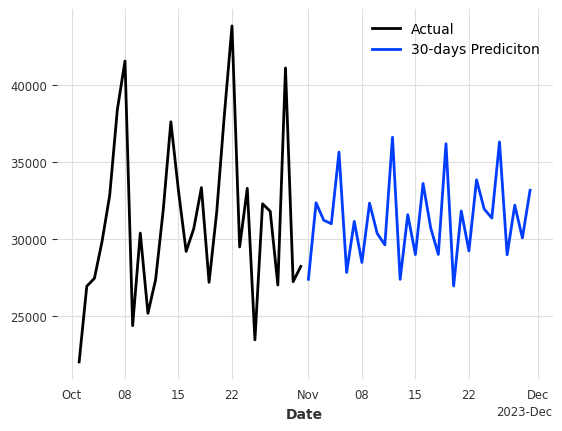

In [67]:
trained_models = forecast_small_shops_nbeats(unique_crossing, 30)

In [ ]:
# Predicting all shops inside categories

In [ ]:
dfs = get_filtered_df(shop=[i for i in range(1, 31)], fill_zero=True)

In [71]:
# Forecasting shops that have enough data in categories crossing
from pprint import pprint
category_crossings = {}
for key, tup in dfs.items():
  if tup[0].shape[0] > 300:
    label = f"{tup[0]['Local_reference'].unique()[0]}-{tup[0]['City area'].unique()[0]}"
    if label not in category_crossings.keys():
      category_crossings[label] = []
    category_crossings[label].append(key)
pprint(category_crossings)

{'administrative institution-centre': [3, 7],
 'bazaar-centre': [9, 12, 13, 19, 21],
 'bazaar-sleeping quarters': [1, 6, 10, 11, 15, 18, 20],
 'centre-centre': [26, 25],
 'educational institution-sleeping quarters': [14],
 'railway station-centre': [17],
 'supermarket-periphery': [2, 5],
 'supermarket-sleeping quarters': [4, 8, 16, 23, 24, 22]}


In [ ]:
dfs = transform_df(shop=[i for i in range(1, 31)], fill_zero=True)
scaled_dfs, scalers = scale_dfs(dfs)
train, test = get_train_test(scaled_dfs, 30)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 6.2 M  | train
-------------------------------------------------------------
6.2 M     Trainable params
1.4 K     Non-trainable params
6.2 M     Total params
24.690    Total estimated model params size (MB)
396       Modules in train mode
0         Modules in eval mode


Forecasting for [1, 6, 10, 11, 15, 18, 20] shops
Local refernce is: bazaar
City area is: sleeping quarters


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Running validation...
Shop = 1
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.07%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 8.86%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.34%
K-Fold Round = 4
MAPE = 12.25%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


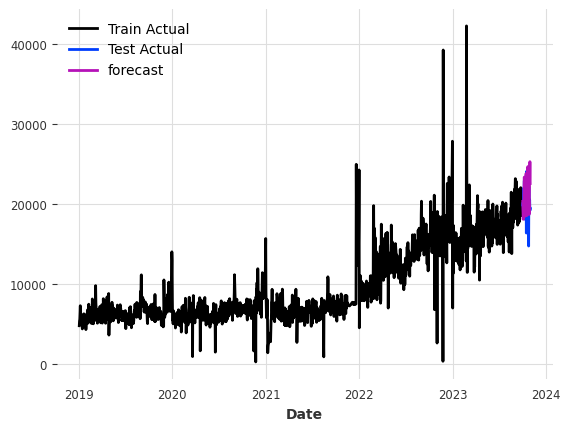

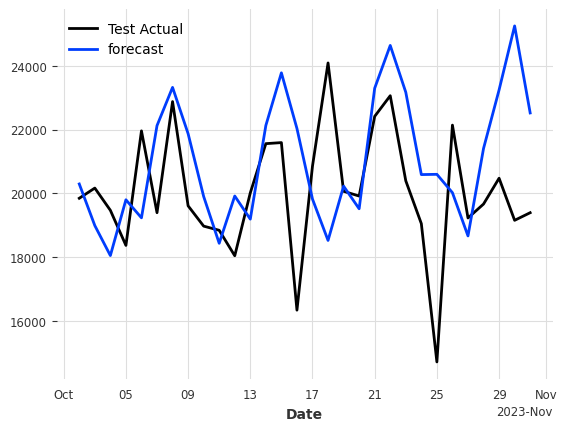

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 10.88%
TEST MAPE = 10.63%
Shop = 6
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.80%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 16.78%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.72%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.99%


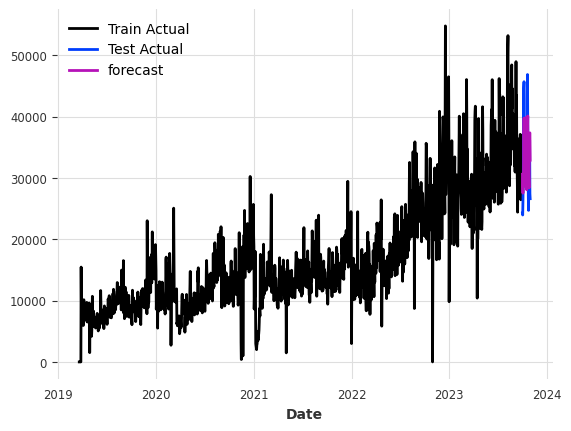

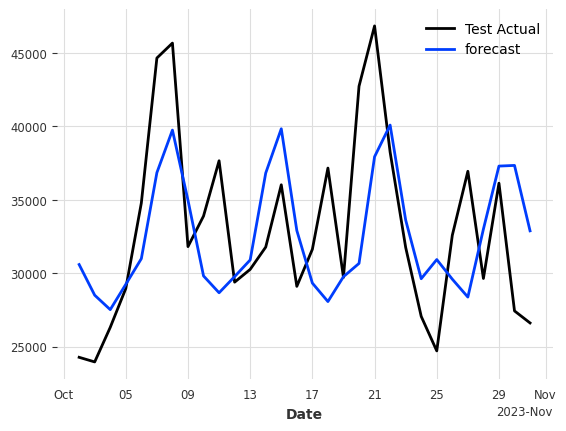

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 13.83%
TEST MAPE = 13.74%
Shop = 10
K-Fold Round = 1
MAPE = 11.68%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.14%
K-Fold Round = 3
MAPE = 12.03%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.47%


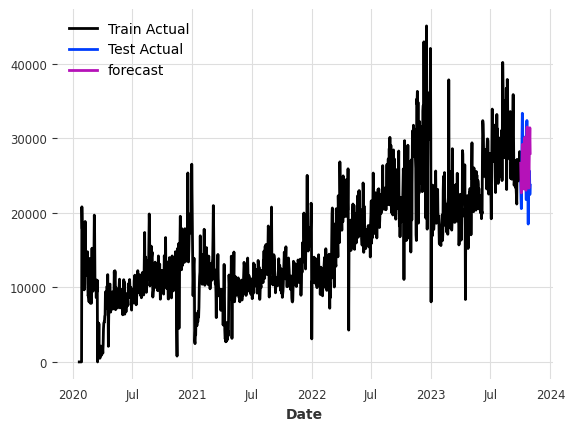

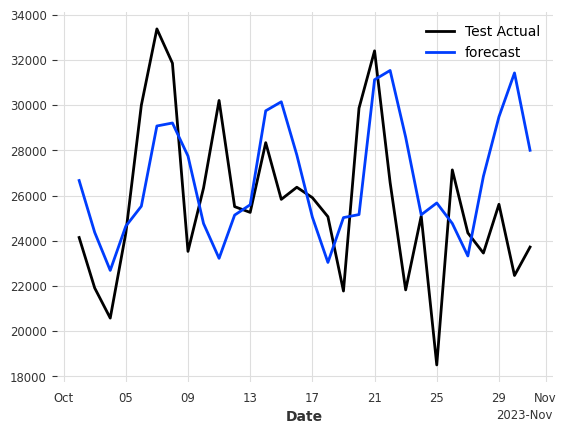

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


MEAN Validation MAPE = 12.58%
TEST MAPE = 12.71%
Shop = 11
K-Fold Round = 1
MAPE = 10.56%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


MAPE = 10.83%
K-Fold Round = 3
MAPE = 13.75%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.30%


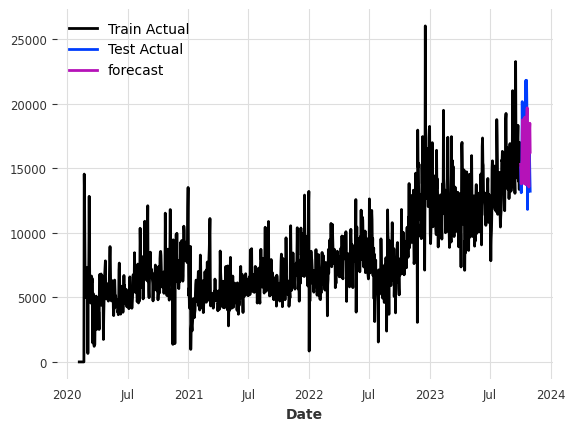

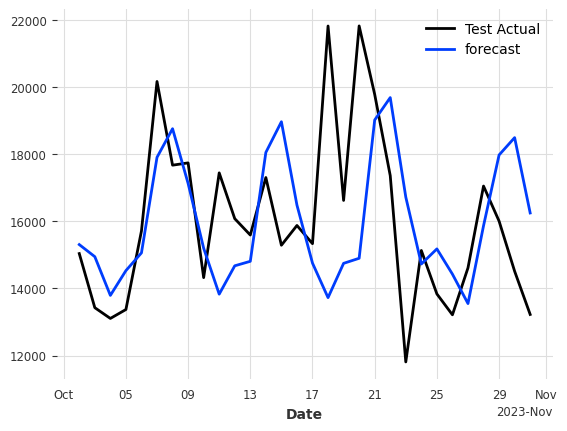

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 12.11%
TEST MAPE = 12.19%
Shop = 15
K-Fold Round = 1
MAPE = 13.84%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.10%
K-Fold Round = 3
MAPE = 10.09%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.69%


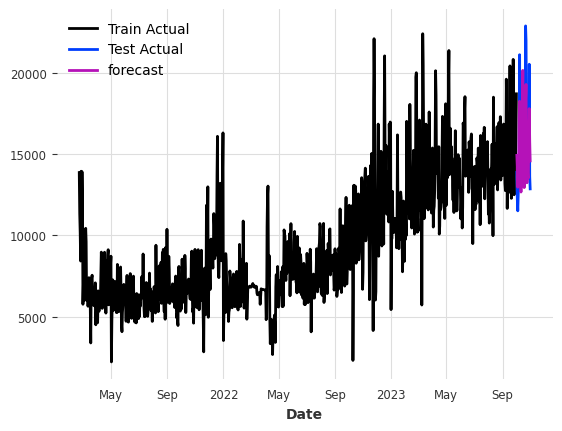

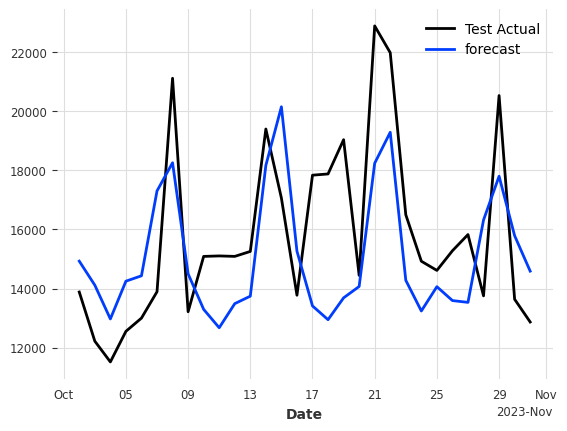

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 11.18%
TEST MAPE = 14.10%
Shop = 18
K-Fold Round = 1
MAPE = 9.96%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.88%
K-Fold Round = 3
MAPE = 10.21%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 7.46%


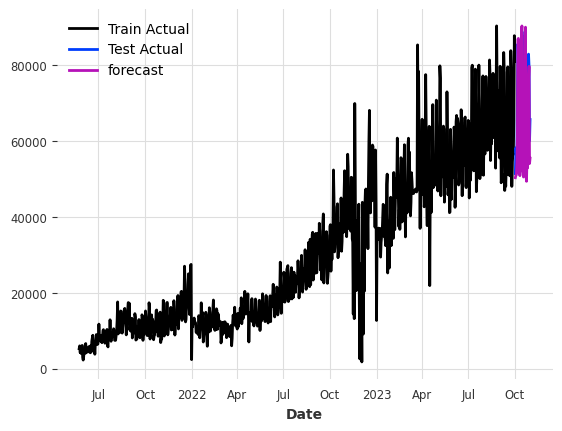

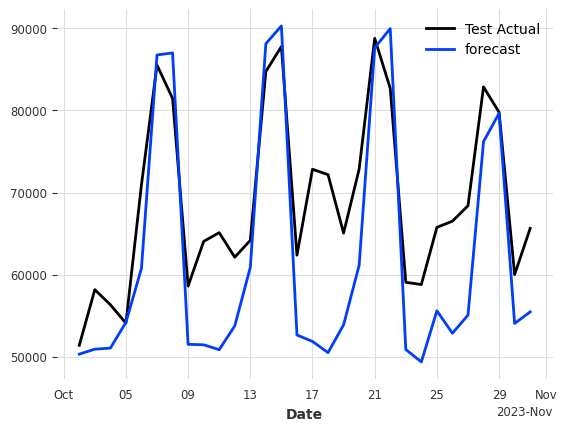

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 9.38%
TEST MAPE = 12.09%
Shop = 20
K-Fold Round = 1
MAPE = 11.87%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.71%
K-Fold Round = 3
MAPE = 9.61%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.77%


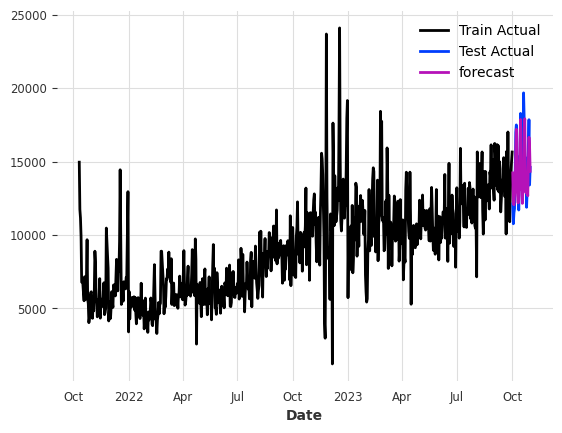

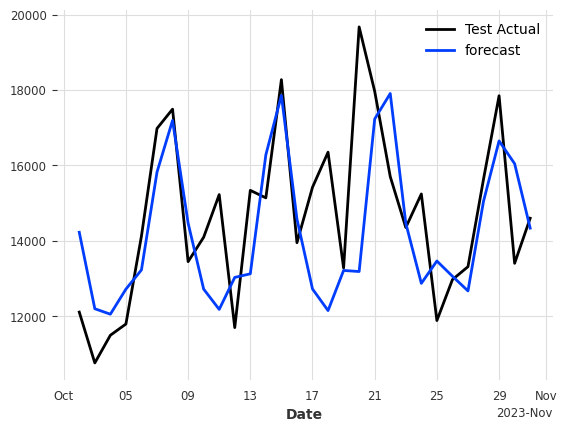

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 11.74%
TEST MAPE = 9.93%
Mean TEST MAPE = 12.20%
Predicting shop № 1


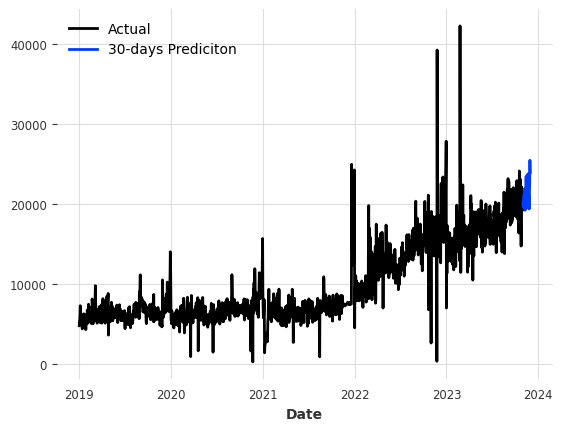

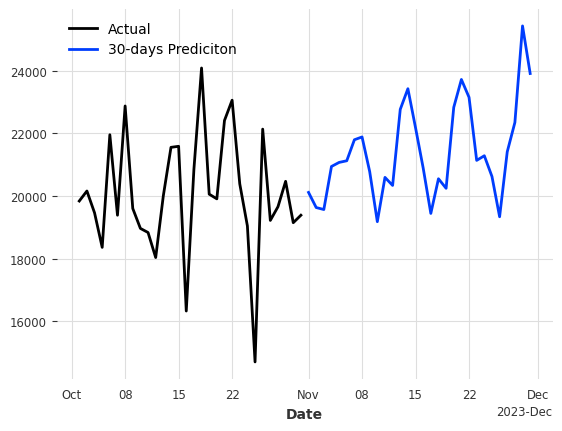

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 6


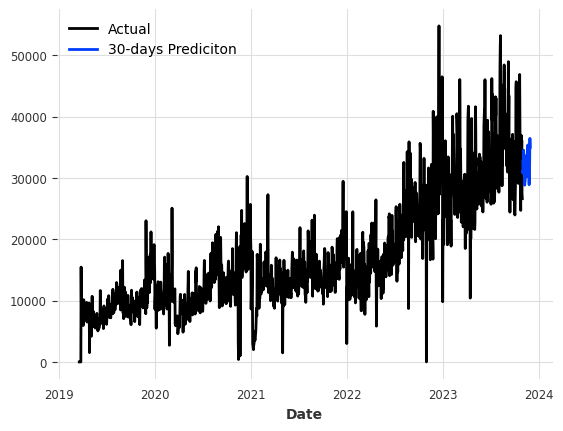

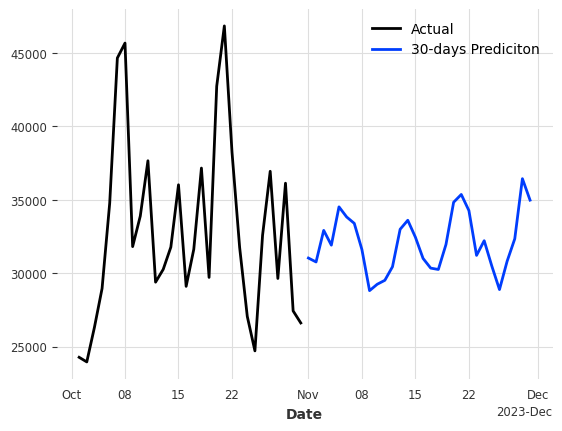

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 10


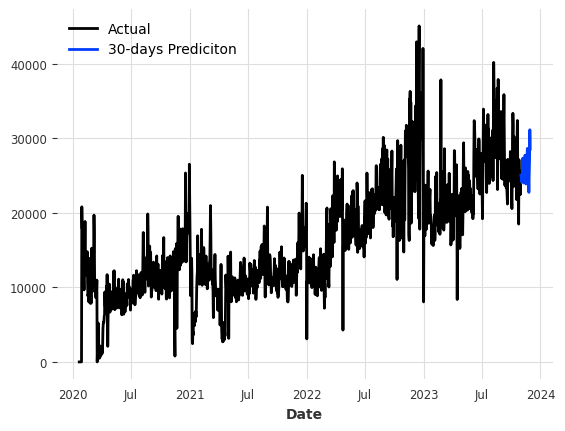

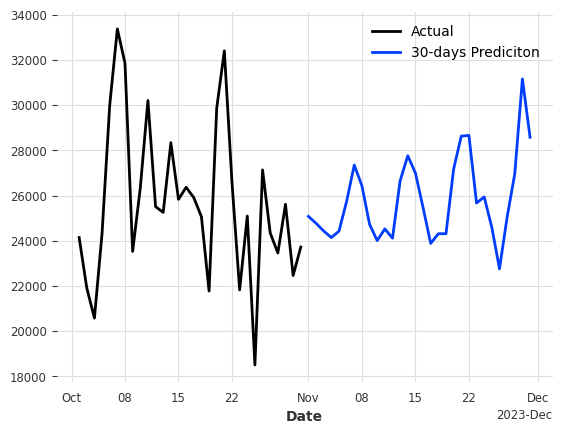

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 11


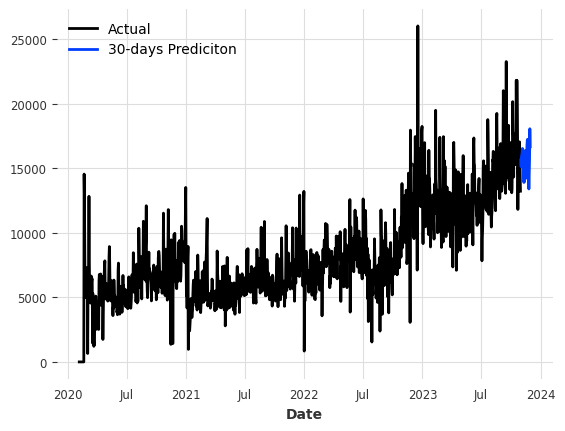

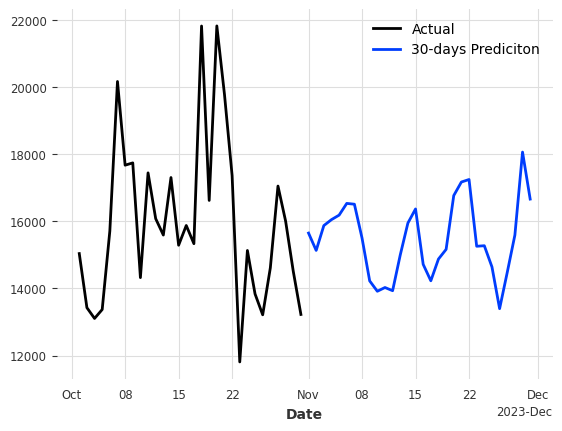

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 15


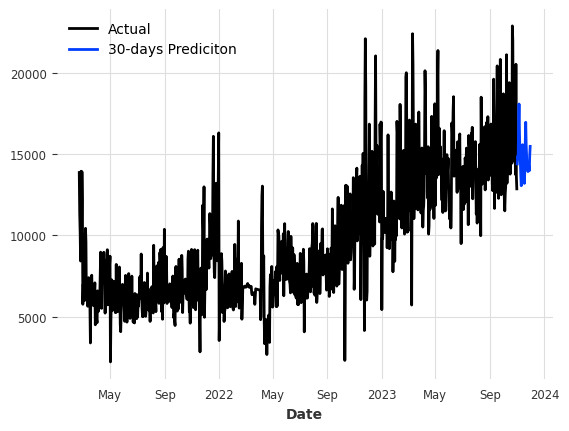

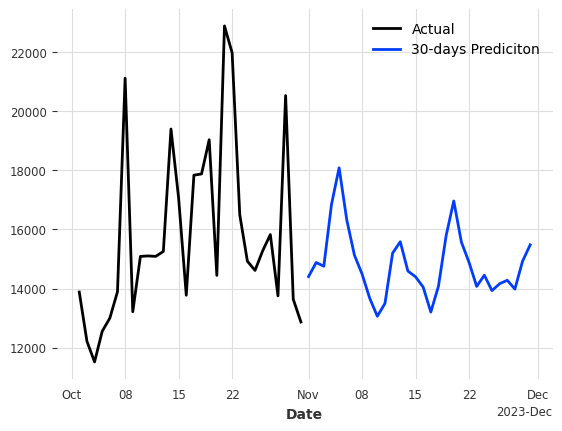

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 18


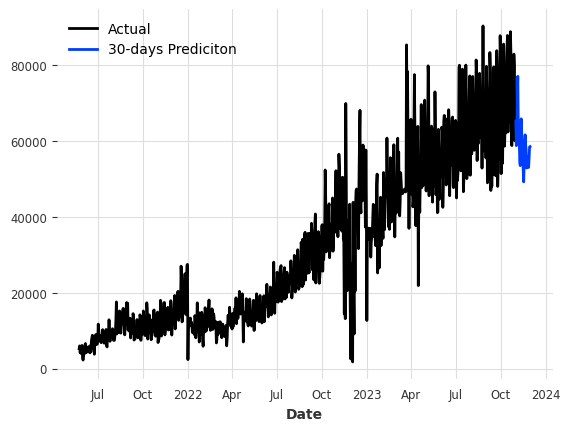

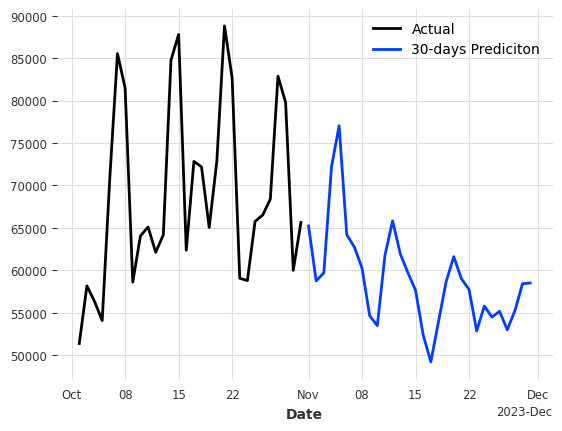

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 20


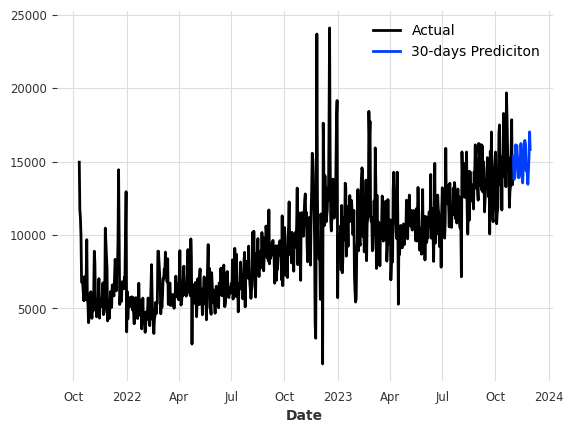

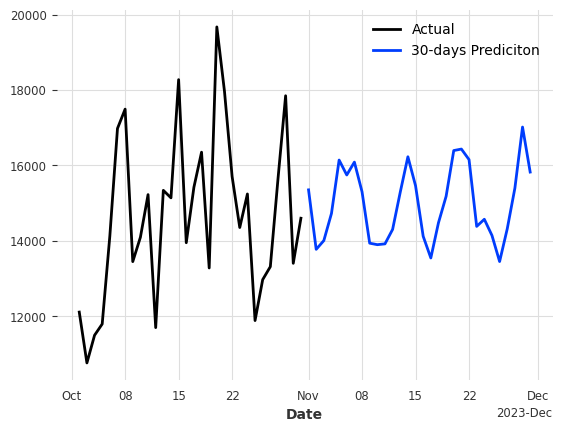

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Forecasting for [2, 5] shops
Local refernce is: supermarket
City area is: periphery


INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 6.2 M  | train
-------------------------------------------------------------
6.2 M     Trainable params
1.4 K     Non-trainable params
6.2 M     Total params
24.690    Total estimated model params size (MB)
396       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Running validation...
Shop = 2
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 14.10%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.44%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.78%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 15.08%


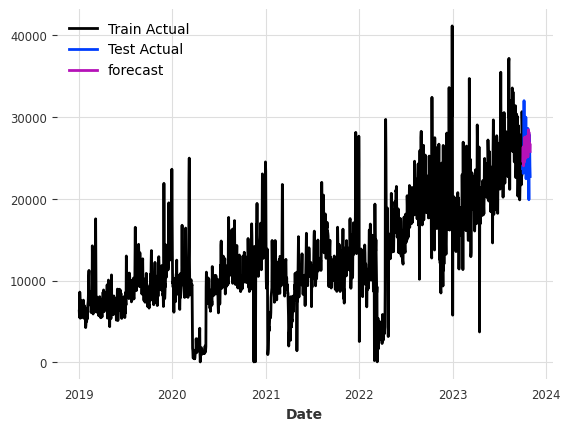

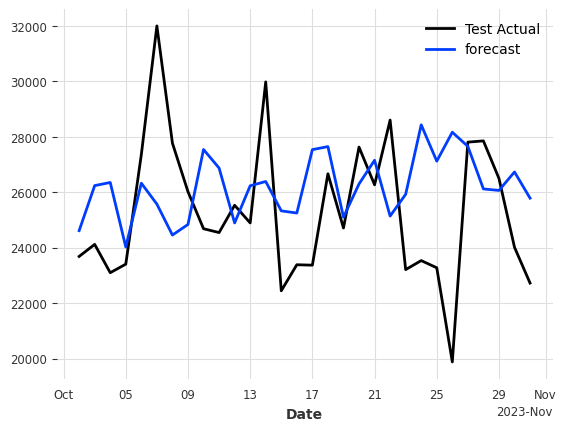

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 12.85%
TEST MAPE = 9.96%
Shop = 5
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 20.33%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 15.60%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.54%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.19%


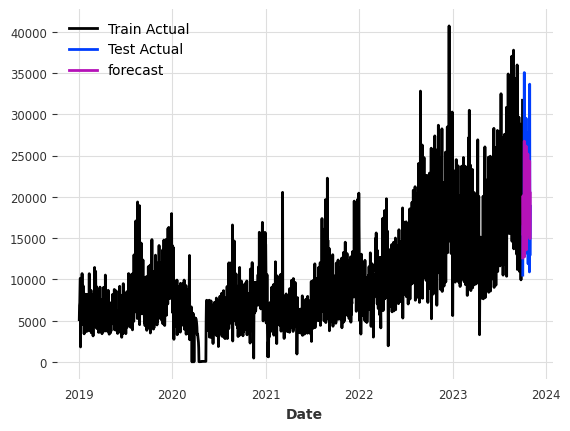

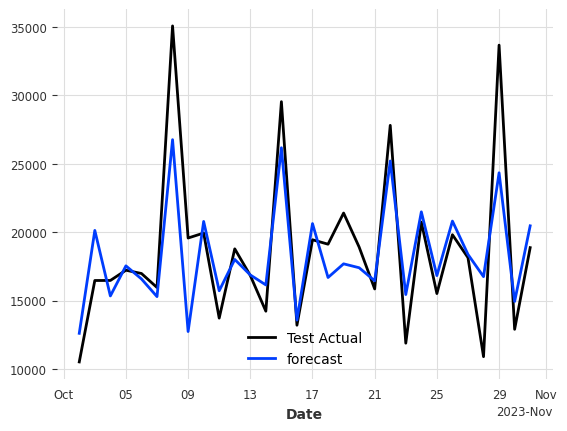

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 15.42%
TEST MAPE = 12.60%
Mean TEST MAPE = 11.28%
Predicting shop № 2


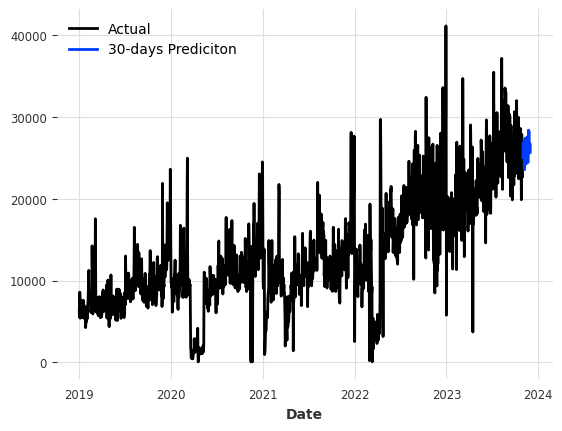

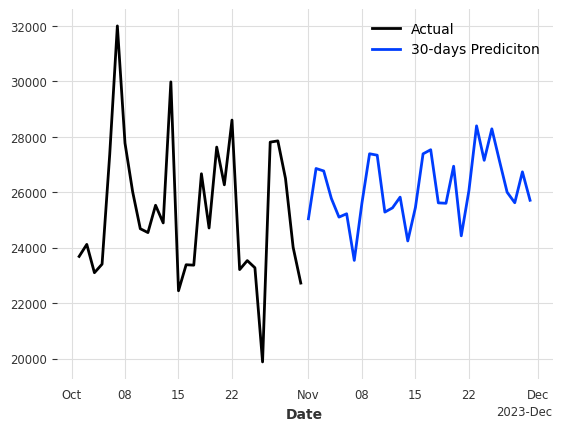

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 5


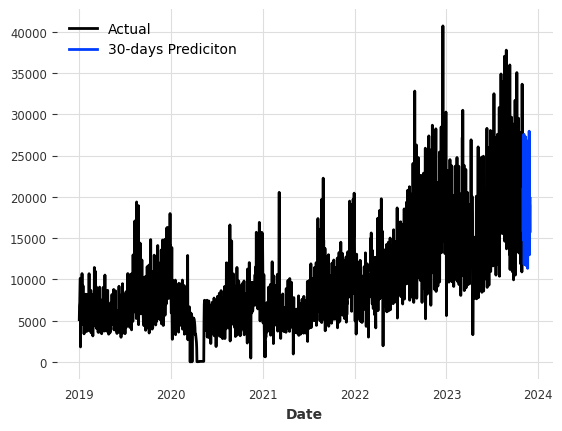

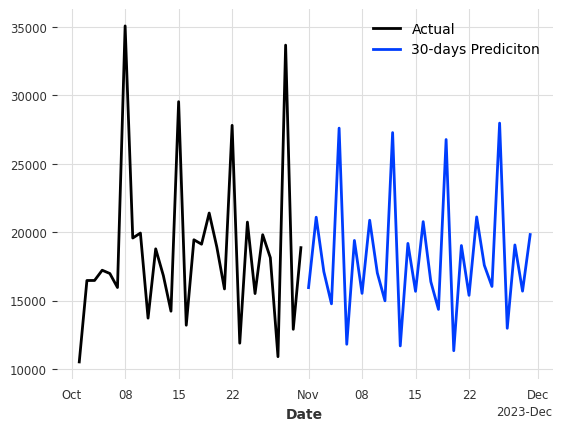

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Forecasting for [3, 7] shops
Local refernce is: administrative institution
City area is: centre


INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 6.2 M  | train
-------------------------------------------------------------
6.2 M     Trainable params
1.4 K     Non-trainable params
6.2 M     Total params
24.690    Total estimated model params size (MB)
396       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Running validation...
Shop = 3
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 15.15%
K-Fold Round = 2
MAPE = 12.90%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.28%
K-Fold Round = 4
MAPE = 9.16%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


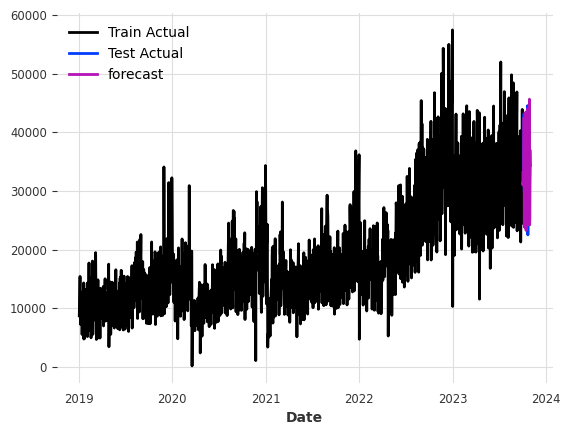

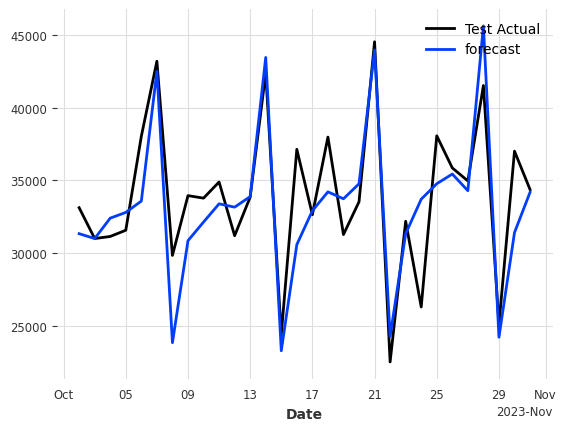

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 11.87%
TEST MAPE = 6.64%
Shop = 7
K-Fold Round = 1
MAPE = 13.67%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.89%
K-Fold Round = 3
MAPE = 6.94%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.94%


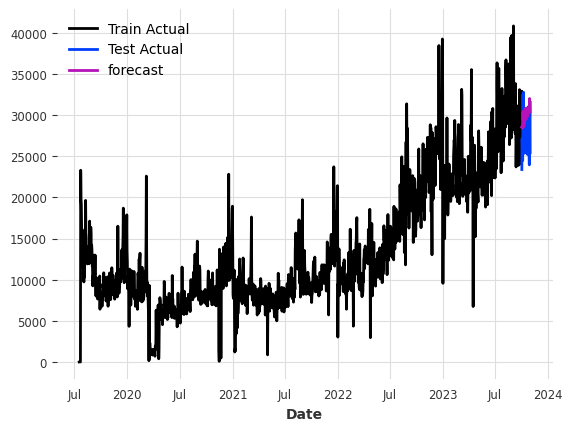

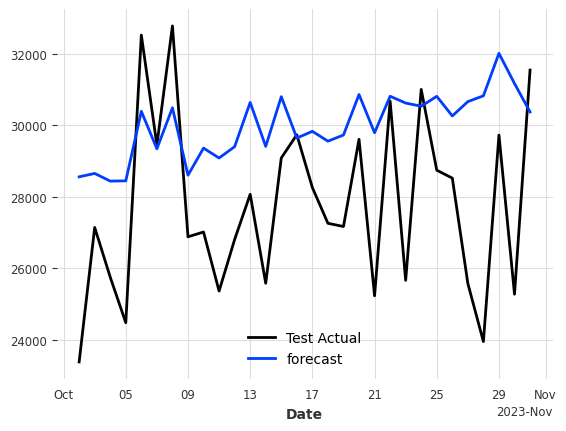

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 10.36%
TEST MAPE = 10.05%
Mean TEST MAPE = 8.35%
Predicting shop № 3


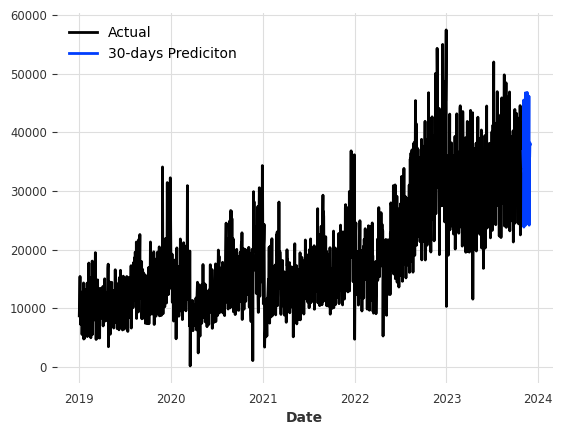

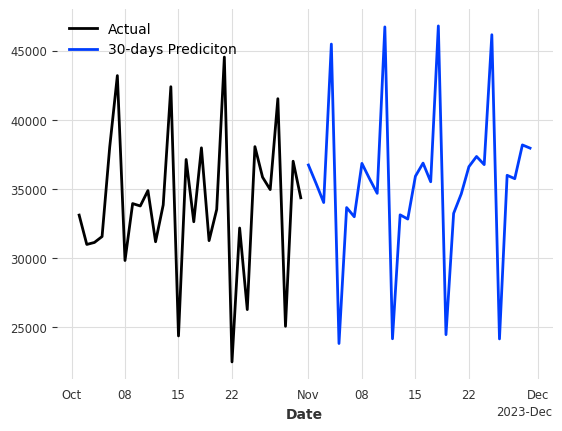

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 7


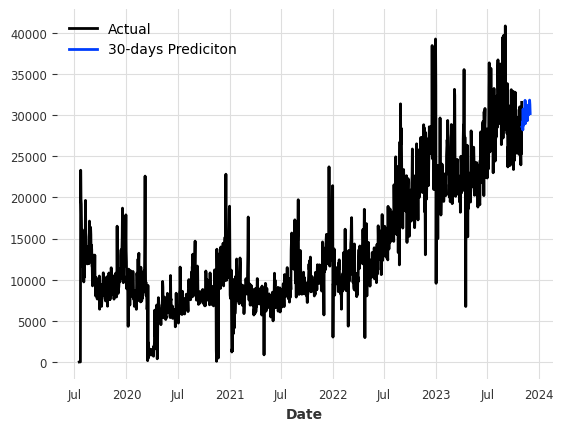

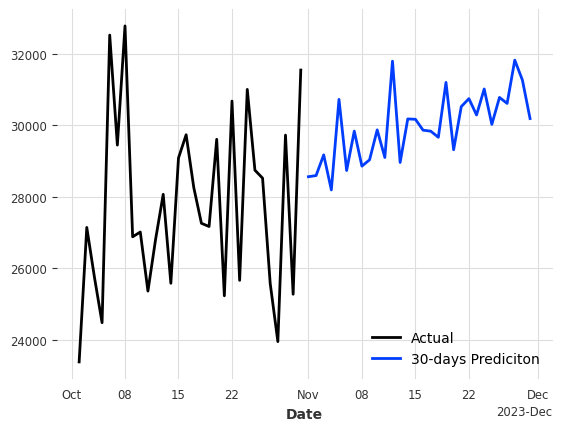

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Forecasting for [4, 8, 16, 23, 24, 22] shops
Local refernce is: supermarket
City area is: sleeping quarters


INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 6.2 M  | train
-------------------------------------------------------------
6.2 M     Trainable params
1.4 K     Non-trainable params
6.2 M     Total params
24.690    Total estimated model params size (MB)
396       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Running validation...
Shop = 4
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 14.22%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.38%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 18.83%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.18%


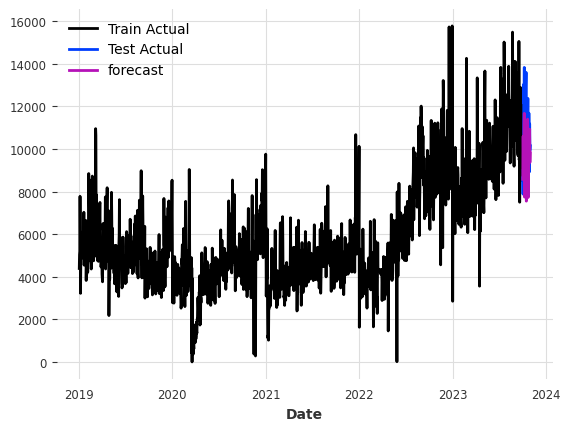

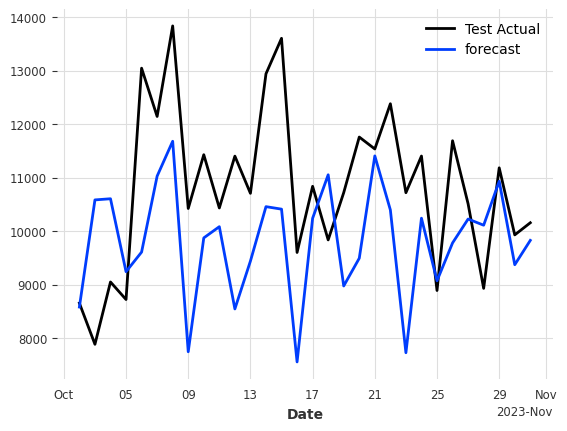

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 14.65%
TEST MAPE = 13.57%
Shop = 8
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 8.81%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 8.97%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.80%
K-Fold Round = 4
MAPE = 9.05%


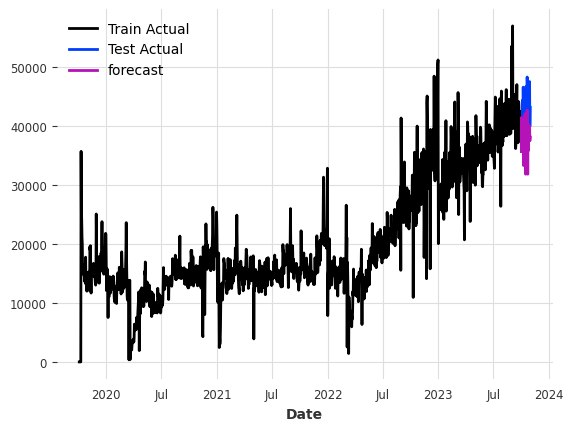

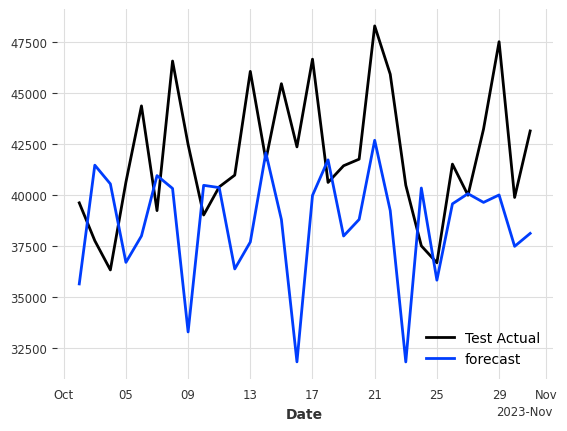

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 9.41%
TEST MAPE = 10.16%
Shop = 16
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.53%
K-Fold Round = 2
MAPE = 12.44%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 16.18%
K-Fold Round = 4
MAPE = 12.67%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


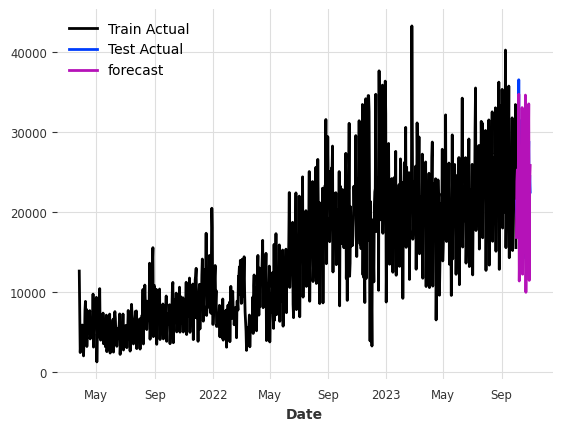

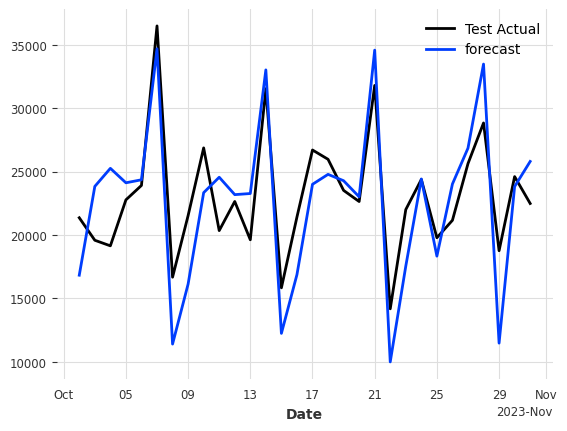

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 12.95%
TEST MAPE = 14.16%
Shop = 23
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.83%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.36%
K-Fold Round = 3
MAPE = 8.85%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.72%


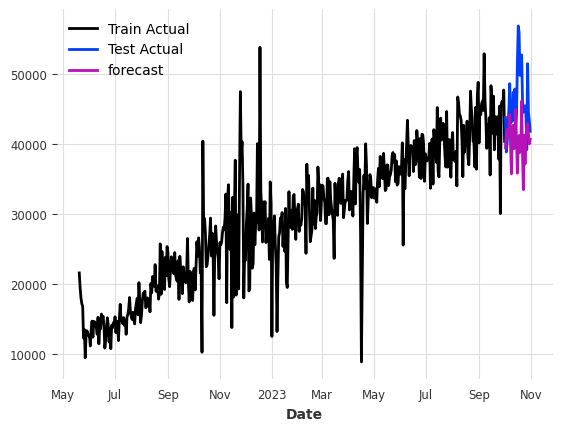

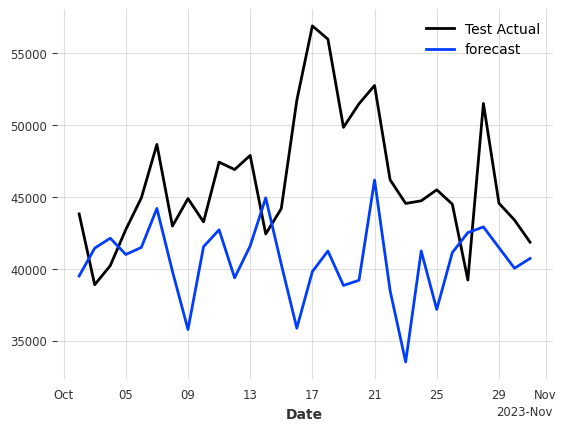

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 9.94%
TEST MAPE = 13.03%
Shop = 24
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.45%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 15.63%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.61%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.07%


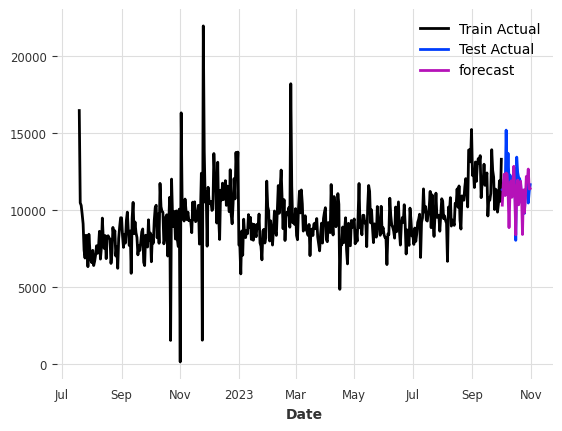

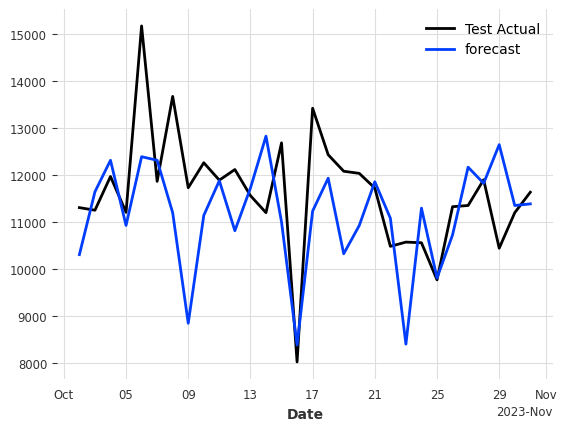

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 12.69%
TEST MAPE = 8.43%
Shop = 22
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.58%
K-Fold Round = 2
MAPE = 7.09%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.05%
K-Fold Round = 4
MAPE = 7.11%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


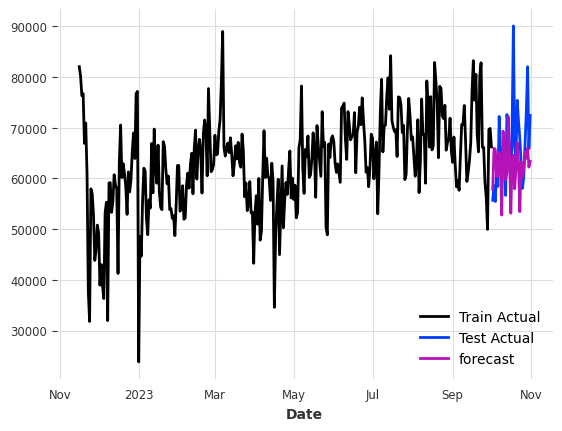

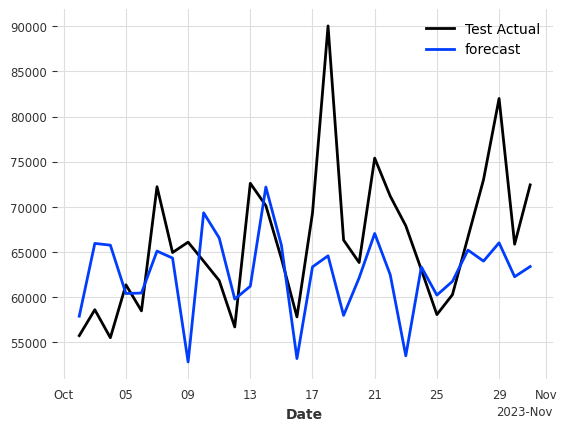

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 8.71%
TEST MAPE = 9.23%
Mean TEST MAPE = 11.43%
Predicting shop № 4


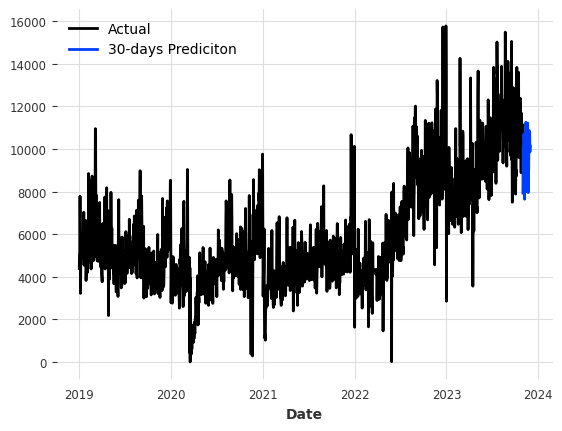

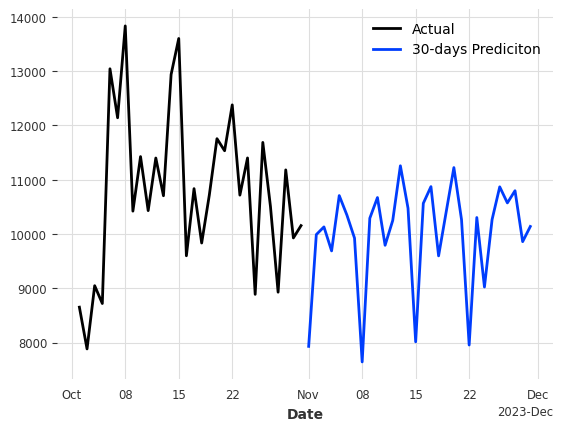

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 8


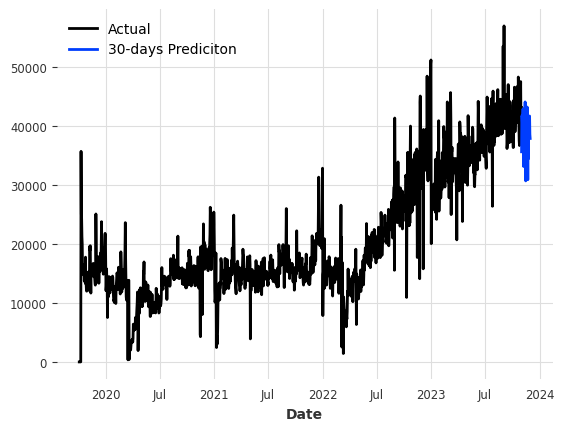

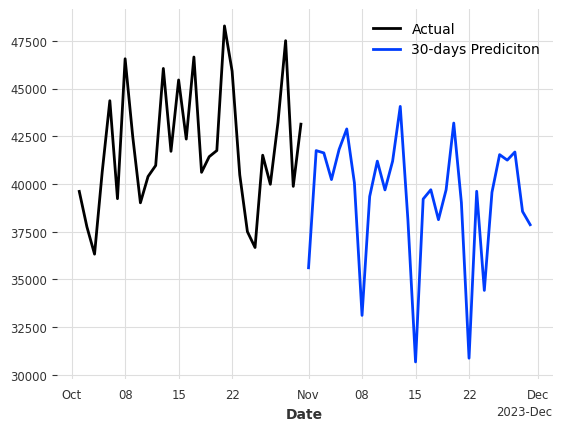

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 16


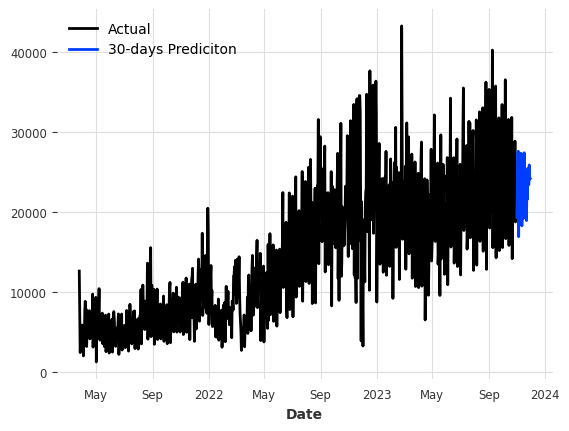

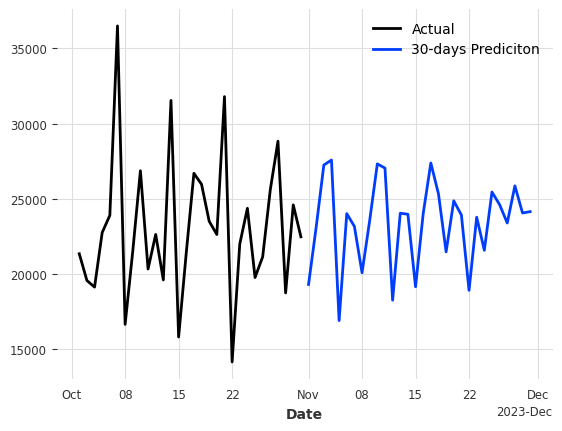

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 23


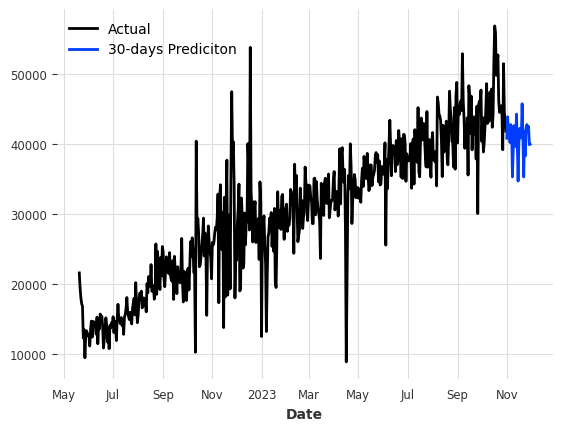

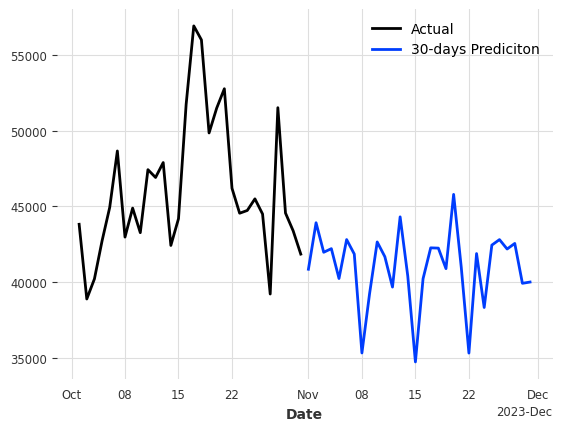

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 24


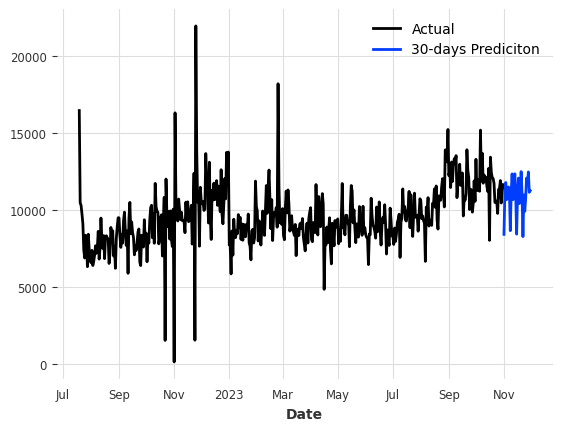

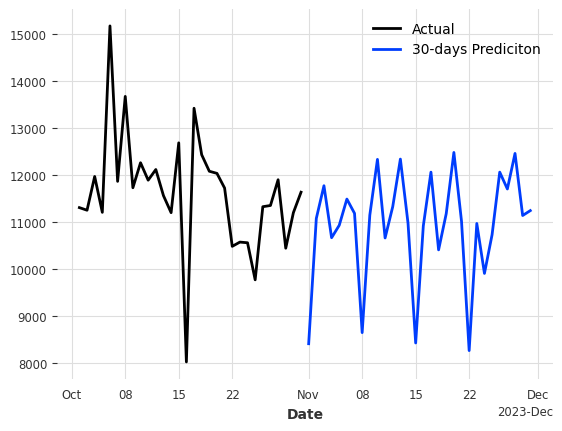

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 22


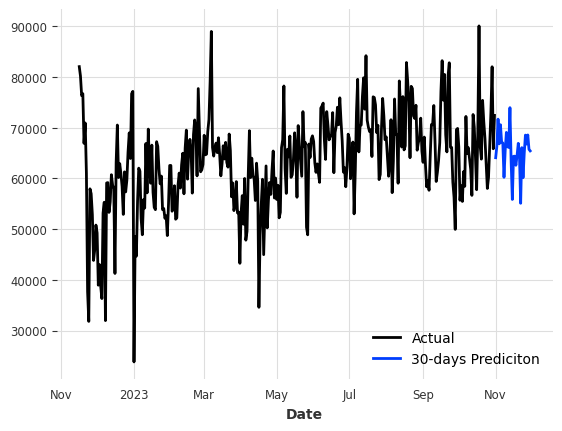

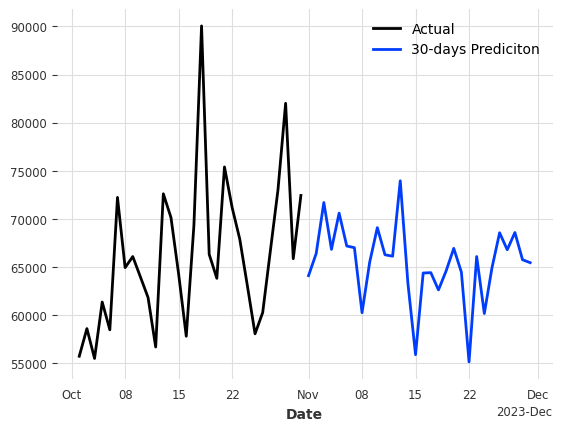

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Forecasting for [9, 12, 13, 19, 21] shops
Local refernce is: bazaar
City area is: centre


INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 6.2 M  | train
-------------------------------------------------------------
6.2 M     Trainable params
1.4 K     Non-trainable params
6.2 M     Total params
24.690    Total estimated model params size (MB)
396       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Running validation...
Shop = 9
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.69%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 15.97%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 18.16%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 15.46%


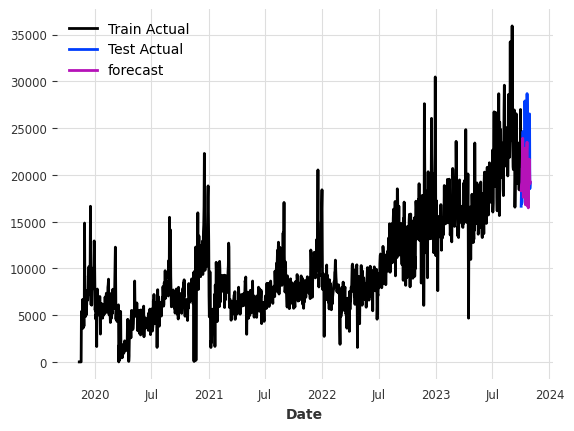

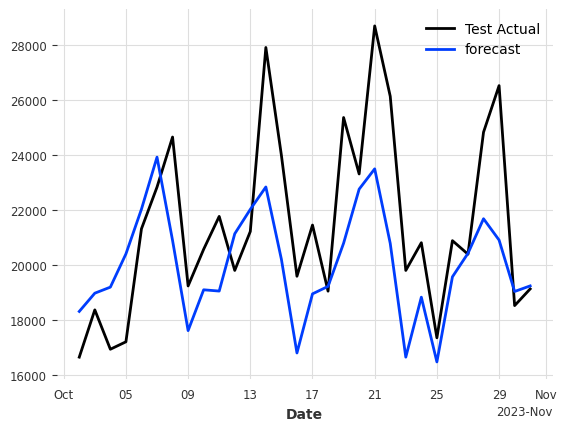

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 15.82%
TEST MAPE = 10.04%
Shop = 12
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.01%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 25.09%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.69%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.60%


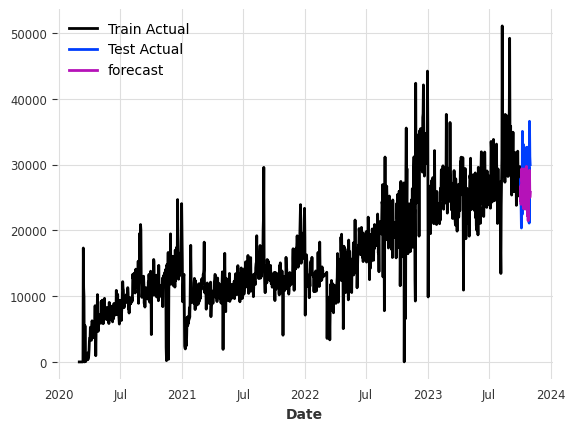

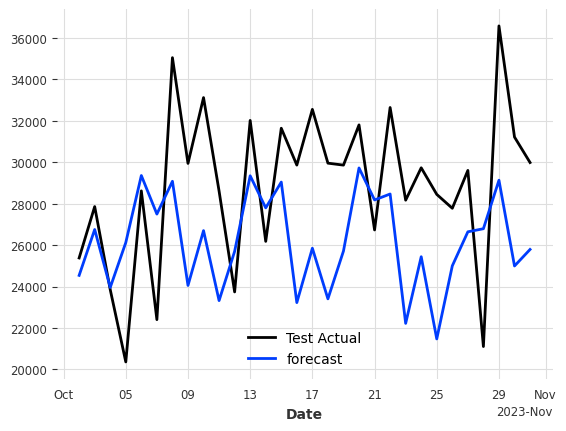

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 15.59%
TEST MAPE = 14.38%
Shop = 13
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.15%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 17.77%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.46%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 15.28%


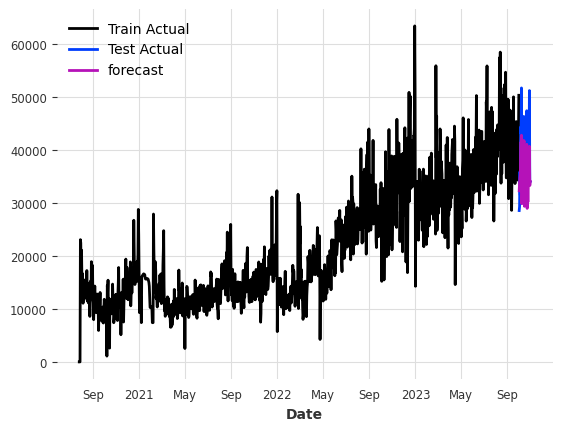

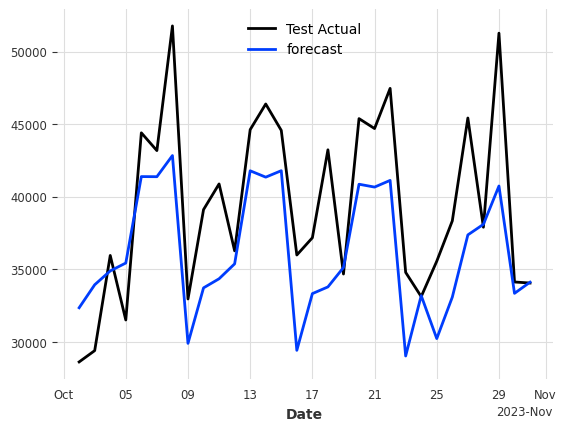

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 13.66%
TEST MAPE = 10.27%
Shop = 19
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.81%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 18.07%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 18.98%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 17.84%


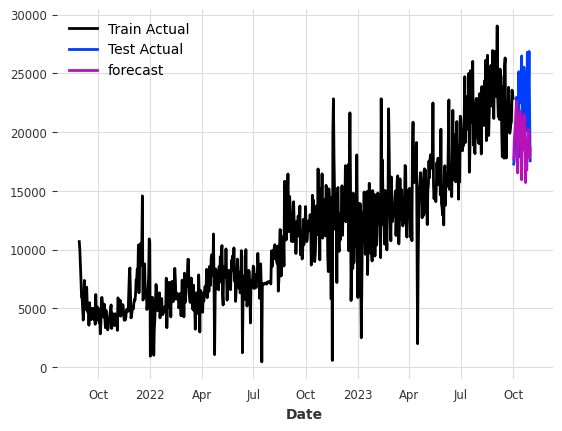

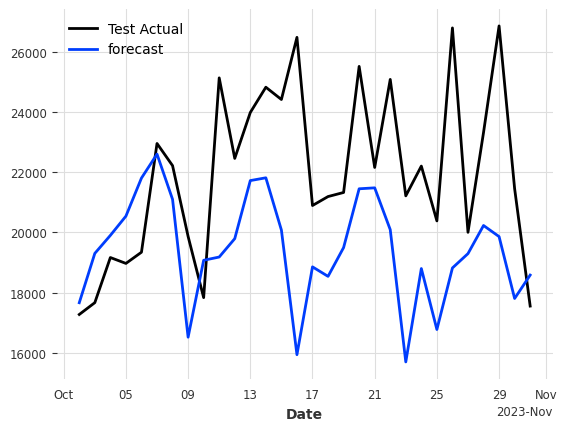

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 16.68%
TEST MAPE = 13.51%
Shop = 21
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.51%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.49%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.56%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.63%


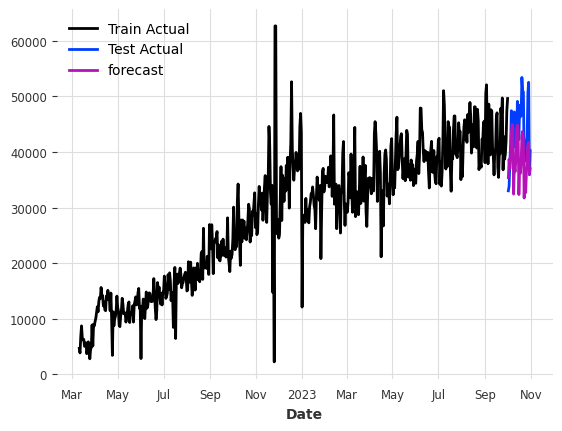

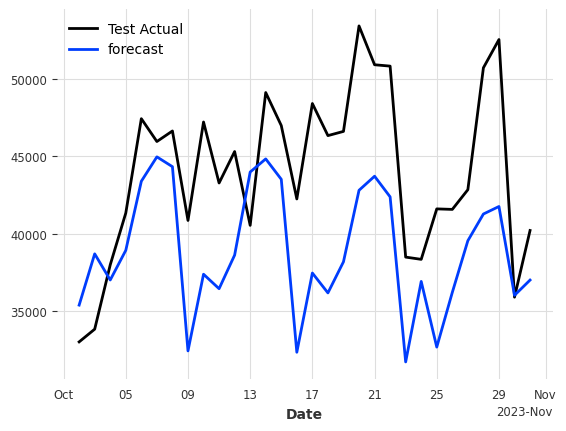

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 12.30%
TEST MAPE = 12.98%
Mean TEST MAPE = 12.24%
Predicting shop № 9


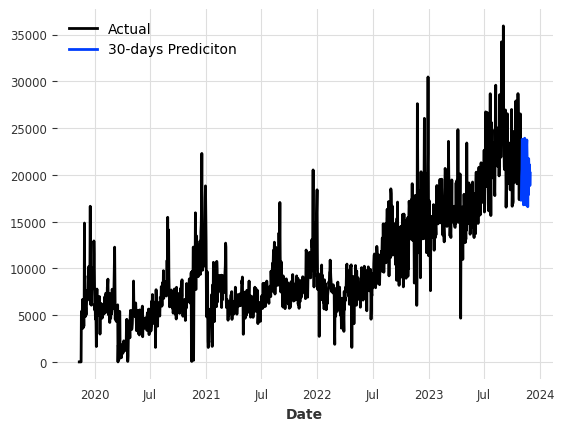

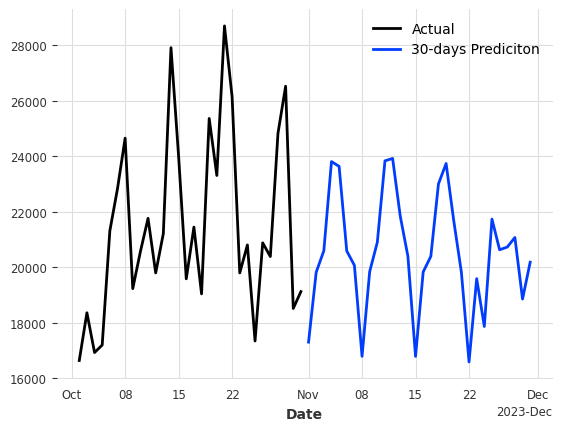

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 12


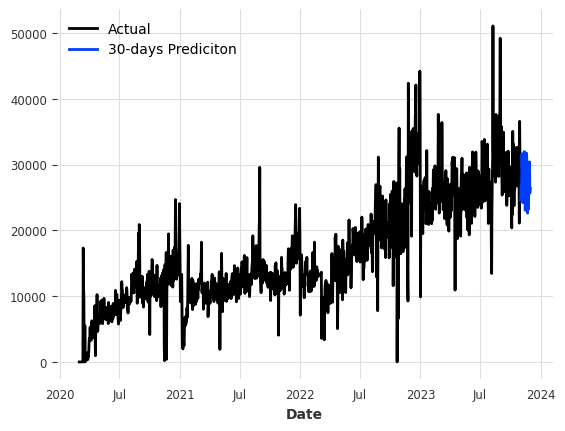

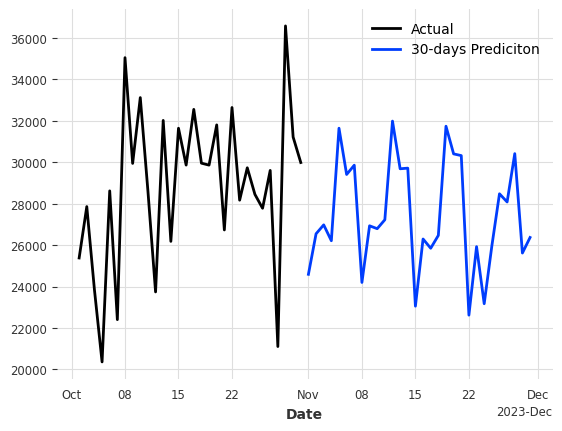

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 13


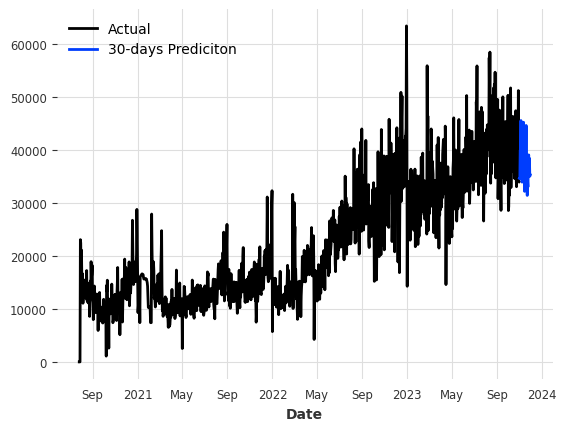

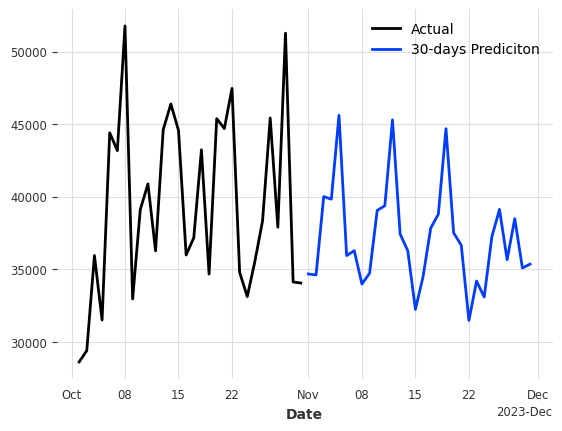

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 19


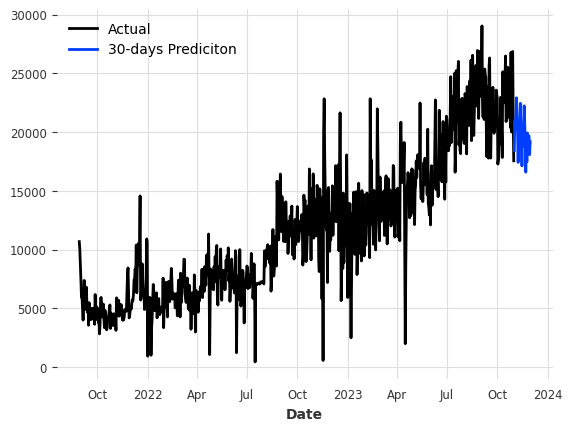

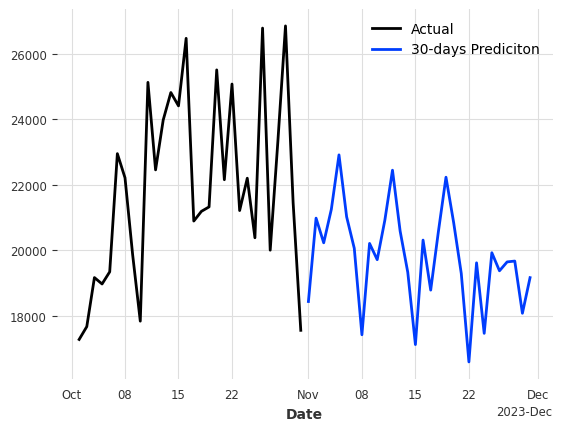

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 21


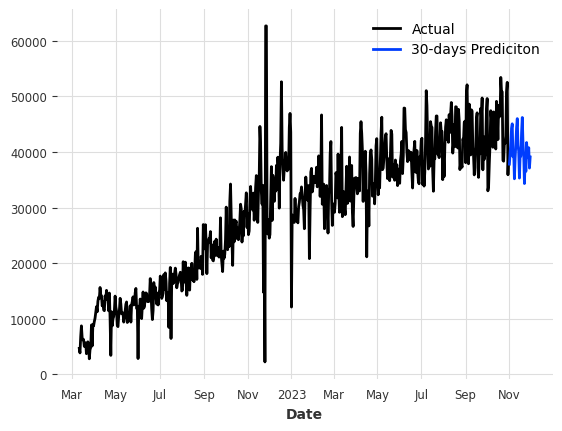

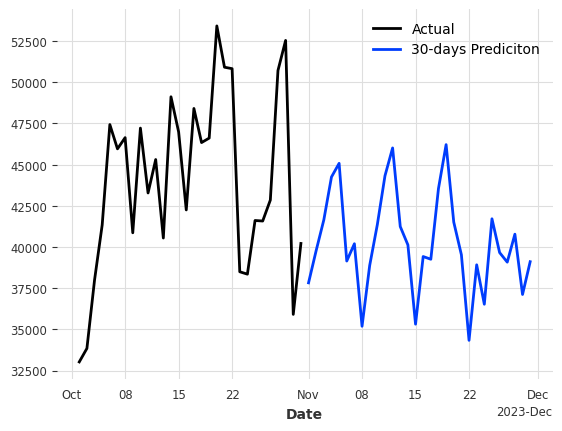

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Forecasting for [14] shops
Local refernce is: educational institution
City area is: sleeping quarters


INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 6.2 M  | train
-------------------------------------------------------------
6.2 M     Trainable params
1.4 K     Non-trainable params
6.2 M     Total params
24.690    Total estimated model params size (MB)
396       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Running validation...
Shop = 14
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 7.44%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.77%
K-Fold Round = 3
MAPE = 9.55%
K-Fold Round = 4

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.51%


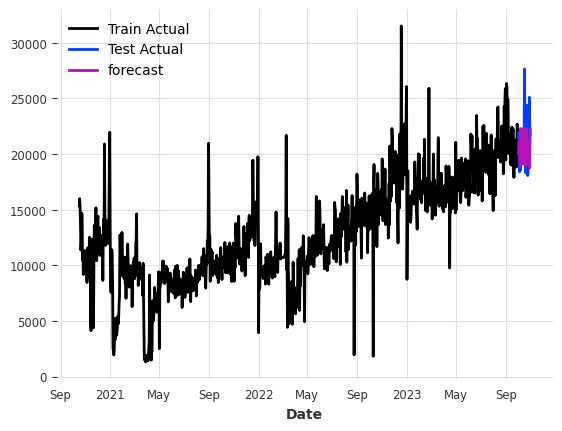

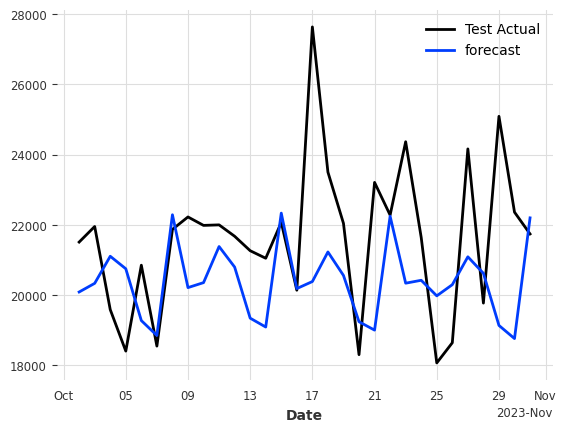

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 9.57%
TEST MAPE = 8.51%
Mean TEST MAPE = 8.51%
Predicting shop № 14


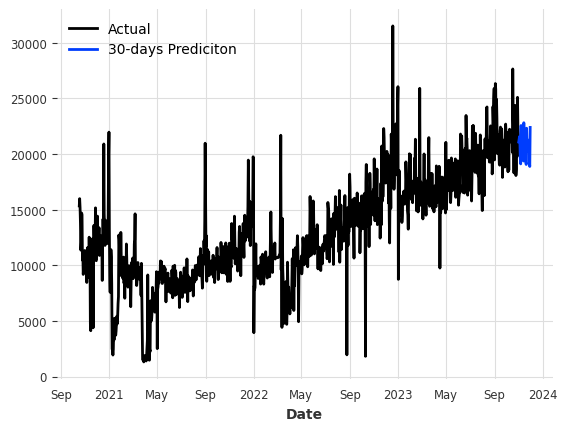

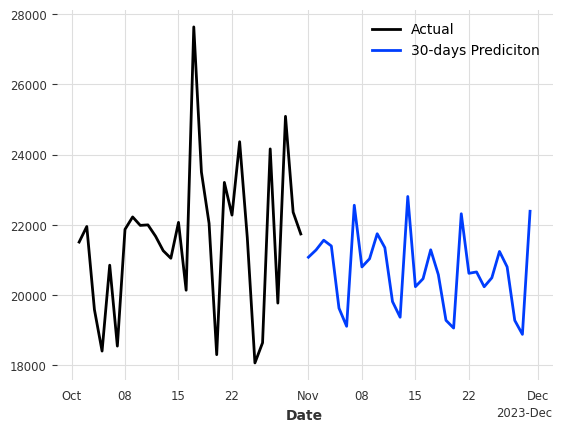

Forecasting for [17] shops
Local refernce is: railway station
City area is: centre


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 6.2 M  | train
-------------------------------------------------------------
6.2 M     Trainable params
1.4 K     Non-trainable params
6.2 M     Total params
24.690    Total estimated model params size (MB)
396       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Running validation...
Shop = 17
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.07%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 15.65%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.68%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.22%


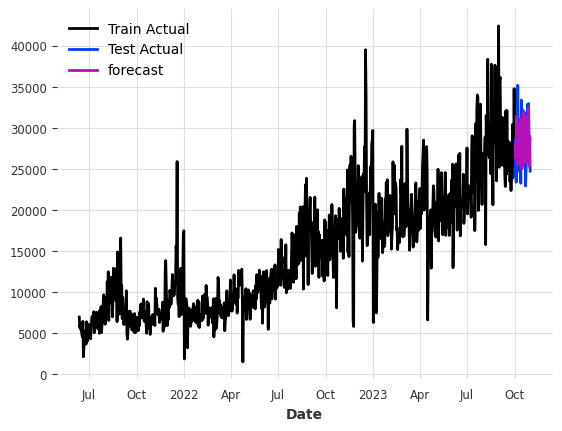

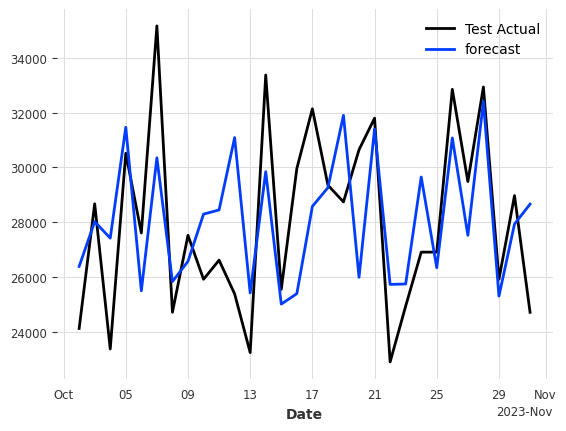

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 13.91%
TEST MAPE = 7.99%
Mean TEST MAPE = 7.99%
Predicting shop № 17


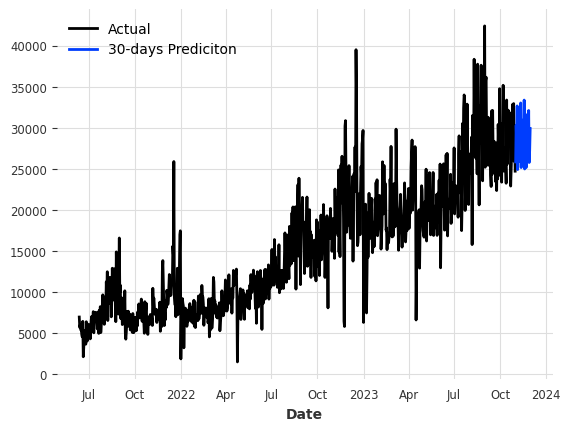

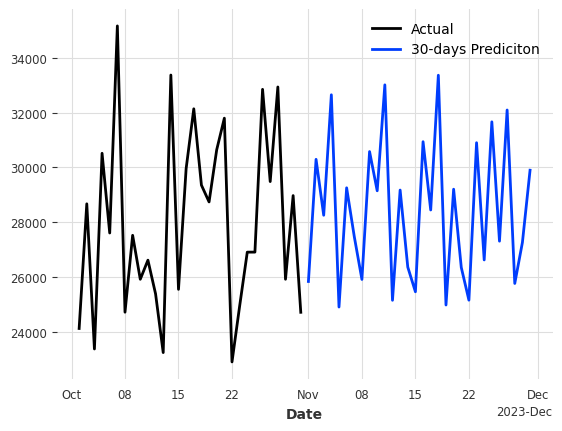

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Forecasting for [26, 25] shops
Local refernce is: centre
City area is: centre


INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 6.2 M  | train
-------------------------------------------------------------
6.2 M     Trainable params
1.4 K     Non-trainable params
6.2 M     Total params
24.690    Total estimated model params size (MB)
396       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Running validation...
Shop = 26
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 8.92%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 14.04%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.24%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.73%


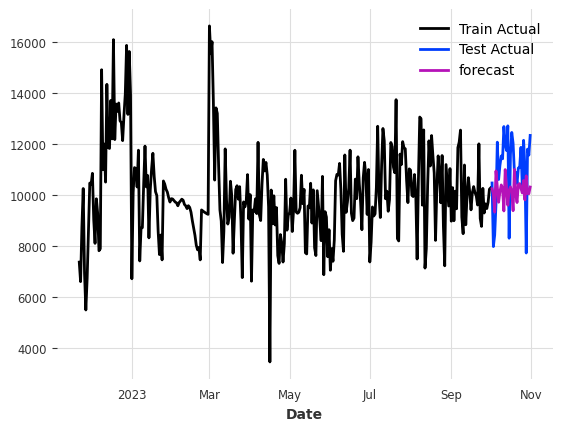

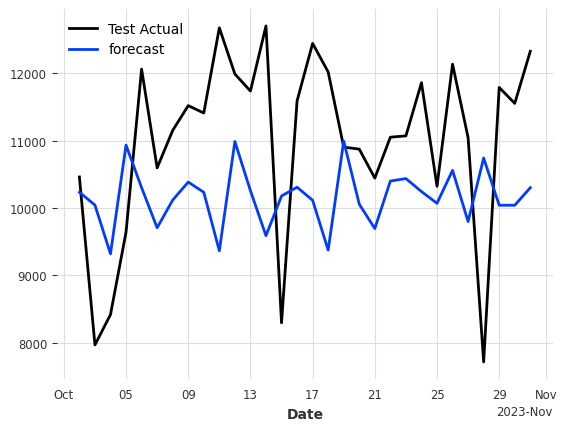

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 10.98%
TEST MAPE = 13.39%
Shop = 25
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 8.08%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.98%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.80%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.79%


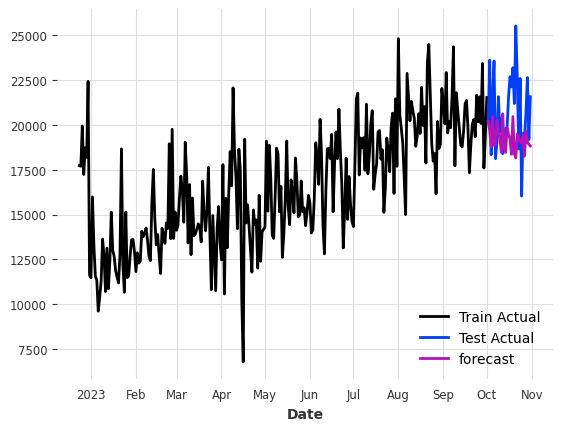

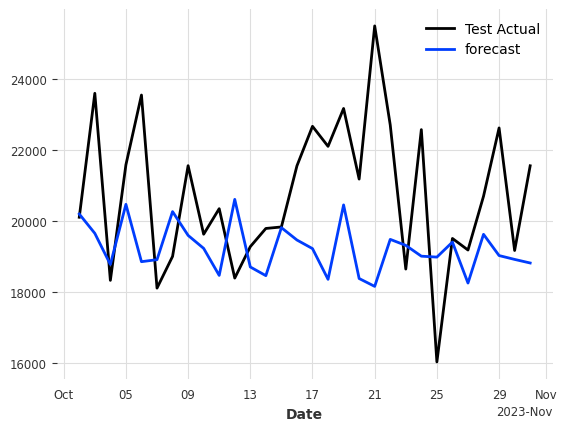

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 10.41%
TEST MAPE = 9.55%
Mean TEST MAPE = 11.47%
Predicting shop № 26


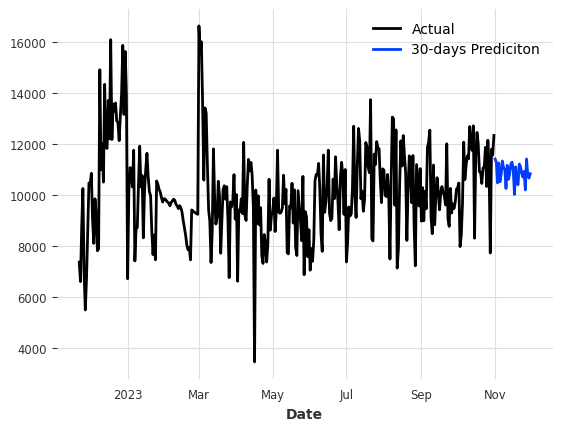

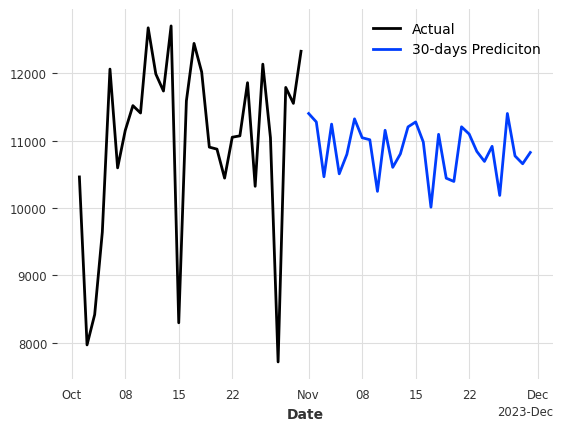

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop № 25


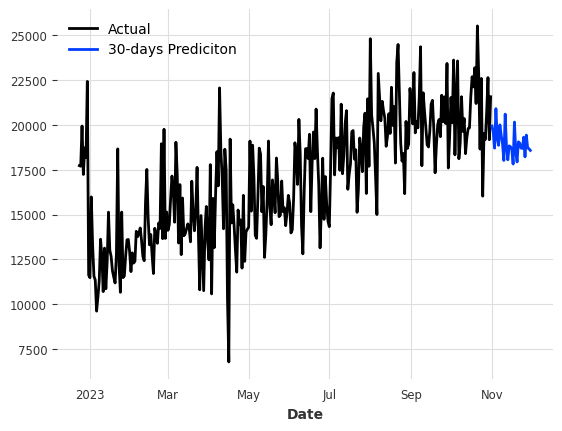

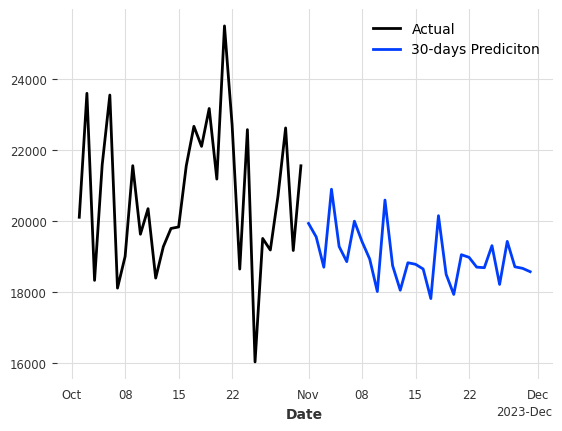

In [73]:
for label, shops in category_crossings.items():
  print(f'Forecasting for {shops} shops')
  lf, ca = label.split('-')
  print('Local refernce is:', lf)
  print('City area is:', ca)

  model = NBEATSModel(input_chunk_length=21,
                      output_chunk_length=7,
                      n_epochs=10,
                      random_state=42)
  model.fit(series=[x for key, x in train.items() if key in shops], verbose=True)
  validation(model, {key: x for key, x in train.items() if key in shops},
              {key: y for key, y in test.items() if key in shops},
              scalers, test_pivot=30, k=4)

  for shop in shops:
      print(f'Predicting shop № {shop}')
      df = scaled_dfs[shop]
      prediction = model.predict(n=30, series=df,
                                 show_warnings=False, verbose=False)

      # Plotting results
      scalers[shop].inverse_transform(df).plot(label='Actual')
      pred_inversed = scalers[shop].inverse_transform(prediction)
      pred_inversed.plot(label='30-days Prediciton')
      plt.show()

      scalers[shop].inverse_transform(df)[-30:].plot(label='Actual')
      pred_inversed = scalers[shop].inverse_transform(prediction)
      pred_inversed.plot(label='30-days Prediciton')
      plt.show()

In [ ]:
# Global Nbeats over all stores

In [ ]:
dfs = transform_df(shop=[i for i in range(1, 31)], fill_zero=True)
scaled_dfs, scalers = scale_dfs(dfs)
train, test = get_train_test(scaled_dfs, 30)

In [20]:
# Model without exogs, trained on all time series
whole_store_model = NBEATSModel(input_chunk_length=21,
                                output_chunk_length=7,
                                n_epochs=10,
                                random_state=42)

In [21]:
whole_store_model.fit(series=[df for df in train.values()], verbose=True)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | stacks          | ModuleList       | 6.2 M  | train
-------------------------------------------------------------
6.2 M     Trainable params
1.4 K     Non-trainable params
6.2 M     Total params
24.690    Total estimated model params size (MB)
396       Modules in train mode
0         Modules in eval mode


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


NBEATSModel(output_chunk_shift=0, generic_architecture=True, num_stacks=30, num_blocks=1, num_layers=4, layer_widths=256, expansion_coefficient_dim=5, trend_polynomial_degree=2, dropout=0.0, activation=ReLU, input_chunk_length=21, output_chunk_length=7, n_epochs=10, random_state=42)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Running validation...
Shop = 1
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.17%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.29%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores


MAPE = 7.88%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 7.42%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


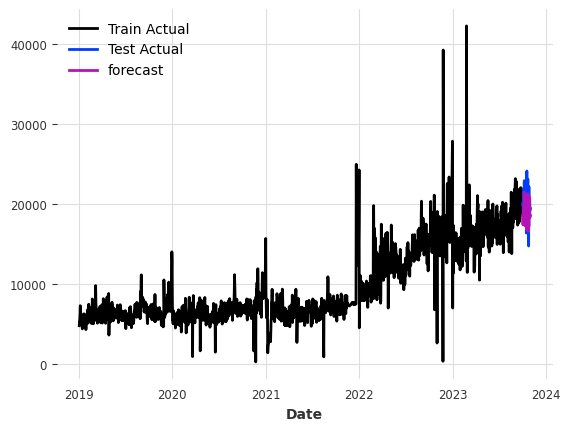

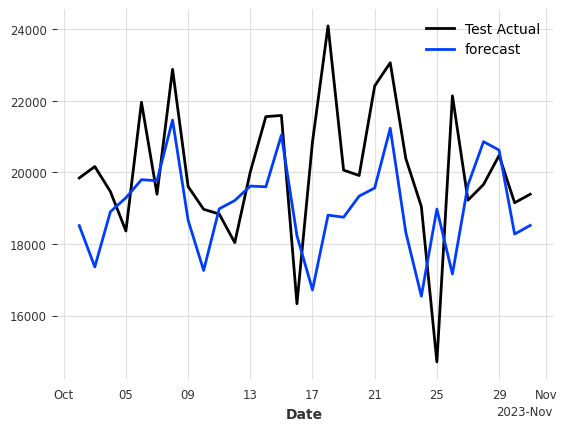

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 8.69%
TEST MAPE = 8.59%
Shop = 2
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.96%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.91%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.59%
K-Fold Round = 4
MAPE = 11.27%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


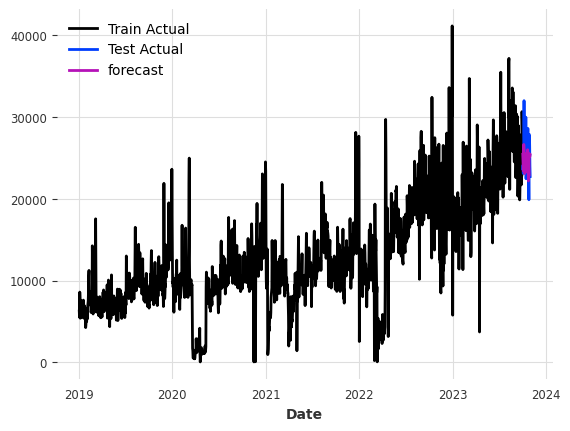

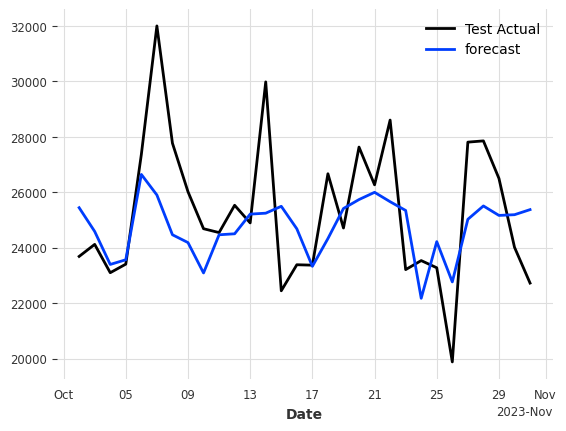

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 12.18%
TEST MAPE = 6.75%
Shop = 3
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 17.22%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.59%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.51%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 16.60%


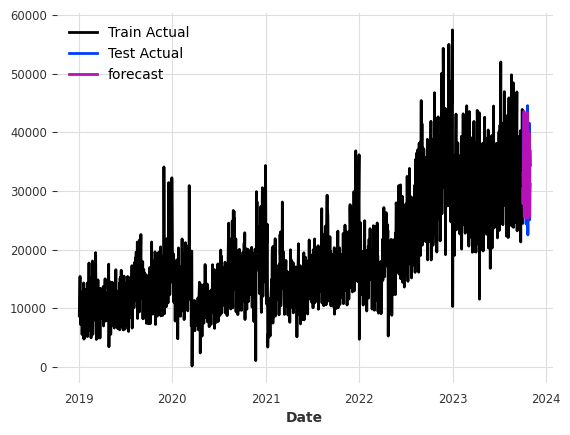

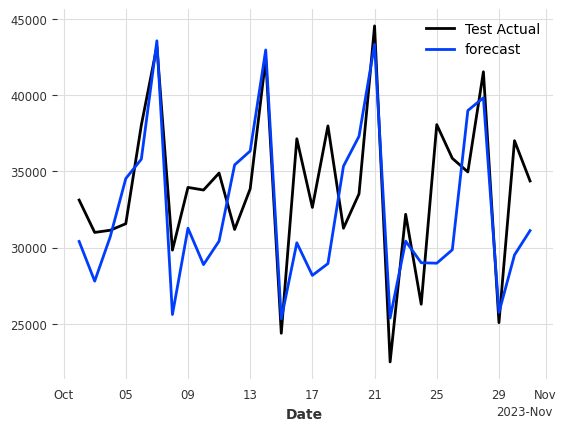

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False


MEAN Validation MAPE = 14.48%
TEST MAPE = 10.38%
Shop = 4
K-Fold Round = 1
MAPE = 12.68%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False


MAPE = 11.37%
K-Fold Round = 3
MAPE = 15.45%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 7.96%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


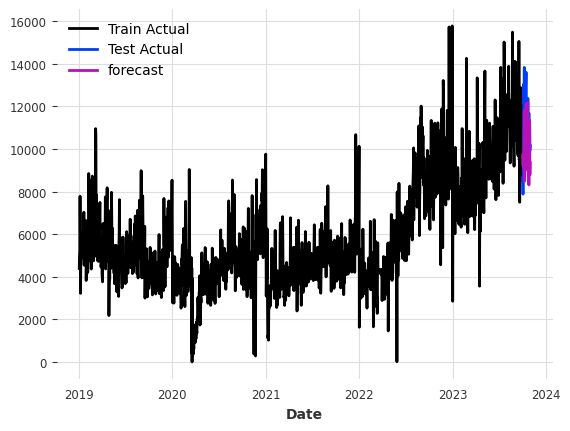

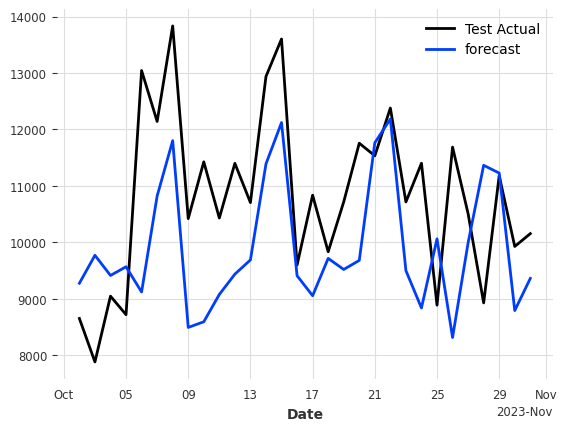

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 11.86%
TEST MAPE = 12.87%
Shop = 5
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 17.00%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 17.57%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 15.00%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 18.21%


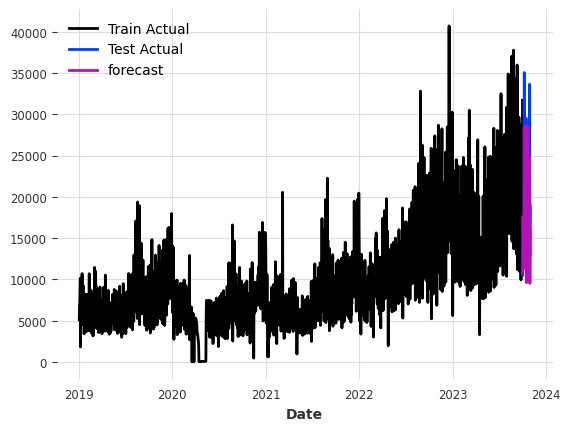

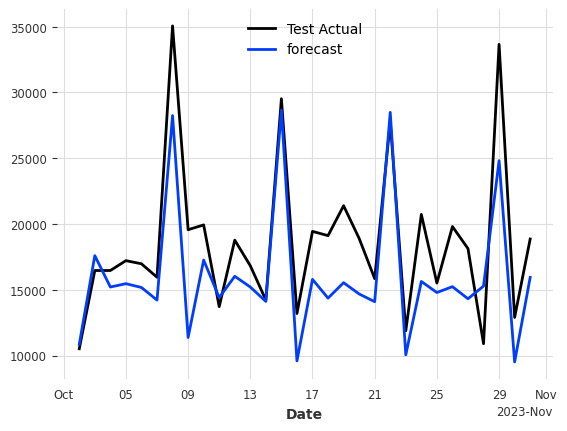

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 16.95%
TEST MAPE = 16.27%
Shop = 6
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 15.41%
K-Fold Round = 2
MAPE = 16.18%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.26%
K-Fold Round = 4
MAPE = 11.81%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


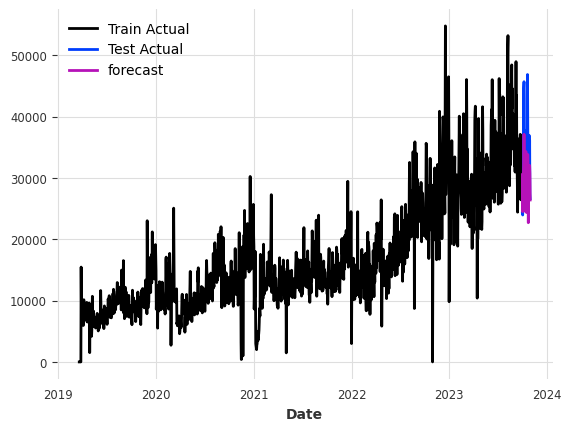

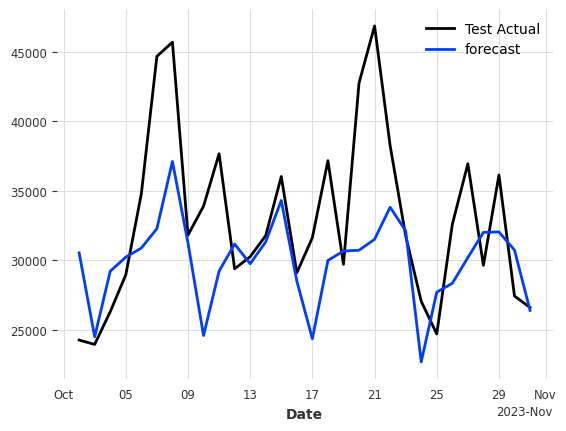

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 13.67%
TEST MAPE = 12.66%
Shop = 7
K-Fold Round = 1
MAPE = 9.80%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.40%
K-Fold Round = 3
MAPE = 9.17%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.42%


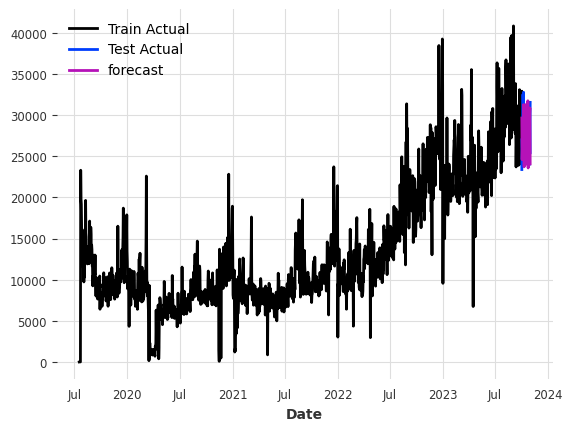

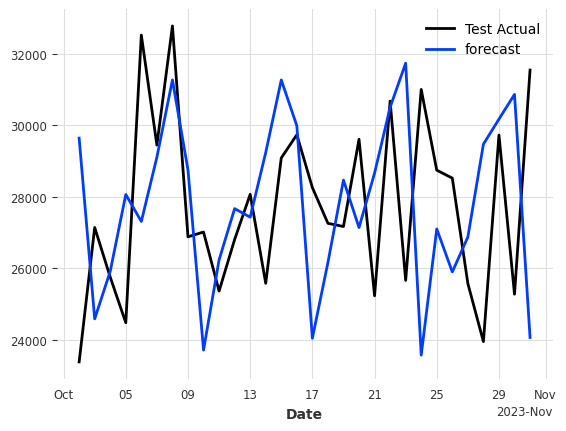

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 10.95%
TEST MAPE = 10.27%
Shop = 8
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 7.83%
K-Fold Round = 2
MAPE = 6.64%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 8.30%
K-Fold Round = 4
MAPE = 6.60%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


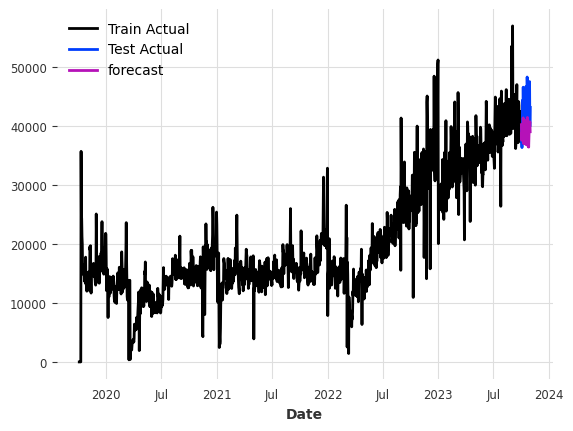

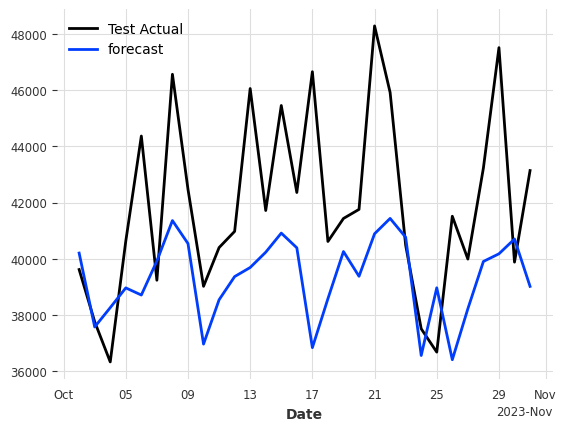

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 7.34%
TEST MAPE = 6.94%
Shop = 9
K-Fold Round = 1
MAPE = 11.92%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.92%
K-Fold Round = 3
MAPE = 15.18%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.25%


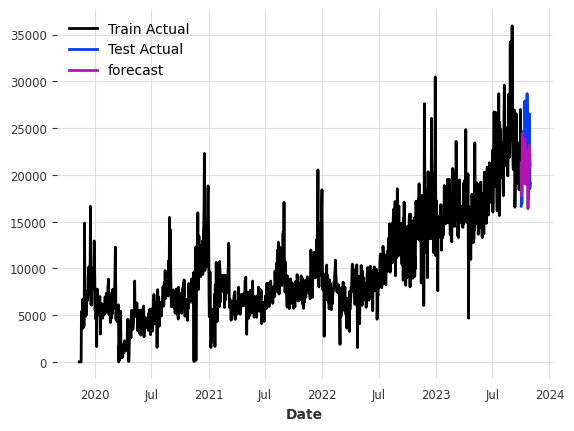

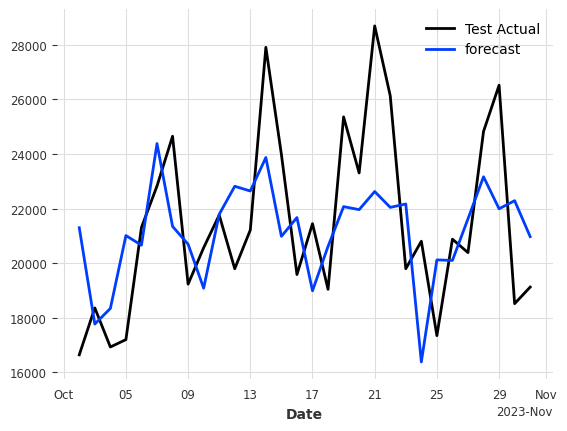

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 13.06%
TEST MAPE = 11.58%
Shop = 10
K-Fold Round = 1
MAPE = 10.41%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.25%
K-Fold Round = 3
MAPE = 9.70%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 14.51%


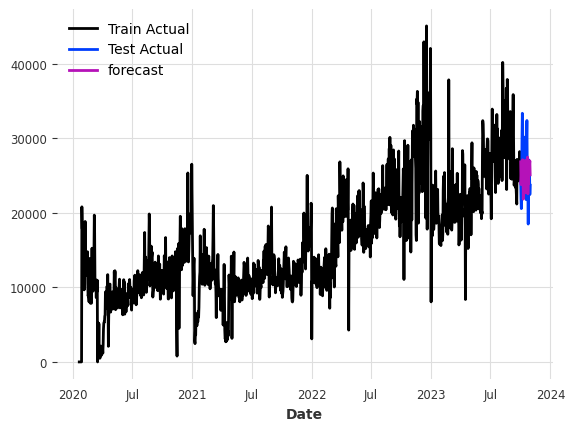

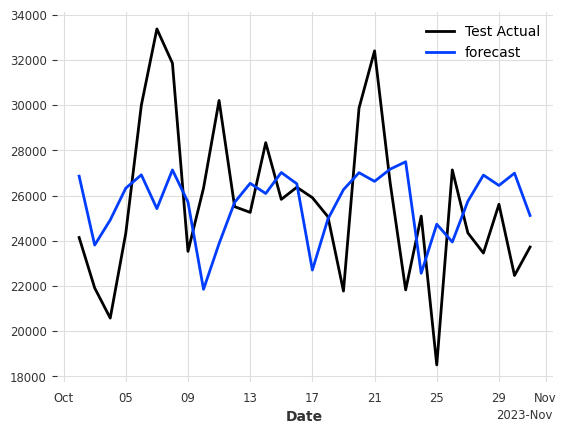

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 11.72%
TEST MAPE = 11.95%
Shop = 11
K-Fold Round = 1
MAPE = 10.77%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.24%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.52%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 14.20%


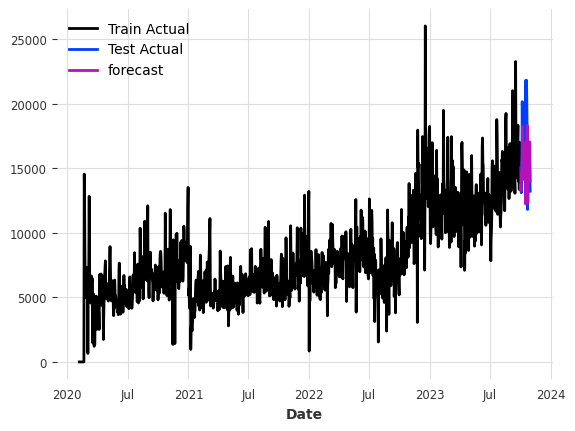

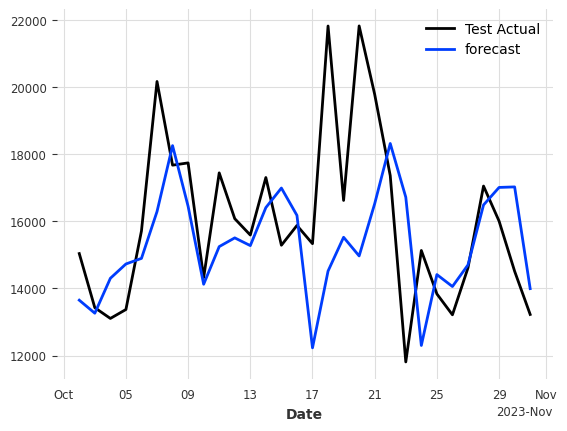

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 12.18%
TEST MAPE = 10.67%
Shop = 12
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.07%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 20.82%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.24%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.96%


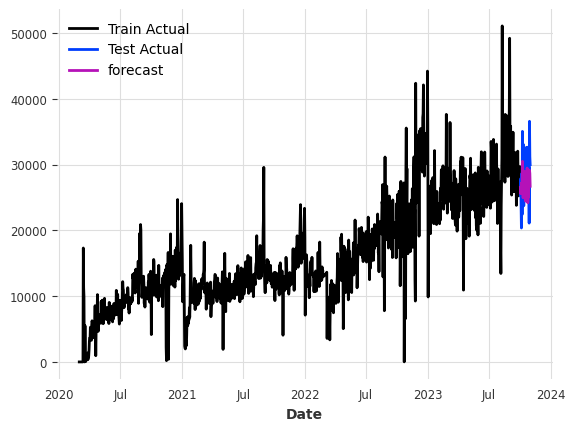

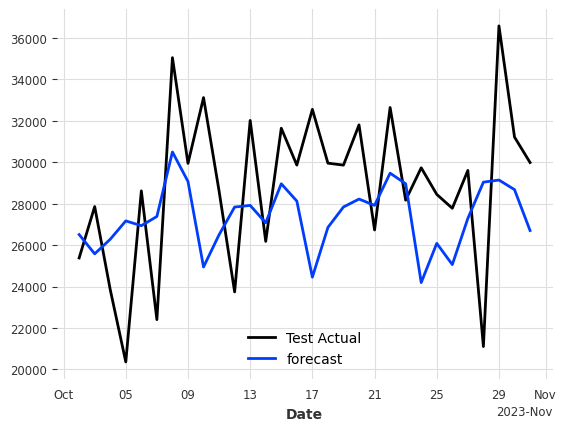

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 13.52%
TEST MAPE = 12.40%
Shop = 13
K-Fold Round = 1
MAPE = 9.30%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.16%
K-Fold Round = 3
MAPE = 11.68%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.99%


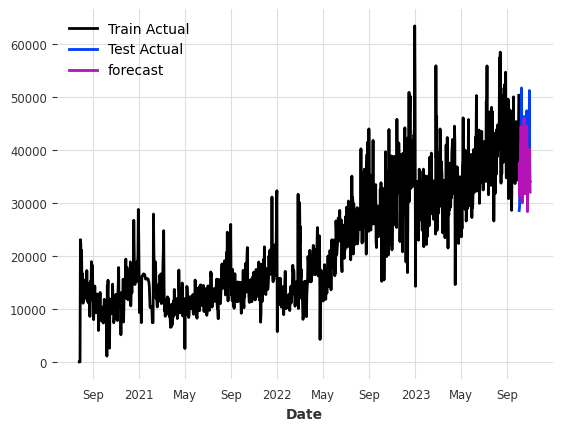

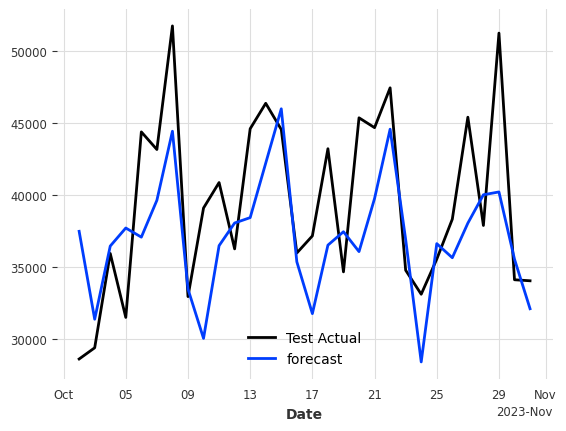

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 11.03%
TEST MAPE = 10.85%
Shop = 14
K-Fold Round = 1
MAPE = 7.59%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.36%
K-Fold Round = 3
MAPE = 8.42%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.12%


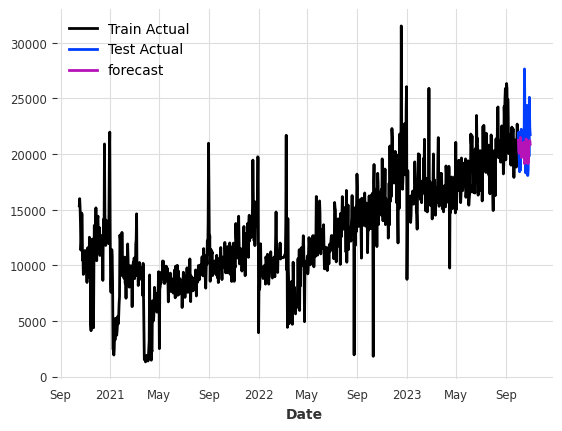

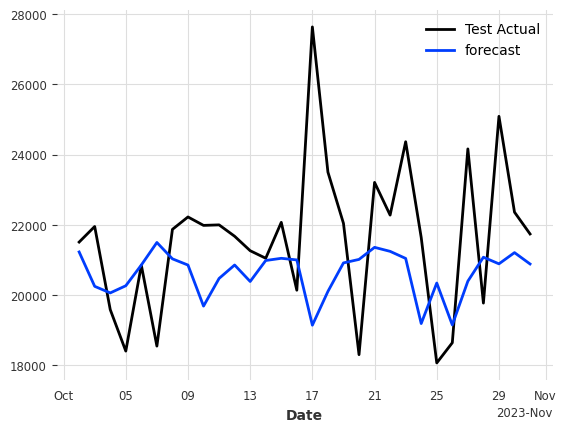

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 8.88%
TEST MAPE = 8.28%
Shop = 15
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.28%
K-Fold Round = 2
MAPE = 7.88%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.20%
K-Fold Round = 4
MAPE = 9.83%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


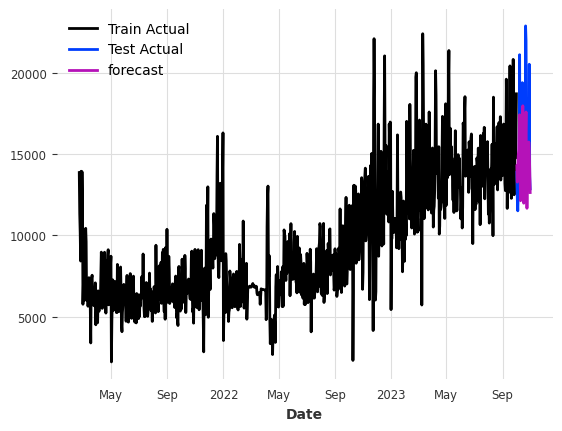

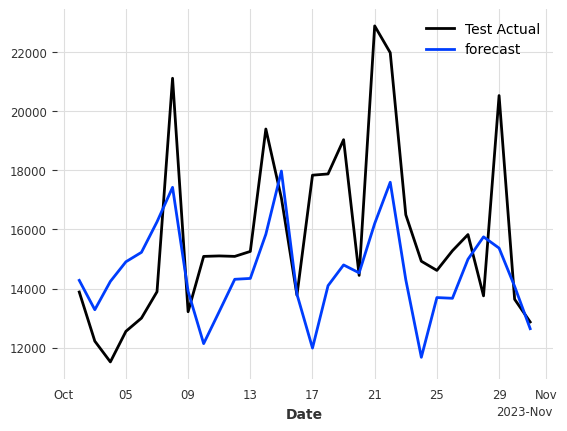

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 10.05%
TEST MAPE = 13.54%
Shop = 16
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 16.42%
K-Fold Round = 2
MAPE = 12.65%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 14.03%
K-Fold Round = 4
MAPE = 8.56%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


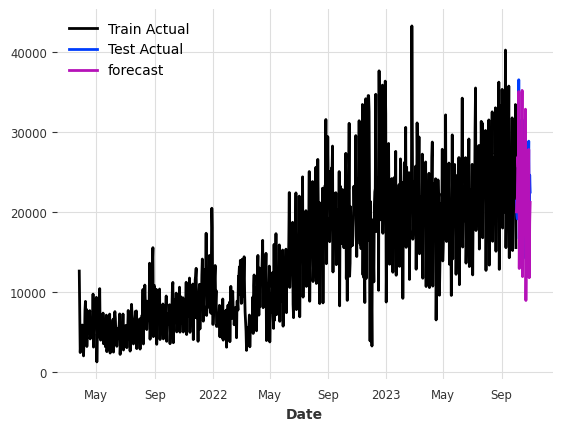

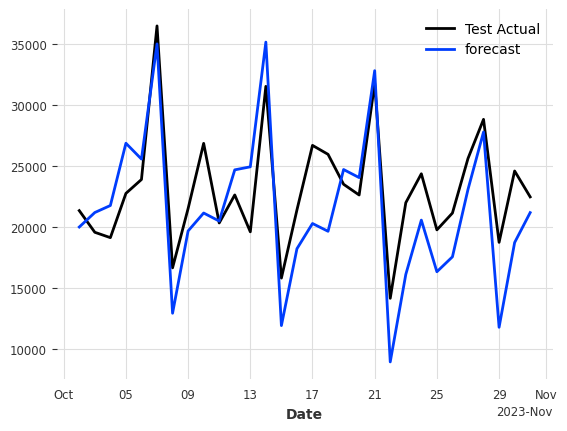

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 12.92%
TEST MAPE = 15.14%
Shop = 18
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.18%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 16.42%
K-Fold Round = 3
MAPE = 7.77%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 7.32%


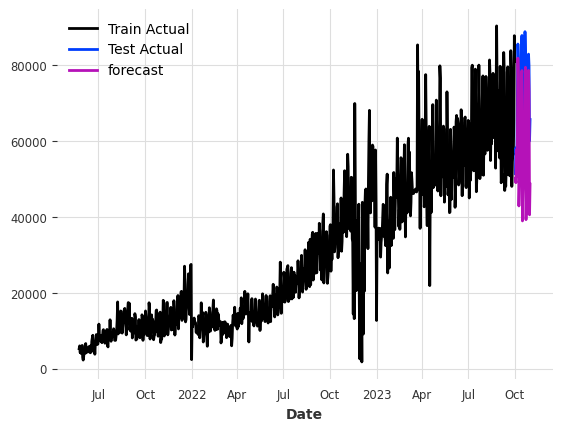

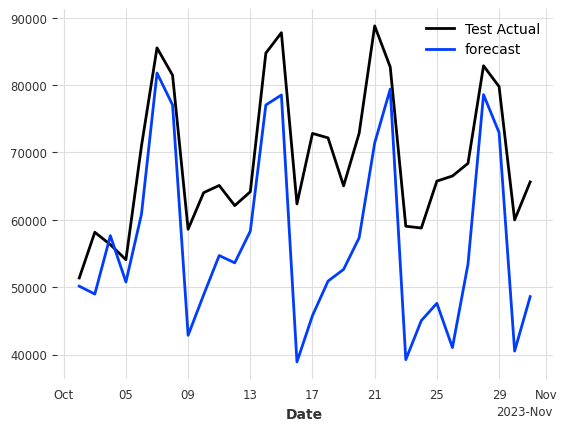

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 10.42%
TEST MAPE = 18.15%
Shop = 17
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 13.30%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 15.63%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.86%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.52%


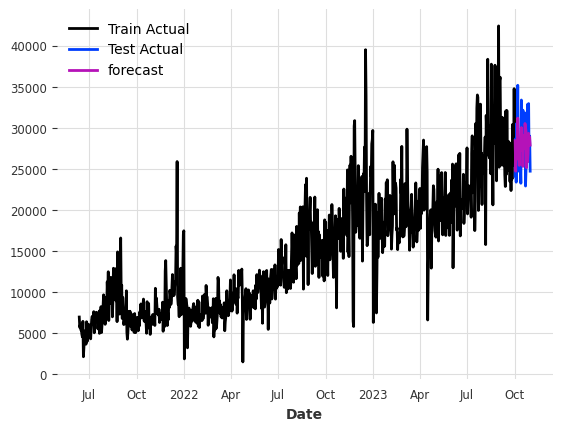

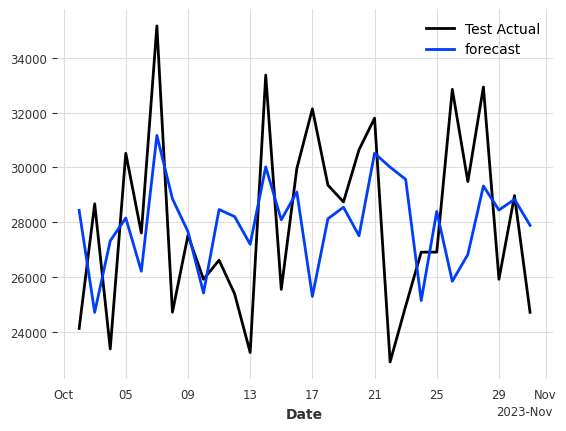

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 12.33%
TEST MAPE = 10.55%
Shop = 19
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.79%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.03%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 11.77%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.15%


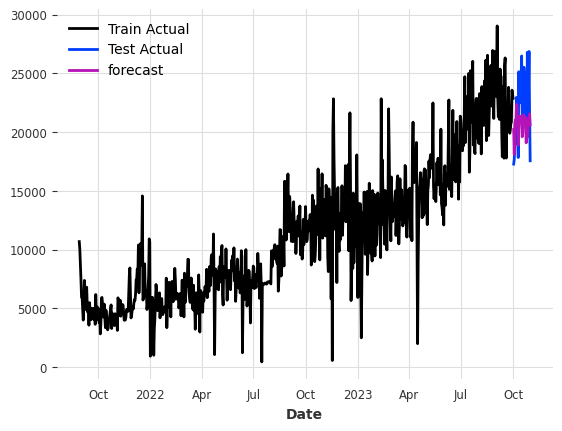

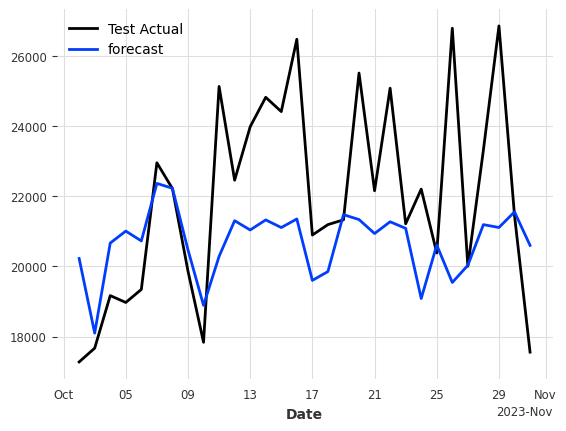

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 11.44%
TEST MAPE = 9.40%
Shop = 20
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.55%
K-Fold Round = 2
MAPE = 13.44%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 8.38%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.33%


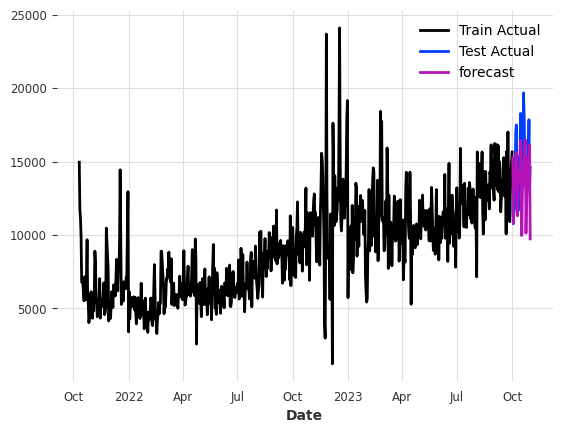

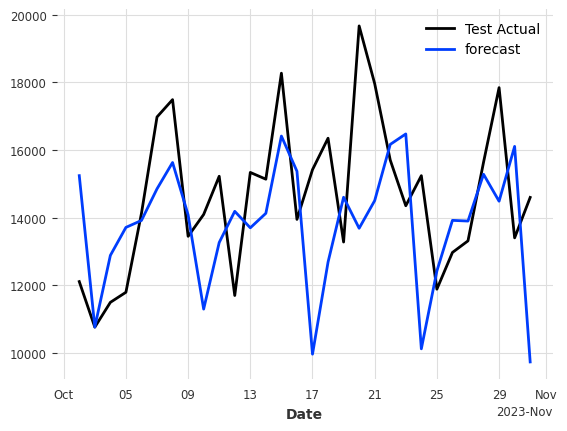

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 10.43%
TEST MAPE = 14.51%
Shop = 21
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.88%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 6.95%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.23%
K-Fold Round = 4
MAPE = 7.35%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


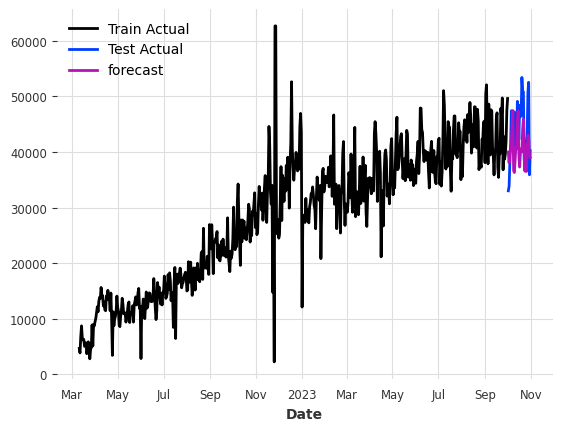

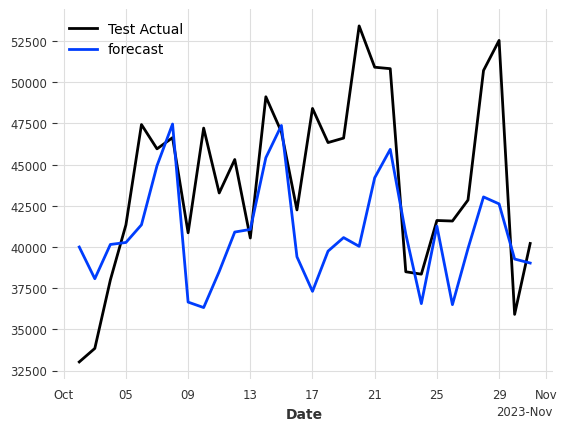

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 8.60%
TEST MAPE = 10.14%
Shop = 23
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 8.72%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 7.63%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 6.65%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 8.78%


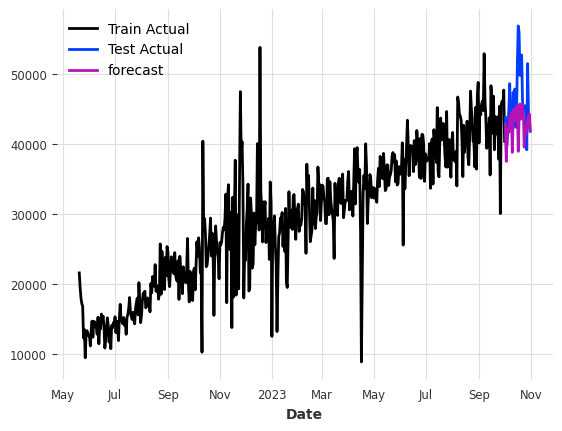

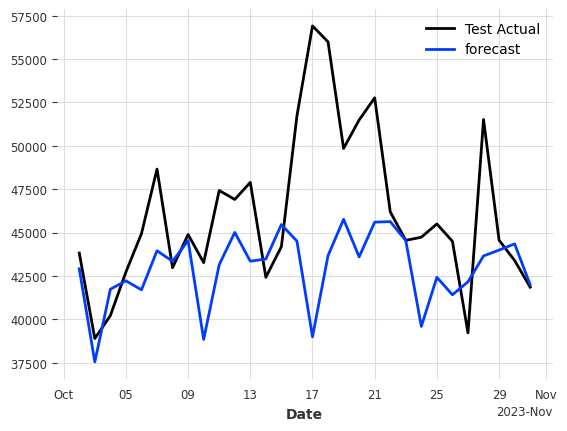

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 7.94%
TEST MAPE = 7.49%
Shop = 24
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 8.73%
K-Fold Round = 2
MAPE = 12.72%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.72%
K-Fold Round = 4
MAPE = 9.92%


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


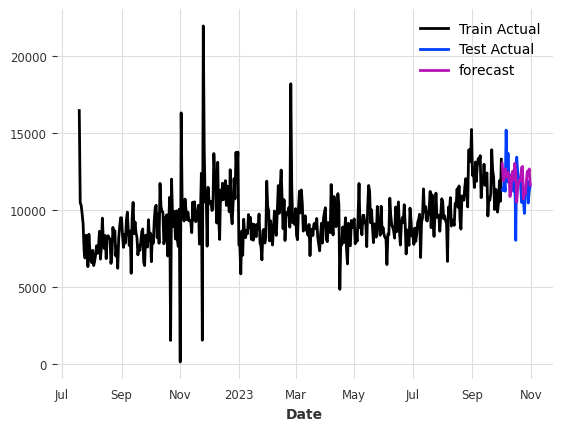

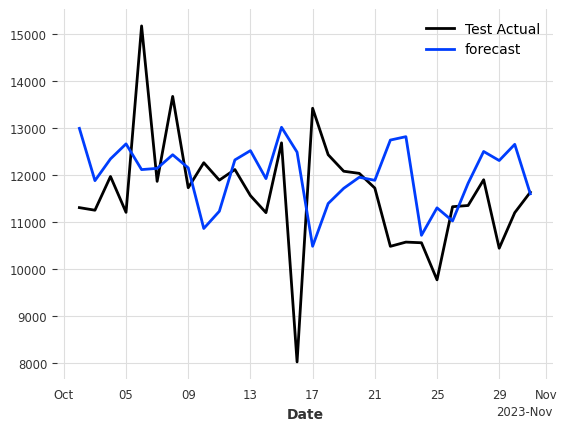

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 10.52%
TEST MAPE = 10.07%
Shop = 22
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 7.93%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 6.14%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 6.48%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 7.20%


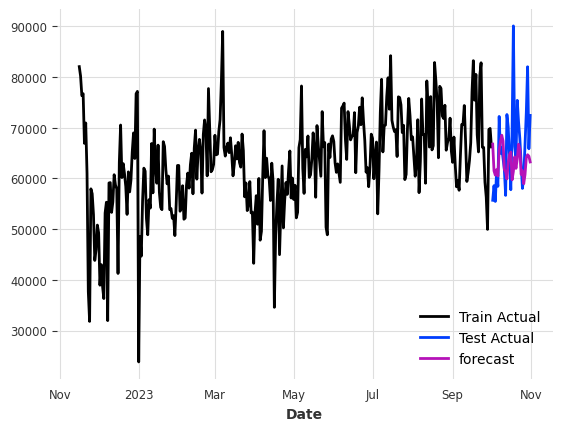

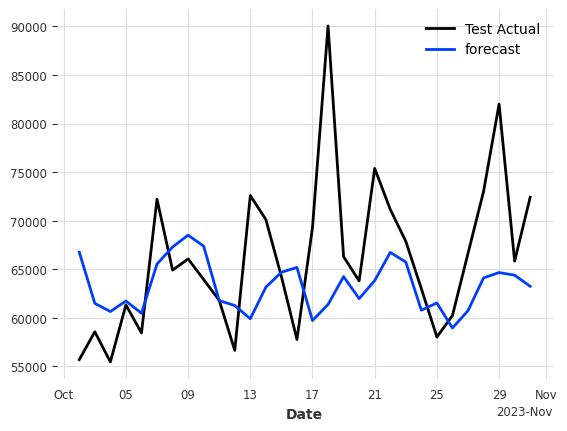

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 6.94%
TEST MAPE = 8.49%
Shop = 26
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 7.57%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.19%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 9.05%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 10.44%


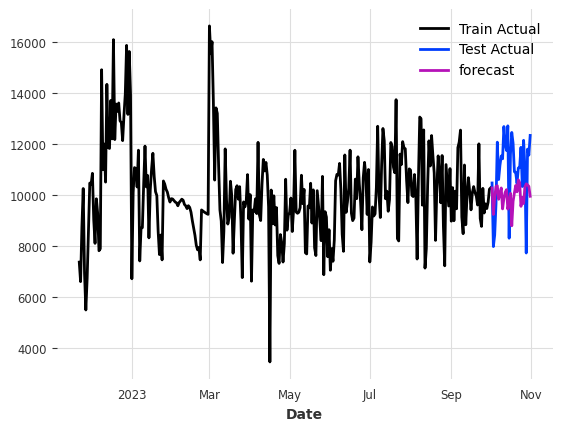

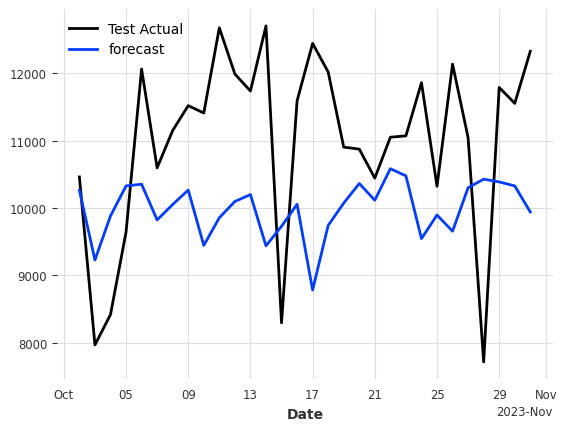

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MEAN Validation MAPE = 9.31%
TEST MAPE = 13.67%
Shop = 25
K-Fold Round = 1


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 7.06%
K-Fold Round = 2


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 7.40%
K-Fold Round = 3


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 6.93%
K-Fold Round = 4


INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


MAPE = 12.34%


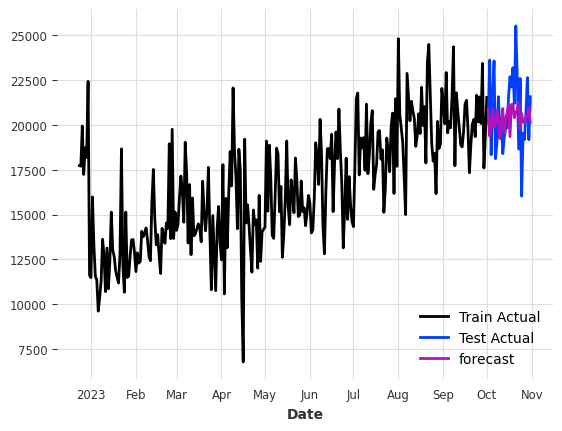

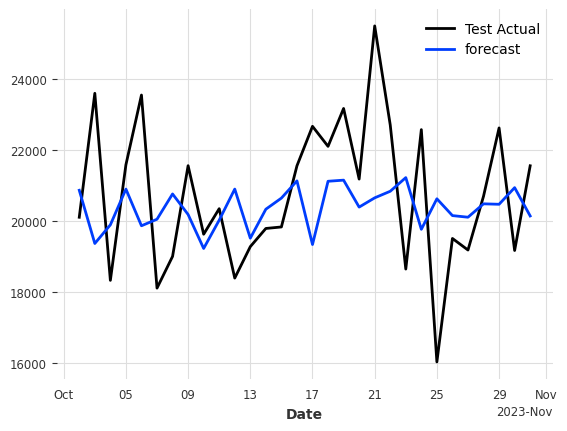

MEAN Validation MAPE = 8.43%
TEST MAPE = 8.38%
Mean TEST MAPE = 11.15%


In [23]:
validation(whole_store_model, train, test, scalers, test_pivot=30, k=4)

In [ ]:
lacking_data = transform_df(shop=[i for i in range(1, 31)], fill_zero=True, only_year=False)
lacking_data = {key: val for key, val in lacking_data.items() if len(val) <= 300}
scaled_lacking_data, scalers_lacking_data = scale_dfs(lacking_data)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop = 27


Predicting: |          | 0/? [00:00<?, ?it/s]

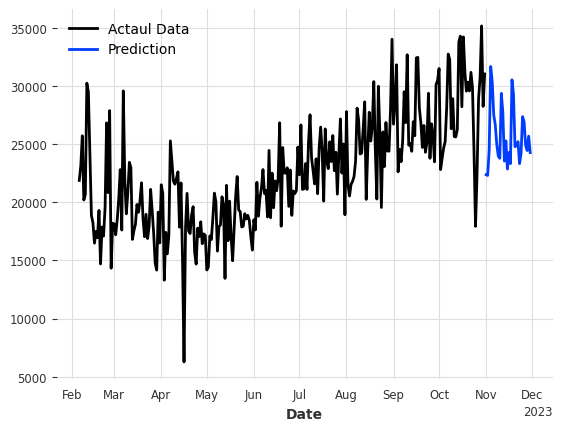

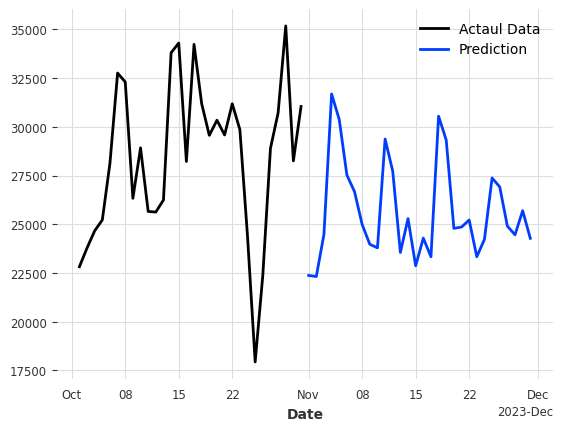

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop = 28


Predicting: |          | 0/? [00:00<?, ?it/s]

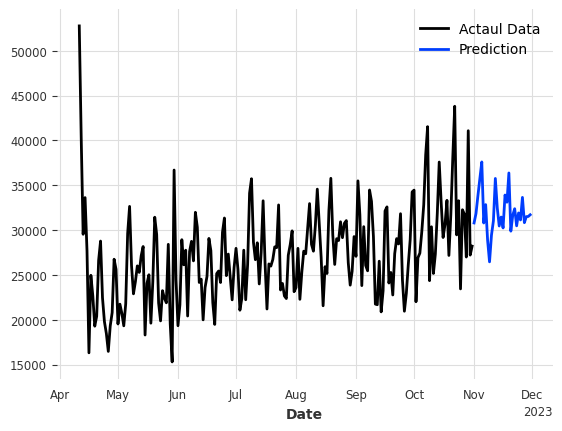

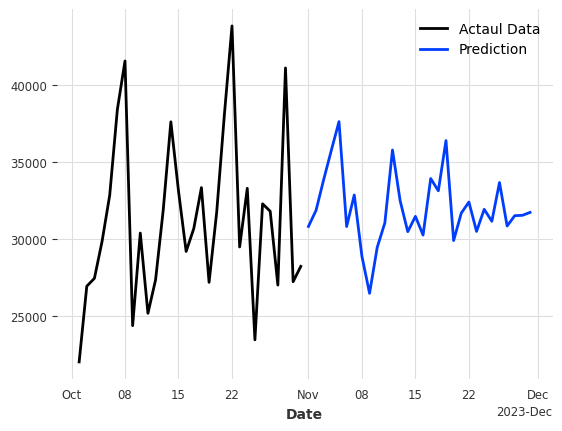

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop = 29


Predicting: |          | 0/? [00:00<?, ?it/s]

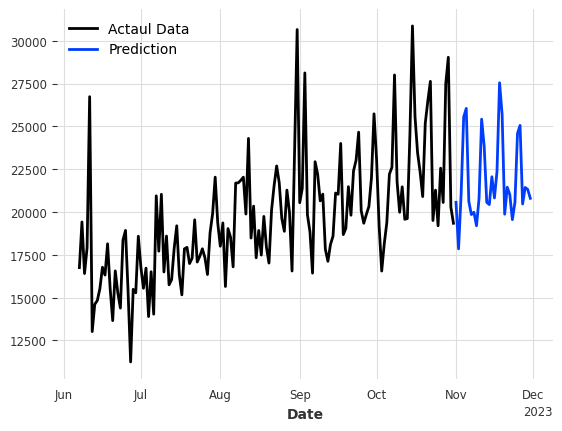

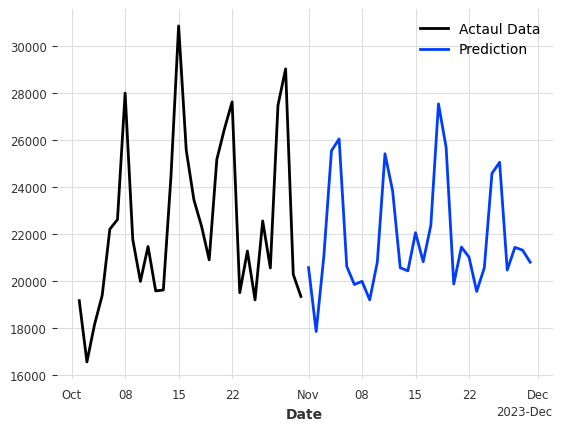

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting shop = 30


Predicting: |          | 0/? [00:00<?, ?it/s]

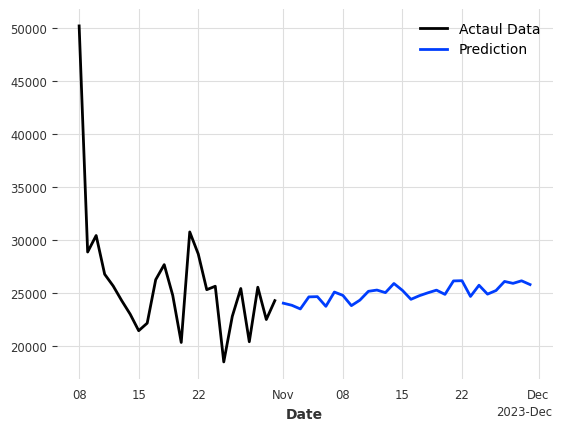

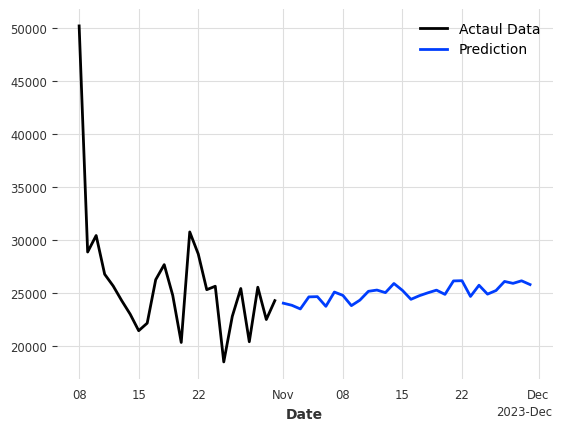

In [55]:
# Forecasting shops with lacking data using model trained on all time series
for key, lacking_data in scaled_lacking_data.items():
  print(f'Predicting shop = {key}')
  prediction = whole_store_model.predict(n=30, series=lacking_data)
  scalers_lacking_data[key].inverse_transform(lacking_data).plot(label='Actaul Data')
  scalers_lacking_data[key].inverse_transform(prediction).plot(label='Prediction')
  plt.show()
  scalers_lacking_data[key].inverse_transform(lacking_data)[-30:].plot(label='Actaul Data')
  scalers_lacking_data[key].inverse_transform(prediction).plot(label='Prediction')
  plt.show()

In [ ]:
# Predicting all ts

In [ ]:
dfs = transform_df(shop=[i for i in range(1, 31)], fill_zero=True)
scaled_dfs, scalers = scale_dfs(dfs)
# train, test = get_train_test(scaled_dfs, 30)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 1, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

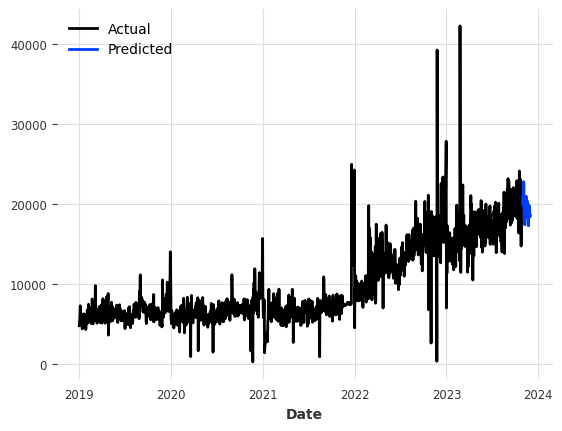

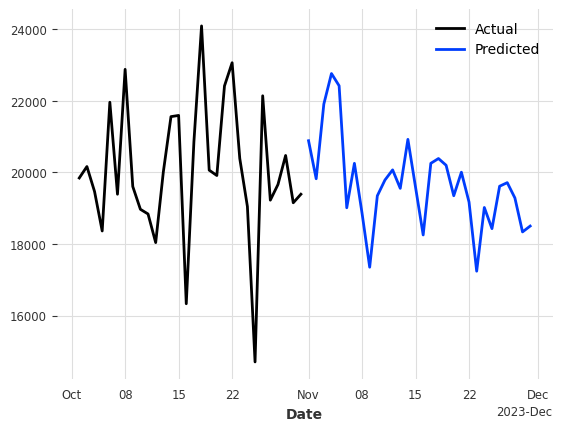

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 2, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

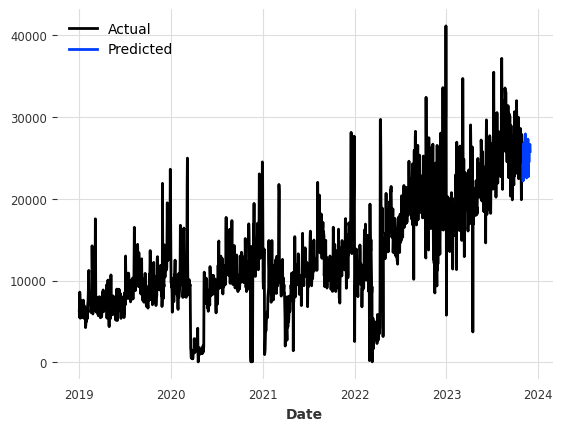

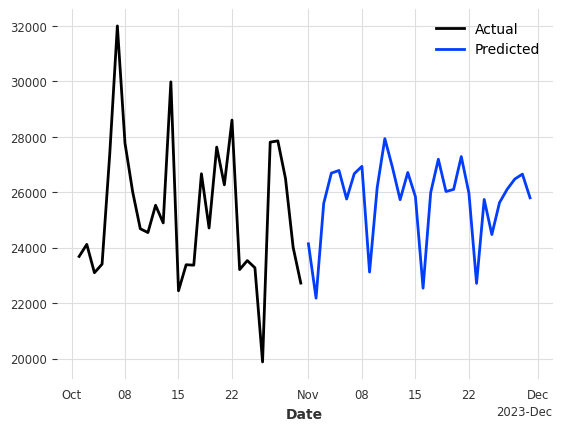

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 3, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

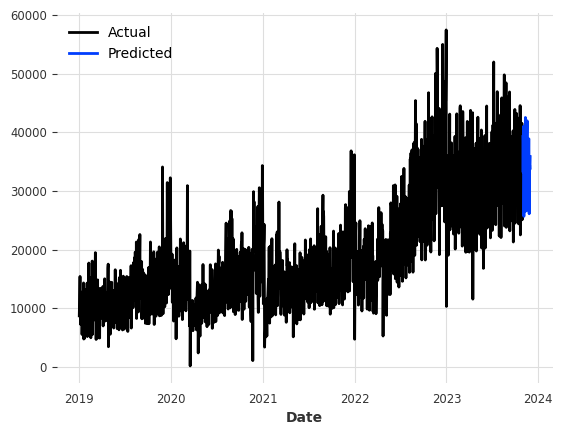

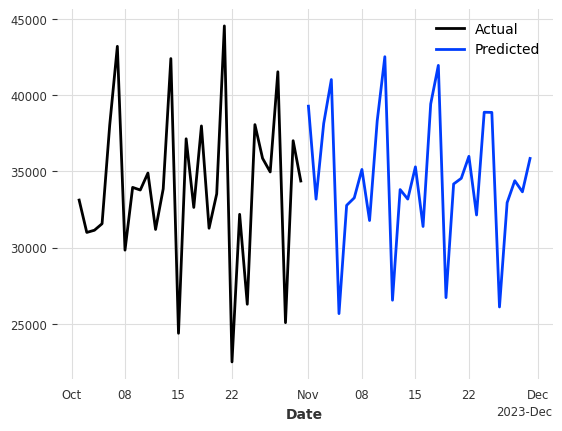

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 4, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

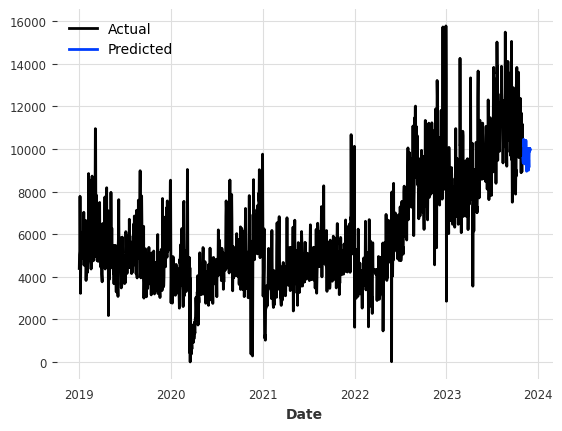

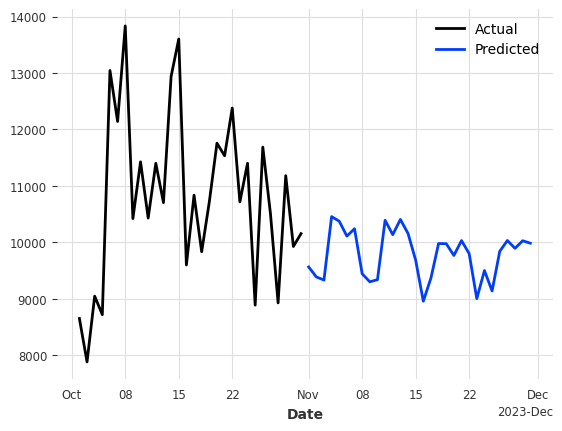

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 5, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

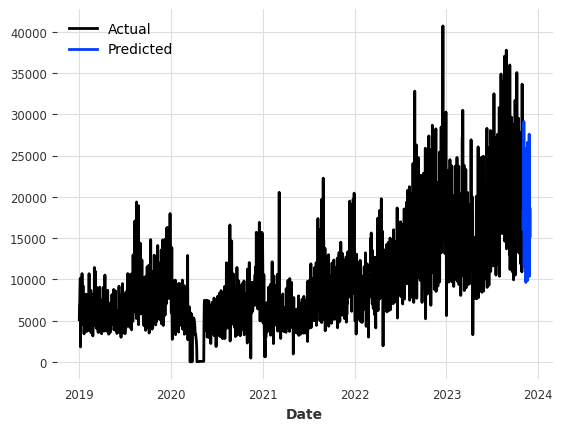

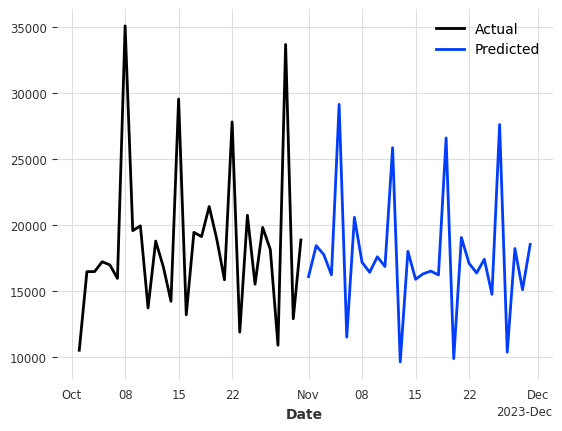

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 6, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

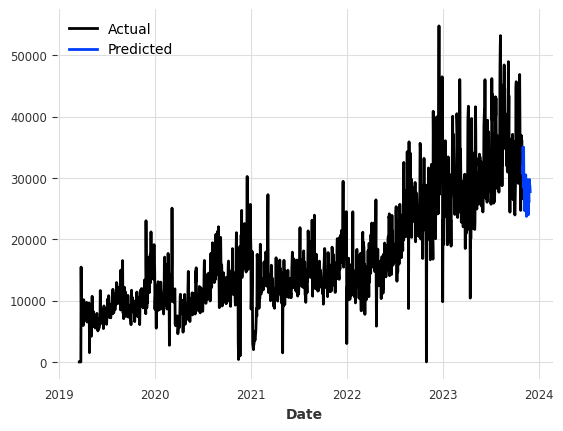

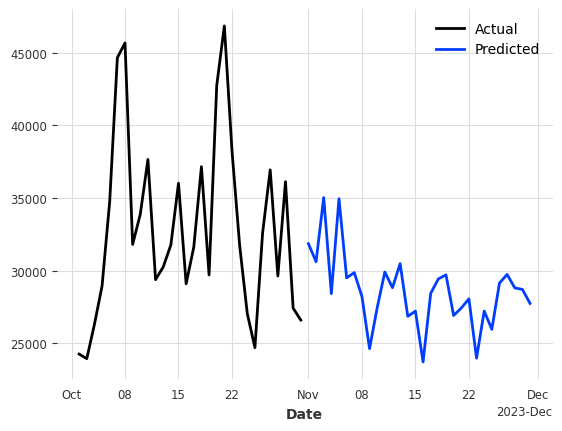

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 7, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

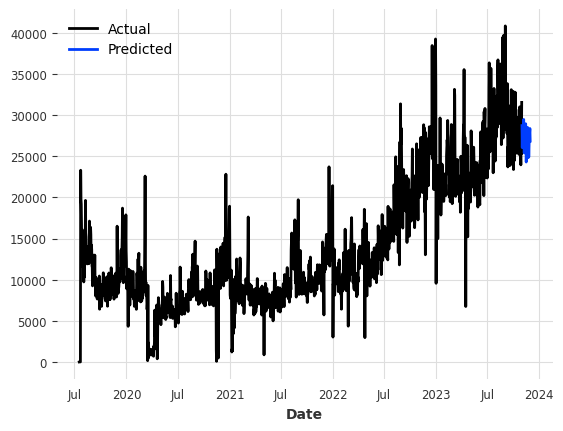

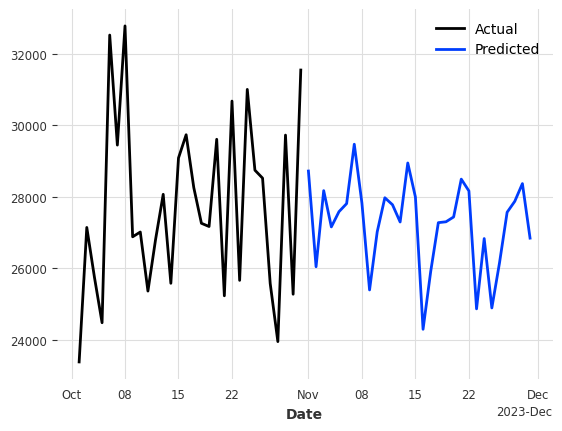

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 8, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

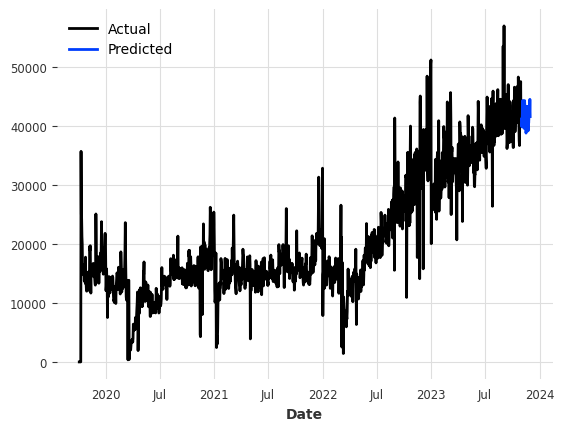

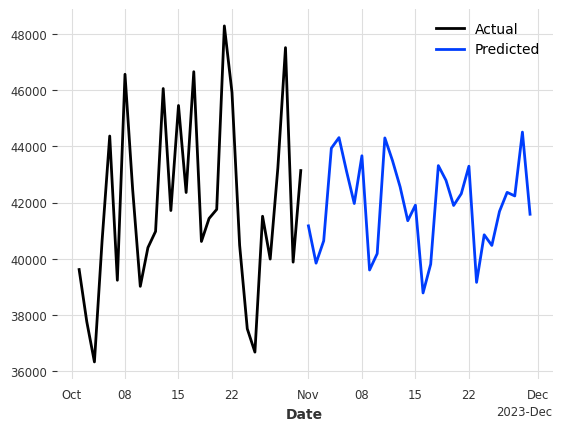

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 9, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

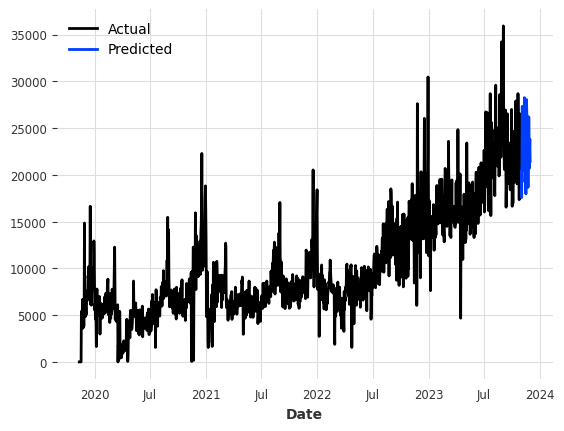

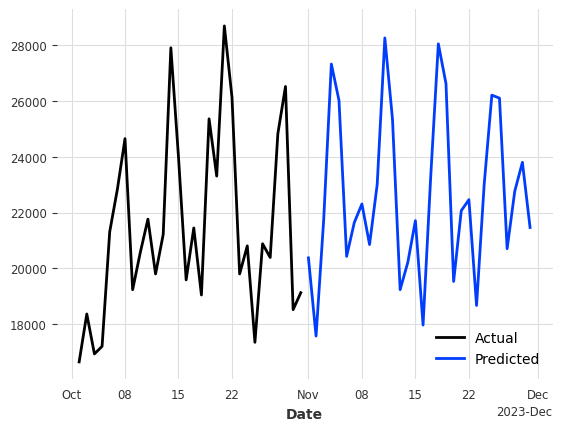

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 10, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

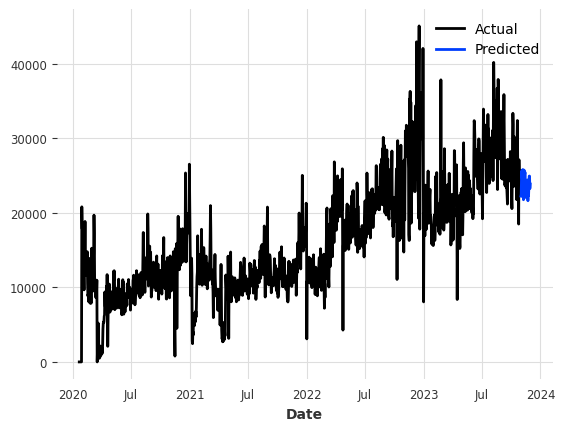

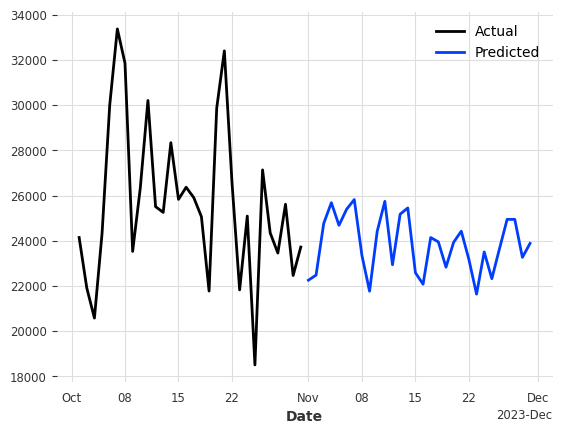

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 11, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

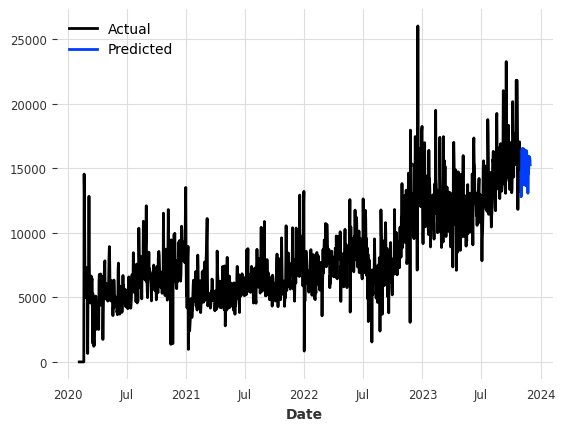

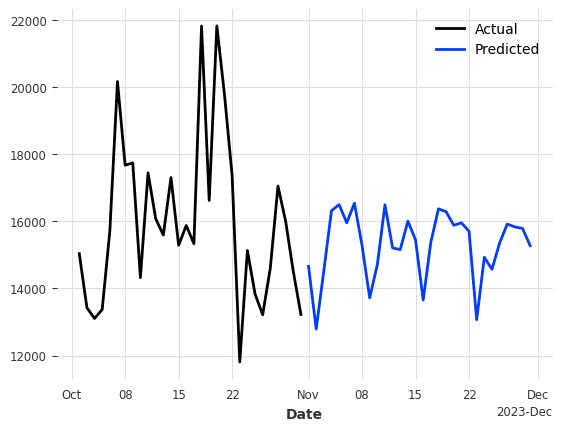

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 12, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

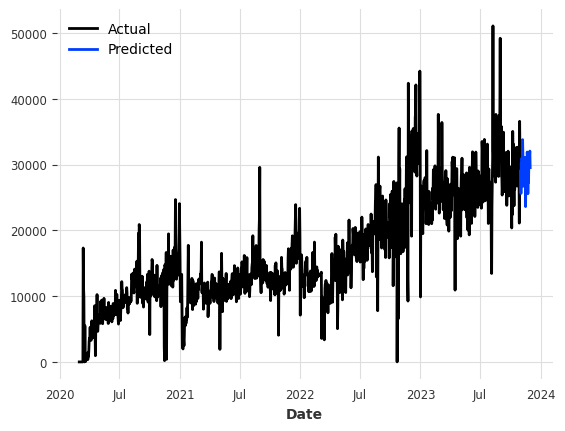

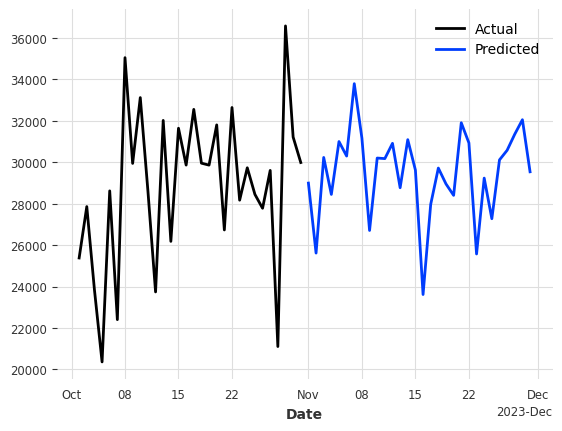

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 13, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

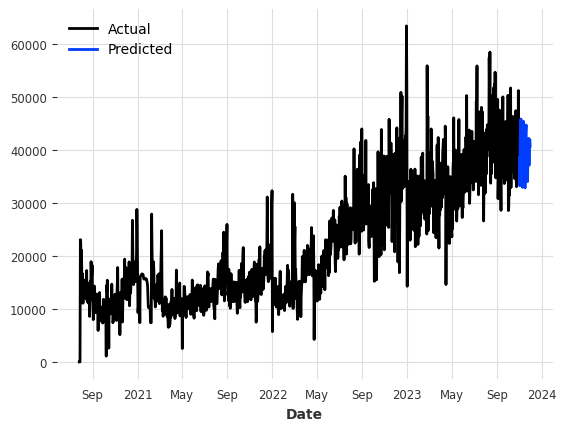

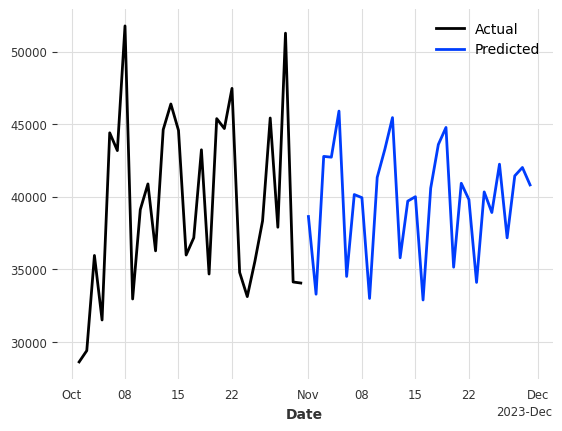

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 14, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

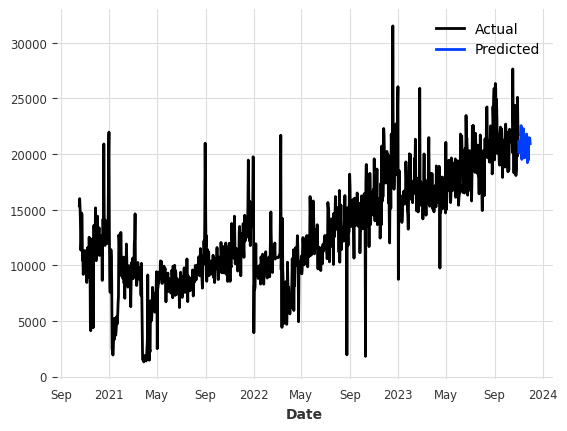

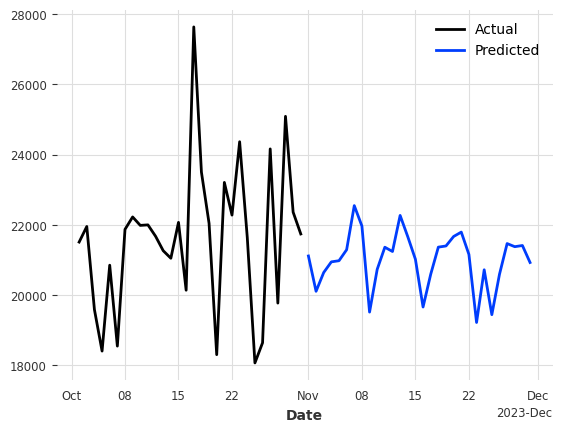

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 15, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

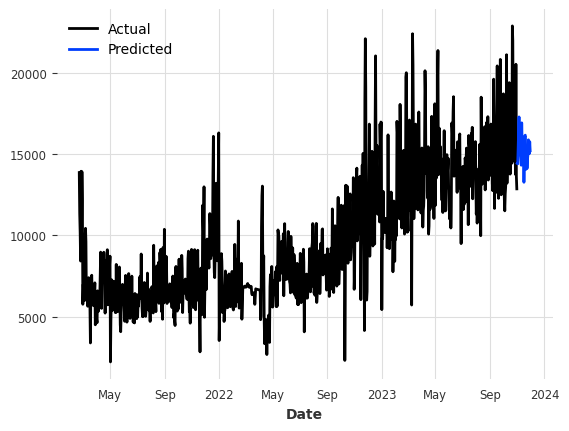

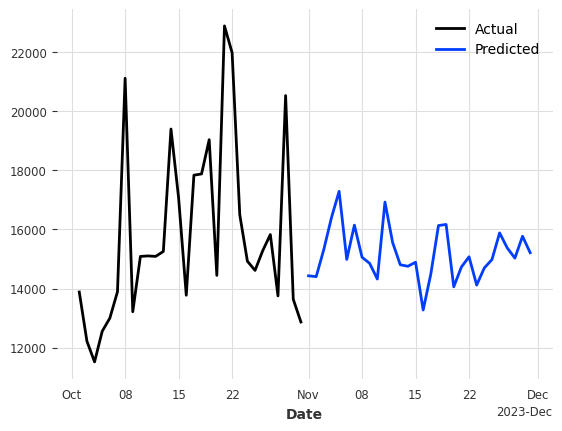

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 16, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

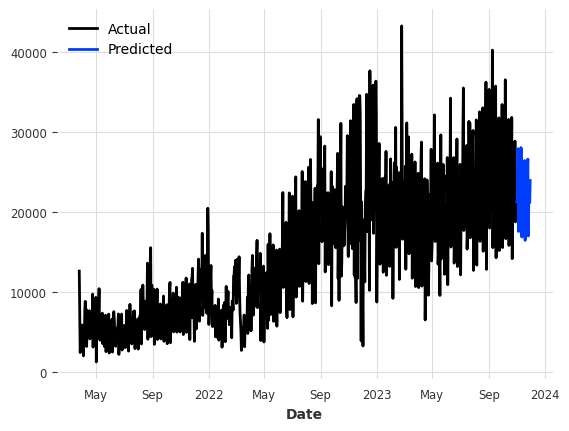

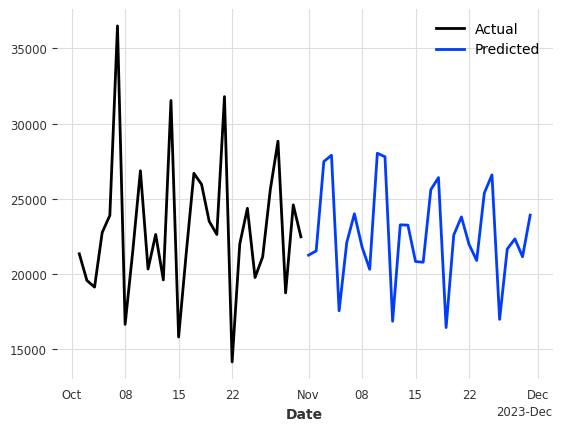

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 18, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

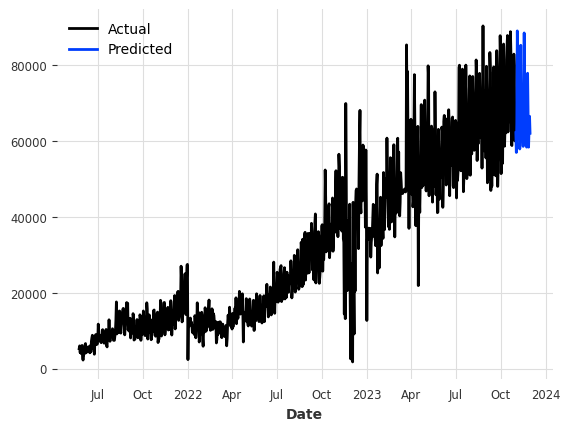

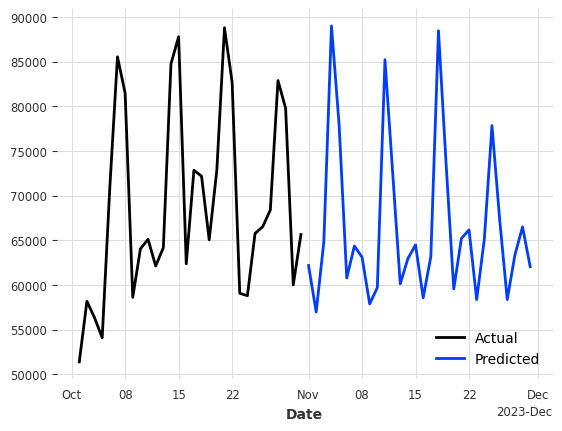

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 17, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

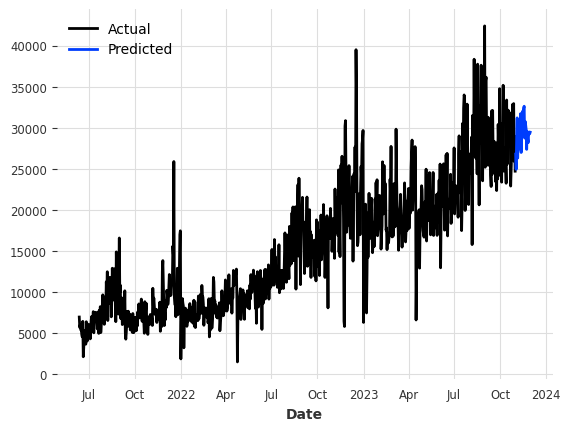

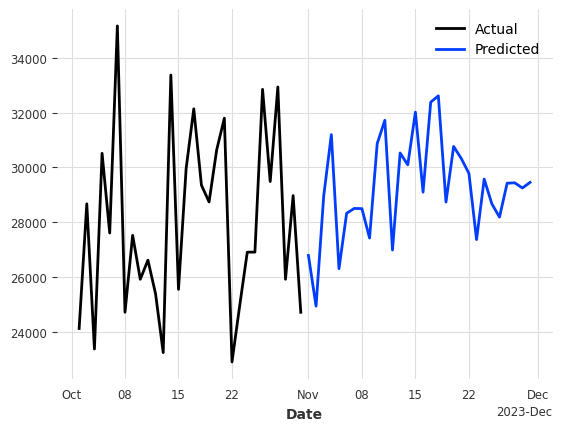

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 19, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

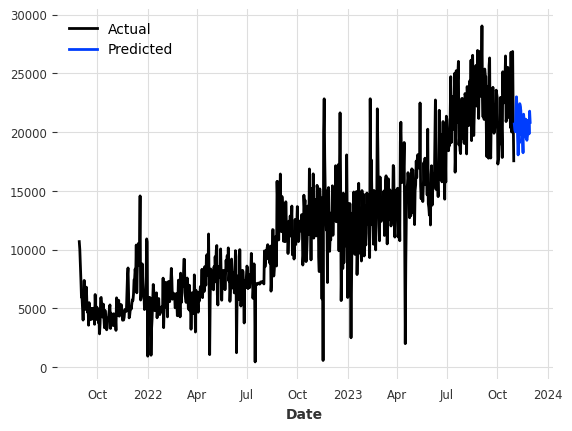

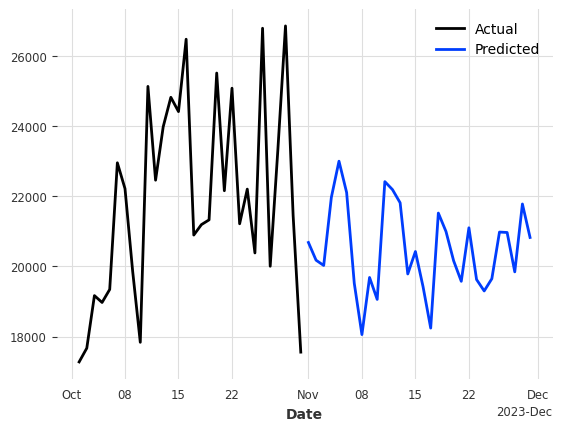

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 20, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

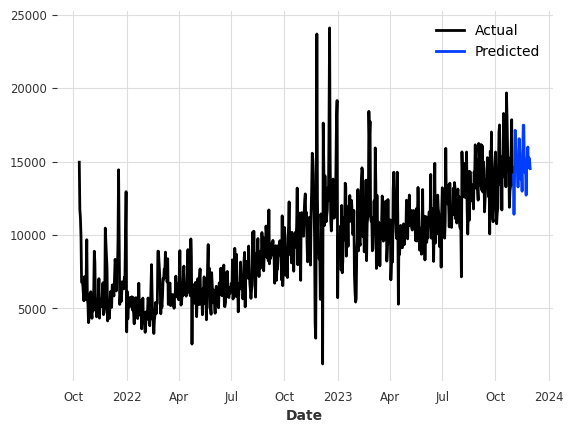

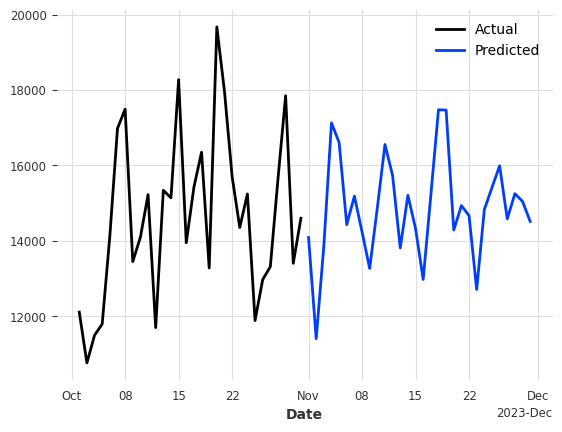

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 21, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

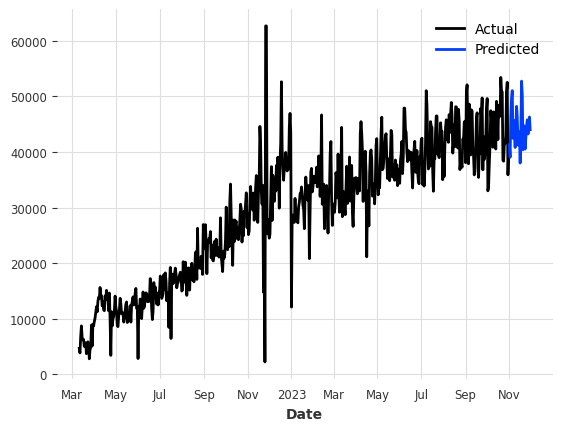

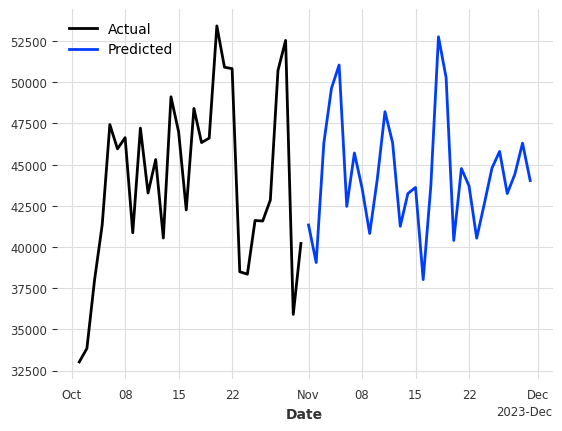

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 23, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

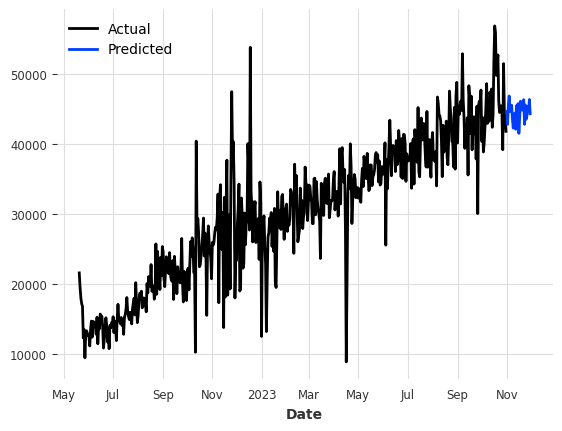

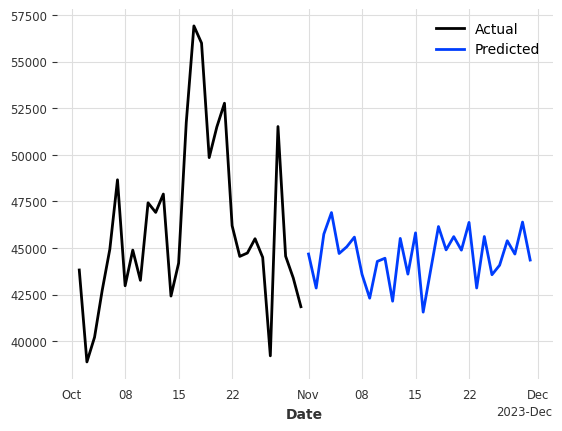

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 24, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

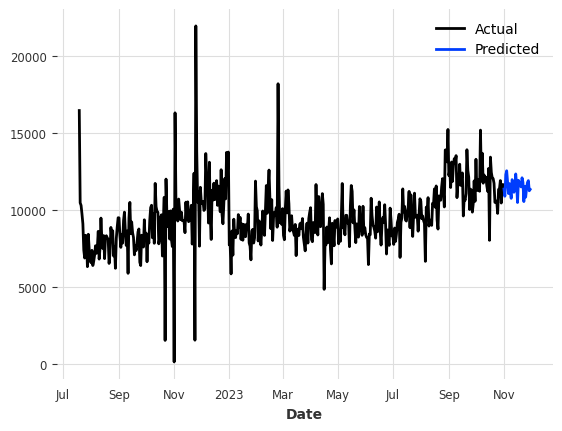

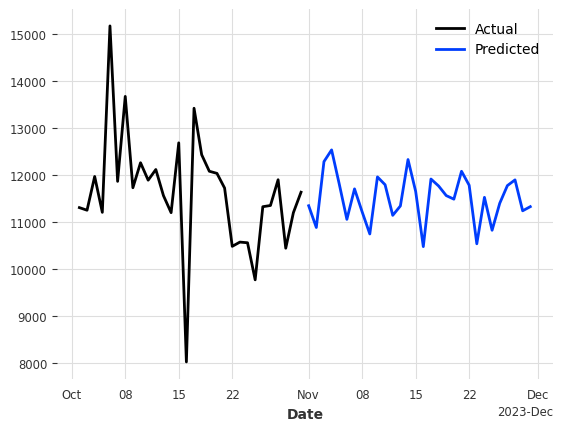

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 22, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

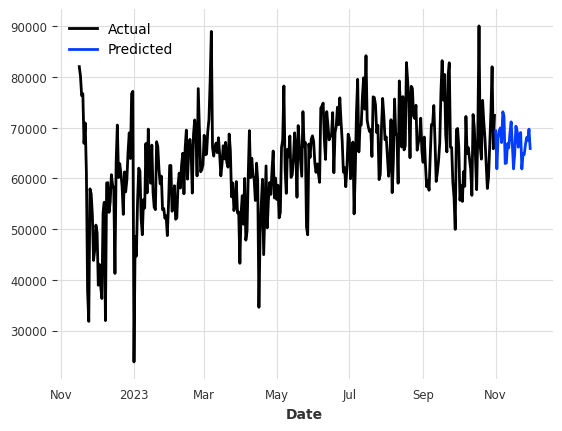

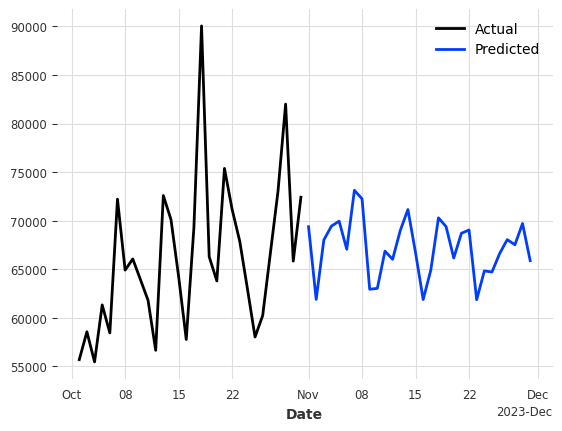

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 26, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

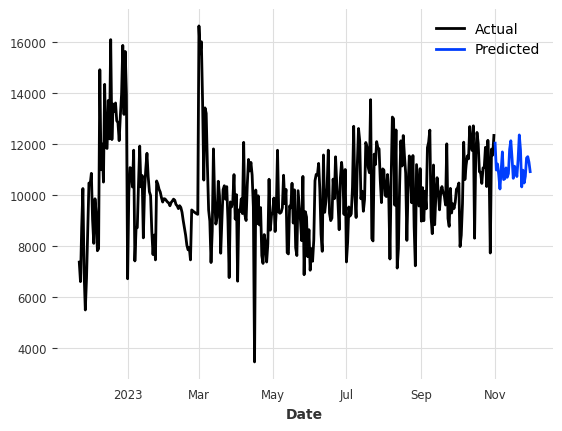

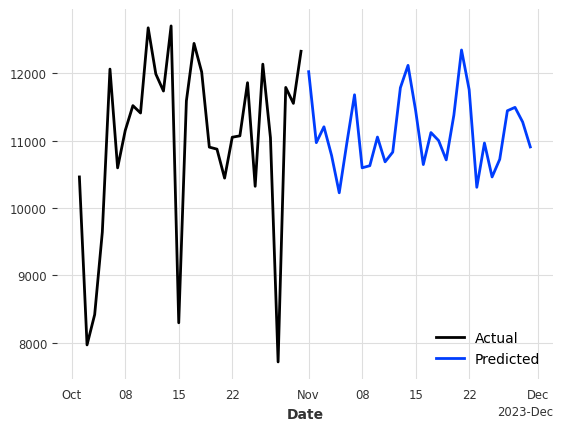

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting for shop = 25, using Whole stores model


Predicting: |          | 0/? [00:00<?, ?it/s]

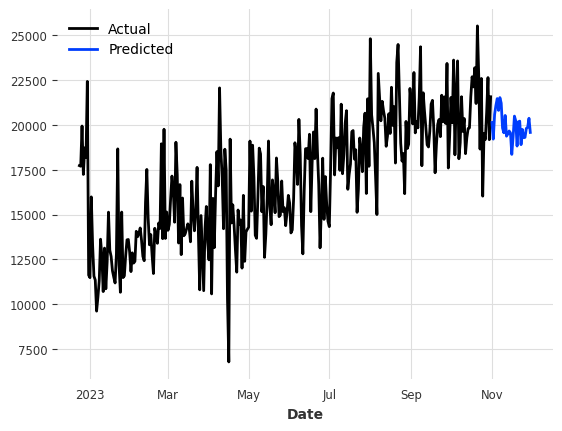

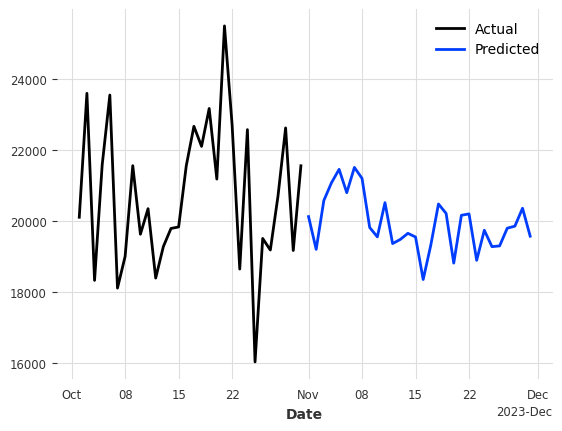

In [23]:
# Prediction for all other time series that have enough data using model trained on all time series
for key, df in scaled_dfs.items():
  print(f'Predicting for shop = {key}, using Whole stores model')
  predictions = whole_store_model.predict(n=30, series=scaled_dfs[key])
  scalers[key].inverse_transform(df).plot(label='Actual')
  scalers[key].inverse_transform(predictions).plot(label='Predicted')
  plt.show()
  scalers[key].inverse_transform(df)[-30:].plot(label='Actual')
  scalers[key].inverse_transform(predictions).plot(label='Predicted')
  plt.show()